# Figure 1 Recreation

## Smarr Data

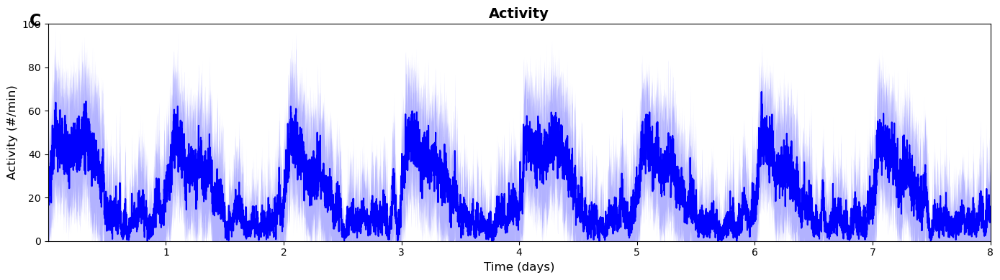

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('mice data.xlsx - FemAct (1).csv')

# Extract female columns
female_cols = [col for col in df.columns if col.startswith('fem')]
female_data = df[female_cols].values

# Calculate mean and SD across females at each timepoint
mean_activity = np.nanmean(female_data, axis=1)
std_activity = np.nanstd(female_data, axis=1)

# Convert time to days (1440 min per day)
time_days = df['time (min)'].values / 1440

# Create the plot matching Figure 1C style
fig, ax = plt.subplots(figsize=(14, 4))

# Plot shaded SD region
ax.fill_between(time_days, 
                mean_activity - std_activity, 
                mean_activity + std_activity, 
                color='blue', alpha=0.3, linewidth=0)

# Plot mean line
ax.plot(time_days, mean_activity, color='blue', linewidth=1.5)

# Style to match paper
ax.set_xlabel('Time (days)', fontsize=12)
ax.set_ylabel('Activity (#/min)', fontsize=12)
ax.set_title('Activity', fontsize=14, fontweight='bold')
ax.set_xlim(0, time_days.max())
ax.set_ylim(0, 100)
ax.set_xticks(range(1, int(time_days.max()) + 1))

# Add panel label
ax.text(-0.02, 1.05, 'C', transform=ax.transAxes, fontsize=16, fontweight='bold', va='top')

plt.tight_layout()
plt.savefig('smarr_activity_recreation.png', dpi=150, bbox_inches='tight')
plt.show()

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import duckdb
from datetime import date

# =============================================================================
# CONFIGURATION
# =============================================================================
S3_BASE = "s3://jax-envision-public-data/study_1001/2025v3.3/tabular"

VEHICLE_CAGES = {
    "Rep1": {
        "cages": [4918, 4922, 4923],
        "analysis_start": "2025-01-10",
        "analysis_end": "2025-01-22",
        "cage_change": date(2025, 1, 15),
    },
    "Rep2": {
        "cages": [4928, 4929, 4934],
        "analysis_start": "2025-01-25",
        "analysis_end": "2025-02-04",
        "cage_change": date(2025, 1, 29),
    },
}

def load_parquet_s3(cage_id, start_date, end_date, table_name):
    conn = duckdb.connect()
    conn.execute("INSTALL httpfs; LOAD httpfs;")
    conn.execute("SET s3_region='us-east-1';")
    
    dates = pd.date_range(start_date, end_date, freq='D')
    all_data = []
    
    for d in dates:
        date_str = d.strftime('%Y-%m-%d')
        path = f"{S3_BASE}/cage_id={cage_id}/date={date_str}/{table_name}"
        try:
            df = conn.execute(f"SELECT * FROM read_parquet('{path}')").fetchdf()
            df['cage_id'] = cage_id
            df['date'] = date_str
            all_data.append(df)
        except:
            continue
    
    conn.close()
    return pd.concat(all_data, ignore_index=True) if all_data else pd.DataFrame()

# =============================================================================
# LOAD DATA
# =============================================================================
print("Loading animal_aggs_short_id.parquet...")
print("=" * 60)

all_activity = []
for rep, cfg in VEHICLE_CAGES.items():
    print(f"\n{rep}:")
    for cage_id in cfg['cages']:
        print(f"  Cage {cage_id}...", end=" ")
        df = load_parquet_s3(cage_id, cfg['analysis_start'], cfg['analysis_end'], 'animal_aggs_short_id.parquet')
        if len(df) > 0:
            df['replicate'] = rep
            all_activity.append(df)
            print(f"{len(df):,} rows")
        else:
            print("No data")

df_activity = pd.concat(all_activity, ignore_index=True)
print(f"\nTotal rows: {len(df_activity):,}")

Loading animal_aggs_short_id.parquet...

Rep1:
  Cage 4918... 

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

6,850,736 rows
  Cage 4922... 

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

6,987,322 rows
  Cage 4923... 

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

6,890,456 rows

Rep2:
  Cage 4928... 

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

6,213,180 rows
  Cage 4929... 

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

5,671,614 rows
  Cage 4934... 

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

6,216,468 rows

Total rows: 38,829,776


In [12]:
# =============================================================================
# CHECK DATA COMPLETENESS
# =============================================================================

print("\n" + "=" * 60)
print("DATA COMPLETENESS CHECK")
print("=" * 60)

# Check unique values
print(f"\nUnique metric names: {df_activity['name'].unique()}")
print(f"Unique resolutions: {df_activity['resolution'].unique()}")

# Filter to our target metric
df_dist = df_activity[
    (df_activity['name'] == 'animal.distance_travelled') & 
    (df_activity['resolution'] == 60)
].copy()

print(f"\nFiltered to distance_travelled @ 60s: {len(df_dist):,} rows")

# Check per cage/replicate
print("\nRows per cage:")
print(df_dist.groupby(['replicate', 'cage_id']).size())

print("\nUnique animals per cage:")
print(df_dist.groupby(['replicate', 'cage_id'])['animal_id'].nunique())

print("\nDate range per cage:")
for (rep, cage), grp in df_dist.groupby(['replicate', 'cage_id']):
    dates = pd.to_datetime(grp['date']).dt.date
    print(f"  {rep} Cage {cage}: {dates.min()} to {dates.max()} ({dates.nunique()} days)")

# Check for gaps in time series
print("\nExpected vs actual days:")
for rep, cfg in VEHICLE_CAGES.items():
    expected_days = (pd.to_datetime(cfg['analysis_end']) - pd.to_datetime(cfg['analysis_start'])).days + 1
    for cage_id in cfg['cages']:
        cage_data = df_dist[(df_dist['replicate'] == rep) & (df_dist['cage_id'] == cage_id)]
        actual_days = cage_data['date'].nunique()
        status = "✓" if actual_days == expected_days else f"⚠ MISSING {expected_days - actual_days} days"
        print(f"  {rep} Cage {cage_id}: {actual_days}/{expected_days} days {status}")

# Check animals per cage (should be 3)
print("\nAnimals per cage (expected: 3):")
for (rep, cage), grp in df_dist.groupby(['replicate', 'cage_id']):
    n_animals = grp['animal_id'].nunique()
    animal_ids = sorted(grp['animal_id'].unique())
    status = "✓" if n_animals == 3 else "⚠"
    print(f"  {rep} Cage {cage}: {n_animals} animals {status} - IDs: {animal_ids}")


DATA COMPLETENESS CHECK

Unique metric names: ['animal.distance_travelled.raw' 'animal.distance_travelled']
Unique resolutions: [ 1 10 60]

Filtered to distance_travelled @ 60s: 314,910 rows

Rows per cage:
replicate  cage_id
Rep1       4918       56073
           4922       55711
           4923       56109
Rep2       4928       50499
           4929       46107
           4934       50411
dtype: int64

Unique animals per cage:
replicate  cage_id
Rep1       4918       4
           4922       4
           4923       4
Rep2       4928       4
           4929       4
           4934       4
Name: animal_id, dtype: int64

Date range per cage:
  Rep1 Cage 4918: 2025-01-10 to 2025-01-22 (13 days)
  Rep1 Cage 4922: 2025-01-10 to 2025-01-22 (13 days)
  Rep1 Cage 4923: 2025-01-10 to 2025-01-22 (13 days)
  Rep2 Cage 4928: 2025-01-25 to 2025-02-04 (11 days)
  Rep2 Cage 4929: 2025-01-25 to 2025-02-03 (10 days)
  Rep2 Cage 4934: 2025-01-25 to 2025-02-04 (11 days)

Expected vs actual days:
  Rep1 

In [13]:
# =============================================================================
# CHECK FOR NULL VALUES & TRACKING ISSUES
# =============================================================================

print("\n" + "=" * 60)
print("NULL VALUE CHECK")
print("=" * 60)

# Check nulls in key columns
print("\nNull counts per column:")
null_counts = df_dist.isnull().sum()
print(null_counts[null_counts > 0] if null_counts.any() else "No nulls found")

# Check for zero/negative values (might indicate tracking failures)
print(f"\nZero values in 'value' column: {(df_dist['value'] == 0).sum():,} ({(df_dist['value'] == 0).mean()*100:.1f}%)")
print(f"Negative values: {(df_dist['value'] < 0).sum():,}")
print(f"NaN values: {df_dist['value'].isna().sum():,}")

# Value distribution
print(f"\nValue distribution:")
print(df_dist['value'].describe())

# =============================================================================
# CHECK ANIMAL ID CONSISTENCY
# =============================================================================

print("\n" + "=" * 60)
print("ANIMAL ID / TRACKING CONSISTENCY")
print("=" * 60)

# Records per animal per cage (should be roughly equal if tracking is good)
print("\nRecords per animal (uneven counts may indicate tracking issues):")
records_per_animal = df_dist.groupby(['replicate', 'cage_id', 'animal_id']).size().reset_index(name='n_records')
print(records_per_animal)

# Check coefficient of variation within each cage (high CV = uneven tracking)
print("\nTracking evenness per cage (CV of record counts - lower is better):")
for (rep, cage), grp in records_per_animal.groupby(['replicate', 'cage_id']):
    counts = grp['n_records']
    cv = counts.std() / counts.mean() * 100
    status = "✓" if cv < 10 else "⚠" if cv < 25 else "⚠⚠"
    print(f"  {rep} Cage {cage}: CV = {cv:.1f}% {status} (counts: {counts.tolist()})")

# Check for animal ID coverage per day (are all 3 animals detected each day?)
print("\nDaily animal detection coverage:")
daily_coverage = df_dist.groupby(['replicate', 'cage_id', 'date'])['animal_id'].nunique().reset_index(name='n_animals')
incomplete_days = daily_coverage[daily_coverage['n_animals'] < 3]
if len(incomplete_days) > 0:
    print(f"  ⚠ {len(incomplete_days)} cage-days with <3 animals detected:")
    print(incomplete_days)
else:
    print("  ✓ All 3 animals detected every day in all cages")

# Check for time gaps within each animal's data
print("\nChecking for time gaps (>5 min) in individual animal traces:")
df_dist_sorted = df_dist.sort_values(['replicate', 'cage_id', 'animal_id', 'time'])
df_dist_sorted['time'] = pd.to_datetime(df_dist_sorted['time'])
df_dist_sorted['time_diff'] = df_dist_sorted.groupby(['cage_id', 'animal_id'])['time'].diff()

# Gaps > 5 minutes (expecting 60s resolution, so >5 min = missing data)
large_gaps = df_dist_sorted[df_dist_sorted['time_diff'] > pd.Timedelta(minutes=5)]
print(f"  Total gaps >5 min: {len(large_gaps):,}")

if len(large_gaps) > 0:
    print("\n  Gap summary per animal:")
    gap_summary = large_gaps.groupby(['replicate', 'cage_id', 'animal_id']).agg(
        n_gaps=('time_diff', 'count'),
        max_gap_min=('time_diff', lambda x: x.max().total_seconds()/60),
        total_missing_min=('time_diff', lambda x: x.sum().total_seconds()/60)
    ).round(1)
    print(gap_summary)


NULL VALUE CHECK

Null counts per column:
No nulls found

Zero values in 'value' column: 6,702 (2.1%)
Negative values: 0
NaN values: 0

Value distribution:
count    314910.000000
mean          0.593144
std           0.867662
min           0.000000
25%           0.086407
50%           0.226906
75%           0.673227
max           8.395418
Name: value, dtype: float64

ANIMAL ID / TRACKING CONSISTENCY

Records per animal (uneven counts may indicate tracking issues):
   replicate  cage_id  animal_id  n_records
0       Rep1     4918          0       5143
1       Rep1     4918       9257      16894
2       Rep1     4918       9258      17170
3       Rep1     4918       9259      16866
4       Rep1     4922          0       4529
5       Rep1     4922       9260      17074
6       Rep1     4922       9261      17209
7       Rep1     4922       9262      16899
8       Rep1     4923          0       5541
9       Rep1     4923       9263      16313
10      Rep1     4923       9264      17081
11 

In [16]:
df_activity.isnull().sum()

time               0
animal_id          0
value              0
resolution         0
units              0
name               0
organization_id    0
cage_id            0
study_id           0
device_id          0
ULID               0
version_str        0
run_id             0
filename           0
source_file        0
date               0
replicate          0
dtype: int64

## Morph2Rep Activity data


Filtered to distance_travelled @ 60s: 314,910 rows
Unique animals: 19


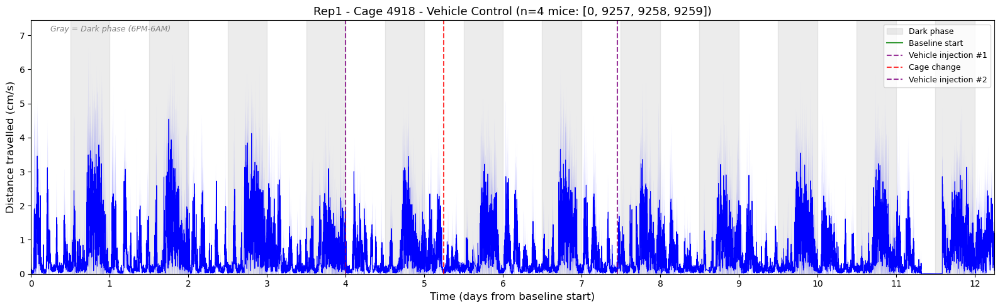

Saved: morph2rep_activity_Rep1_cage4918.png


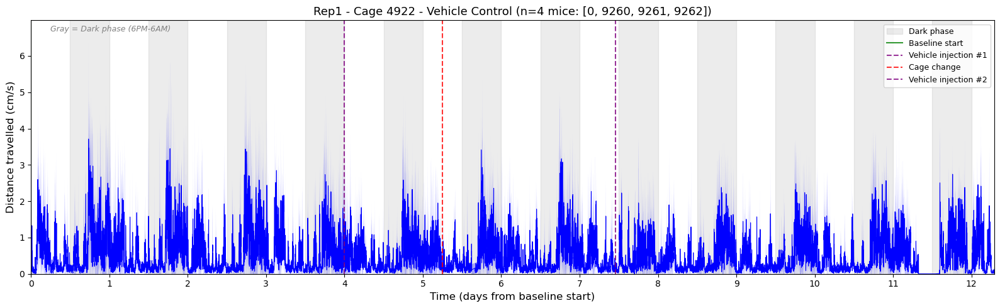

Saved: morph2rep_activity_Rep1_cage4922.png


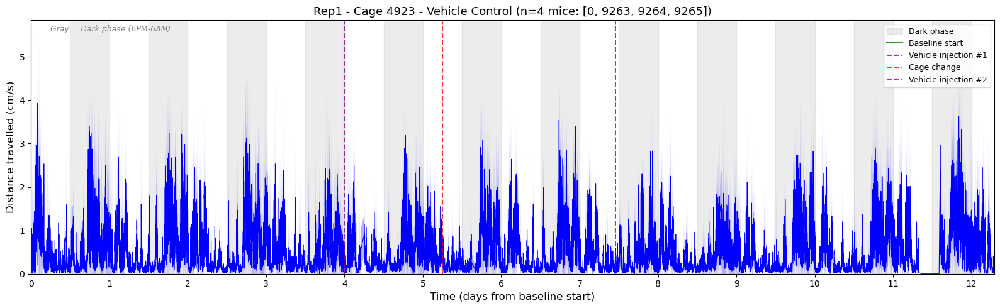

Saved: morph2rep_activity_Rep1_cage4923.png


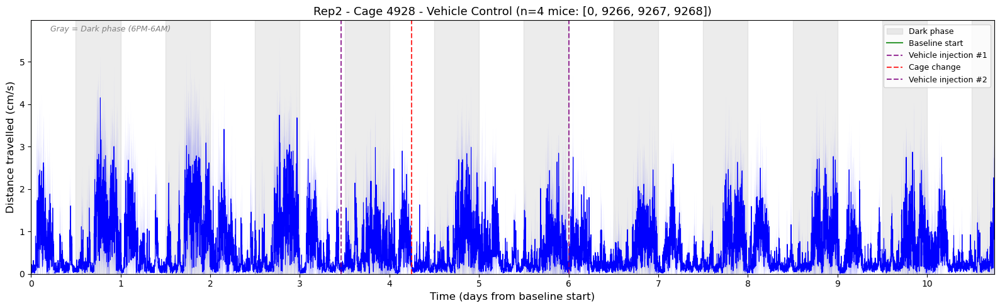

Saved: morph2rep_activity_Rep2_cage4928.png


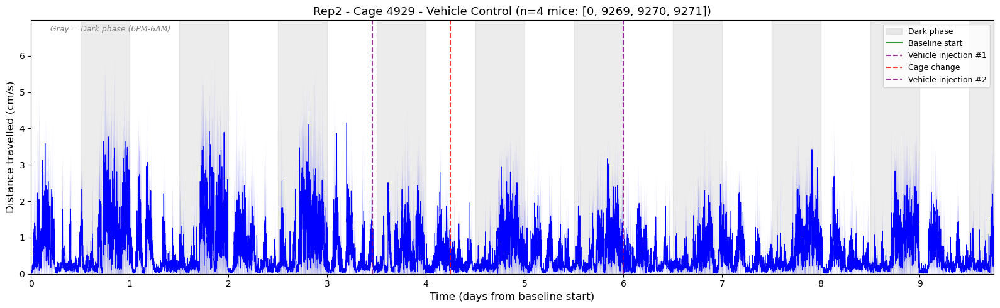

Saved: morph2rep_activity_Rep2_cage4929.png


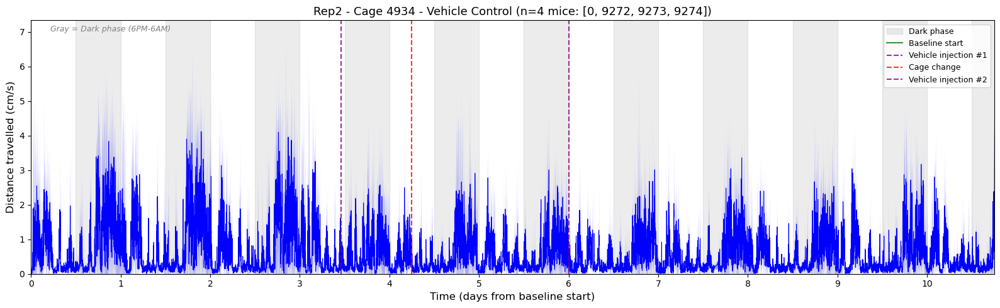

Saved: morph2rep_activity_Rep2_cage4934.png


In [19]:
# =============================================================================
# FILTER DATA
# =============================================================================
df_dist = df_activity[
    (df_activity['name'] == 'animal.distance_travelled') & 
    (df_activity['resolution'] == 60)
].copy()

print(f"\nFiltered to distance_travelled @ 60s: {len(df_dist):,} rows")
print(f"Unique animals: {df_dist['animal_id'].nunique()}")

df_dist['time'] = pd.to_datetime(df_dist['time'])

# =============================================================================
# EVENT DEFINITIONS
# =============================================================================
from datetime import datetime

EVENTS = {
    "Rep1": {
        "analysis_start": datetime(2025, 1, 10, 6, 0),  # Day 0
        "events": [
            # (datetime, label, color, linestyle)
            (datetime(2025, 1, 10, 6, 0), "Baseline start", "green", "-"),
            (datetime(2025, 1, 14, 6, 0), "Vehicle injection #1", "purple", "--"),
            (datetime(2025, 1, 15, 12, 0), "Cage change", "red", "--"),
            (datetime(2025, 1, 17, 17, 0), "Vehicle injection #2", "purple", "--"),
        ],
        "light_cycle_start": 6,   # 6 AM
        "light_cycle_end": 18,    # 6 PM
    },
    "Rep2": {
        "analysis_start": datetime(2025, 1, 25, 6, 0),  # Day 0
        "events": [
            (datetime(2025, 1, 25, 6, 0), "Baseline start", "green", "-"),
            (datetime(2025, 1, 28, 17, 0), "Vehicle injection #1", "purple", "--"),
            (datetime(2025, 1, 29, 12, 0), "Cage change", "red", "--"),
            (datetime(2025, 1, 31, 6, 0), "Vehicle injection #2", "purple", "--"),
        ],
        "light_cycle_start": 6,
        "light_cycle_end": 18,
    },
}

# =============================================================================
# PLOT - Smarr style (mean ± SD) - ONE PLOT PER CAGE WITH EVENTS
# =============================================================================
for rep, cfg in VEHICLE_CAGES.items():
    start_time = EVENTS[rep]["analysis_start"]
    
    for cage_id in cfg['cages']:
        cage_data = df_dist[(df_dist['replicate'] == rep) & (df_dist['cage_id'] == cage_id)].copy()
        
        if len(cage_data) == 0:
            print(f"No data for {rep} Cage {cage_id}")
            continue
        
        cage_data['days'] = (cage_data['time'] - start_time).dt.total_seconds() / 86400
        cage_data['time_bin'] = cage_data['time'].dt.floor('1min')
        
        # Mean and SD across animals in this cage at each timepoint
        grouped = cage_data.groupby('time_bin')['value'].agg(['mean', 'std']).reset_index()
        grouped['days'] = (grouped['time_bin'] - start_time).dt.total_seconds() / 86400
        
        fig, ax = plt.subplots(figsize=(16, 5))
        
        # Light/dark shading FIRST (so it's behind everything)
        max_days = int(np.ceil(grouped['days'].max()))
        for day in range(-1, max_days + 2):
            # Dark phase: 6 PM (0.5) to 6 AM next day (1.0)
            # In fractional days from midnight: dark = 0.75 to 1.25
            dark_start = day + 0.5   # 6 PM = 18/24 = 0.75... wait let me recalc
            # If day 0 starts at 6 AM, then:
            # 6 AM = 0.0, 6 PM = 0.5, midnight = 0.75, 6 AM next = 1.0
            ax.axvspan(day + 0.5, day + 1.0, alpha=0.15, color='gray', label='Dark phase' if day == 0 else '')
        
        # Shaded SD region
        ax.fill_between(
            grouped['days'],
            grouped['mean'] - grouped['std'],
            grouped['mean'] + grouped['std'],
            color='blue', alpha=0.3, linewidth=0
        )
        
        # Mean line
        ax.plot(grouped['days'], grouped['mean'], color='blue', linewidth=0.8)
        
        # Event markers
        added_labels = set()
        for event_time, label, color, linestyle in EVENTS[rep]["events"]:
            event_day = (event_time - start_time).total_seconds() / 86400
            if 0 <= event_day <= grouped['days'].max():
                # Avoid duplicate legend entries
                legend_label = label if label not in added_labels else ''
                added_labels.add(label)
                ax.axvline(x=event_day, color=color, linestyle=linestyle, alpha=0.8, 
                          linewidth=1.5, label=legend_label)
        
        # Formatting
        n_animals = cage_data['animal_id'].nunique()
        animal_ids = sorted(cage_data['animal_id'].unique())
        
        ax.set_xlabel('Time (days from baseline start)', fontsize=12)
        ax.set_ylabel('Distance travelled (cm/s)', fontsize=12)
        ax.set_title(f'{rep} - Cage {cage_id} - Vehicle Control (n={n_animals} mice: {animal_ids})', fontsize=13)
        ax.set_xlim(0, grouped['days'].max())
        ax.set_ylim(0, None)
        
        # Add day ticks
        ax.set_xticks(range(0, int(grouped['days'].max()) + 1))
        
        # Legend outside plot
        ax.legend(loc='upper right', fontsize=9)
        
        # Add text annotation for light cycle
        ax.text(0.02, 0.98, 'Gray = Dark phase (6PM-6AM)', transform=ax.transAxes, 
                fontsize=9, va='top', ha='left', style='italic', color='gray')
        
        plt.tight_layout()
        plt.savefig(f'morph2rep_activity_{rep}_cage{cage_id}.png', dpi=150, bbox_inches='tight')
        plt.show()
        
        print(f"Saved: morph2rep_activity_{rep}_cage{cage_id}.png")

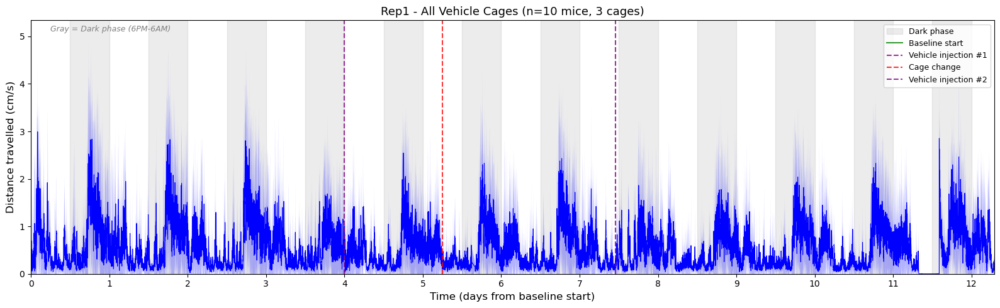

Saved: morph2rep_activity_Rep1_all_vehicle.png
  Animals: 10, Cages: 3


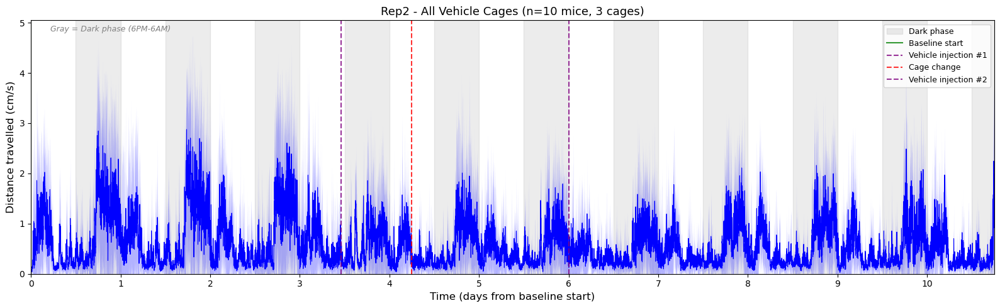

Saved: morph2rep_activity_Rep2_all_vehicle.png
  Animals: 10, Cages: 3


In [20]:
# =============================================================================
# PLOT - Smarr style (mean ± SD) - ONE PLOT PER REPLICATE
# =============================================================================
for rep, cfg in VEHICLE_CAGES.items():
    start_time = EVENTS[rep]["analysis_start"]
    
    # Combine all vehicle cages for this replicate
    rep_data = df_dist[df_dist['replicate'] == rep].copy()
    
    if len(rep_data) == 0:
        print(f"No data for {rep}")
        continue
    
    rep_data['days'] = (rep_data['time'] - start_time).dt.total_seconds() / 86400
    rep_data['time_bin'] = rep_data['time'].dt.floor('1min')
    
    # Mean and SD across ALL animals in this replicate at each timepoint
    grouped = rep_data.groupby('time_bin')['value'].agg(['mean', 'std']).reset_index()
    grouped['days'] = (grouped['time_bin'] - start_time).dt.total_seconds() / 86400
    
    fig, ax = plt.subplots(figsize=(16, 5))
    
    # Light/dark shading FIRST (so it's behind everything)
    max_days = int(np.ceil(grouped['days'].max()))
    for day in range(-1, max_days + 2):
        # If day 0 starts at 6 AM, then:
        # 6 AM = 0.0, 6 PM = 0.5, midnight = 0.75, 6 AM next = 1.0
        ax.axvspan(day + 0.5, day + 1.0, alpha=0.15, color='gray', label='Dark phase' if day == 0 else '')
    
    # Shaded SD region
    ax.fill_between(
        grouped['days'],
        grouped['mean'] - grouped['std'],
        grouped['mean'] + grouped['std'],
        color='blue', alpha=0.3, linewidth=0
    )
    
    # Mean line
    ax.plot(grouped['days'], grouped['mean'], color='blue', linewidth=0.8)
    
    # Event markers
    added_labels = set()
    for event_time, label, color, linestyle in EVENTS[rep]["events"]:
        event_day = (event_time - start_time).total_seconds() / 86400
        if 0 <= event_day <= grouped['days'].max():
            legend_label = label if label not in added_labels else ''
            added_labels.add(label)
            ax.axvline(x=event_day, color=color, linestyle=linestyle, alpha=0.8, 
                      linewidth=1.5, label=legend_label)
    
    # Formatting
    n_animals = rep_data['animal_id'].nunique()
    n_cages = rep_data['cage_id'].nunique()
    
    ax.set_xlabel('Time (days from baseline start)', fontsize=12)
    ax.set_ylabel('Distance travelled (cm/s)', fontsize=12)
    ax.set_title(f'{rep} - All Vehicle Cages (n={n_animals} mice, {n_cages} cages)', fontsize=13)
    ax.set_xlim(0, grouped['days'].max())
    ax.set_ylim(0, None)
    
    # Add day ticks
    ax.set_xticks(range(0, int(grouped['days'].max()) + 1))
    
    # Legend
    ax.legend(loc='upper right', fontsize=9)
    
    # Light cycle annotation
    ax.text(0.02, 0.98, 'Gray = Dark phase (6PM-6AM)', transform=ax.transAxes, 
            fontsize=9, va='top', ha='left', style='italic', color='gray')
    
    plt.tight_layout()
    plt.savefig(f'morph2rep_activity_{rep}_all_vehicle.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print(f"Saved: morph2rep_activity_{rep}_all_vehicle.png")
    print(f"  Animals: {n_animals}, Cages: {n_cages}")

## Bouts

In [21]:
print("Loading animal_bouts.parquet...")
print("=" * 60)

all_bouts = []
for rep, cfg in VEHICLE_CAGES.items():
    print(f"\n{rep}:")
    for cage_id in cfg['cages']:
        print(f"  Cage {cage_id}...", end=" ")
        df = load_parquet_s3(cage_id, cfg['analysis_start'], cfg['analysis_end'], 'animal_bouts.parquet')
        if len(df) > 0:
            df['replicate'] = rep
            all_bouts.append(df)
            print(f"{len(df):,} bouts")
        else:
            print("No data")

df_bouts = pd.concat(all_bouts, ignore_index=True)
print(f"\nTotal bouts: {len(df_bouts):,}")

Loading animal_bouts.parquet...

Rep1:
  Cage 4918... 2,201,519 bouts
  Cage 4922... 2,039,081 bouts
  Cage 4923... 

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

2,117,667 bouts

Rep2:
  Cage 4928... 1,872,654 bouts
  Cage 4929... 1,688,050 bouts
  Cage 4934... 1,795,480 bouts

Total bouts: 11,714,451


In [22]:
print("\nUnique state names:")
print(df_bouts['state_name'].value_counts())


Unique state names:
state_name
animal_bouts.social.in_proximity_other    4228593
animal_bouts.social.isolated_other        2674221
animal_bouts.active                       1340775
animal_bouts.social.proximal_all          1063945
animal_bouts.inactive                      939711
animal_bouts.social.isolated_all           621258
animal_bouts.locomotion                    457610
animal_bouts.climbing                      178953
animal_bouts.feeding                       158279
animal_bouts.inferred_sleep                 32415
animal_bouts.drinking                       18691
Name: count, dtype: int64


In [32]:
df_bouts['start_time'] = pd.to_datetime(df_bouts['start_time'])

# Filter for active bouts (adjust state_name if needed based on output above)
df_active = df_bouts[df_bouts['state_name'] == 'animal_bouts.locomotion'].copy()
print(f"\nActive bouts: {len(df_active):,}")

# Bin to 1-minute resolution
df_active['time_bin'] = df_active['start_time'].dt.floor('1min')

# Count active bouts per minute per animal
bout_counts = df_active.groupby(['replicate', 'cage_id', 'animal_id', 'time_bin']).size().reset_index(name='bout_count')

print(f"Bout count records: {len(bout_counts):,}")


Active bouts: 457,610
Bout count records: 112,737


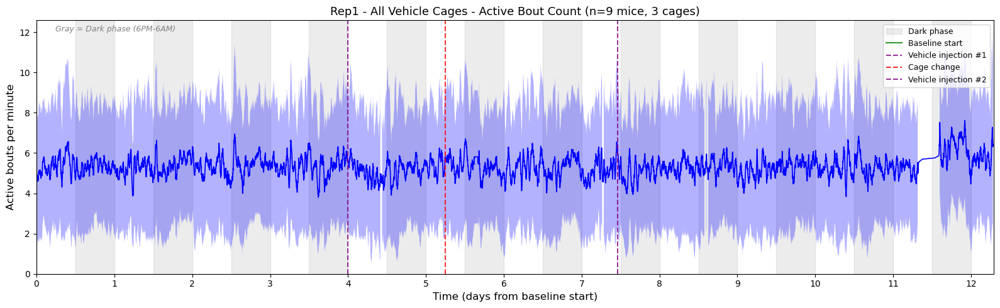

Saved: morph2rep_bouts_Rep1_all_vehicle.png
  Animals: 9, Cages: 3


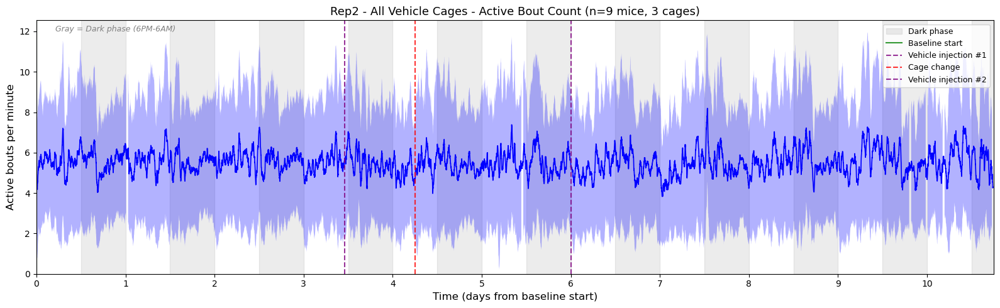

Saved: morph2rep_bouts_Rep2_all_vehicle.png
  Animals: 9, Cages: 3


In [31]:
for rep, cfg in VEHICLE_CAGES.items():
    start_time = EVENTS[rep]["analysis_start"]
    
    # Get data for this replicate
    rep_data = bout_counts[bout_counts['replicate'] == rep].copy()
    
    if len(rep_data) == 0:
        print(f"No data for {rep}")
        continue
    
    rep_data['days'] = (rep_data['time_bin'] - start_time).dt.total_seconds() / 86400
    
    # Mean and SD across ALL animals in this replicate at each timepoint
    grouped = rep_data.groupby('time_bin')['bout_count'].agg(['mean', 'std']).reset_index()
    grouped['days'] = (grouped['time_bin'] - start_time).dt.total_seconds() / 86400
    
    # === ADD SMOOTHING HERE ===
    window = 30  # 30-minute smoothing window
    grouped['mean_smooth'] = grouped['mean'].rolling(window=window, center=True).mean()
    grouped['std_smooth'] = grouped['std'].rolling(window=window, center=True).mean()
    
    fig, ax = plt.subplots(figsize=(16, 5))
    
    # Light/dark shading
    max_days = int(np.ceil(grouped['days'].max()))
    for day in range(-1, max_days + 2):
        ax.axvspan(day + 0.5, day + 1.0, alpha=0.15, color='gray', label='Dark phase' if day == 0 else '')
    
    # === USE SMOOTHED VALUES ===
    ax.fill_between(
        grouped['days'],
        grouped['mean_smooth'] - grouped['std_smooth'],
        grouped['mean_smooth'] + grouped['std_smooth'],
        color='blue', alpha=0.3, linewidth=0
    )
    
    ax.plot(grouped['days'], grouped['mean_smooth'], color='blue', linewidth=1.2)
    
    # Event markers
    added_labels = set()
    for event_time, label, color, linestyle in EVENTS[rep]["events"]:
        event_day = (event_time - start_time).total_seconds() / 86400
        if 0 <= event_day <= grouped['days'].max():
            legend_label = label if label not in added_labels else ''
            added_labels.add(label)
            ax.axvline(x=event_day, color=color, linestyle=linestyle, alpha=0.8, 
                      linewidth=1.5, label=legend_label)
    
    # Formatting
    n_animals = rep_data['animal_id'].nunique()
    n_cages = rep_data['cage_id'].nunique()
    
    ax.set_xlabel('Time (days from baseline start)', fontsize=12)
    ax.set_ylabel('Active bouts per minute', fontsize=12)
    ax.set_title(f'{rep} - All Vehicle Cages - Active Bout Count (n={n_animals} mice, {n_cages} cages)', fontsize=13)
    ax.set_xlim(0, grouped['days'].max())
    ax.set_ylim(0, None)
    
    ax.set_xticks(range(0, int(grouped['days'].max()) + 1))
    ax.legend(loc='upper right', fontsize=9)
    ax.text(0.02, 0.98, 'Gray = Dark phase (6PM-6AM)', transform=ax.transAxes, 
            fontsize=9, va='top', ha='left', style='italic', color='gray')
    
    plt.tight_layout()
    plt.savefig(f'morph2rep_bouts_{rep}_all_vehicle.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print(f"Saved: morph2rep_bouts_{rep}_all_vehicle.png")
    print(f"  Animals: {n_animals}, Cages: {n_cages}")

# Figure 3 recreation

In [35]:
# Reload Smarr's female activity data
df_smarr = pd.read_csv('mice data.xlsx - FemAct (1).csv')

print(df_smarr.columns.tolist())
print(df_smarr.head())

['time (min)', 'fem1', 'fem2', 'fem3', 'fem4', 'fem5', 'fem6', 'fem7', 'fem8', 'fem9', 'fem10', 'fem11', 'fem12', 'fem13', 'fem14']
   time (min)  fem1  fem2  fem3  fem4  fem5  fem6  fem7  fem8  fem9  fem10  \
0           1  69.0  28.0   5.0   0.0   4.0   0.0  19.0  33.0  62.0   61.0   
1           2  59.0  66.0   0.0   0.0  49.0  14.0   0.0   4.0   0.0   29.0   
2           3  38.0  37.0   0.0   0.0  37.0   9.0  26.0   4.0  32.0    8.0   
3           4  53.0  41.0   0.0   2.0  27.0   6.0  26.0  21.0  50.0   10.0   
4           5  64.0  26.0   2.0   0.0  38.0  54.0  71.0  25.0  27.0    0.0   

   fem11  fem12  fem13  fem14  
0    0.0   34.0    3.0     47  
1   25.0   26.0    0.0     17  
2    0.0   67.0    0.0      0  
3    0.0   71.0    0.0     18  
4    0.0   73.0    0.0     30  


Females: 14, Timepoints: 11520
Days: 8.0
Computing ultradian power for each female...
  fem1: done
  fem2: done
  fem3: done
  fem4: done
  fem5: done
  fem6: done
  fem7: done
  fem8: done
  fem9: done


/tmp/ipykernel_899/2725324639.py:90: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)


  fem10: done
  fem11: done
  fem12: done
  fem13: done
  fem14: done


/tmp/ipykernel_899/2725324639.py:142: RuntimeWarning: Mean of empty slice
  mean_power = np.nanmean(ultradian_powers_smooth, axis=0)


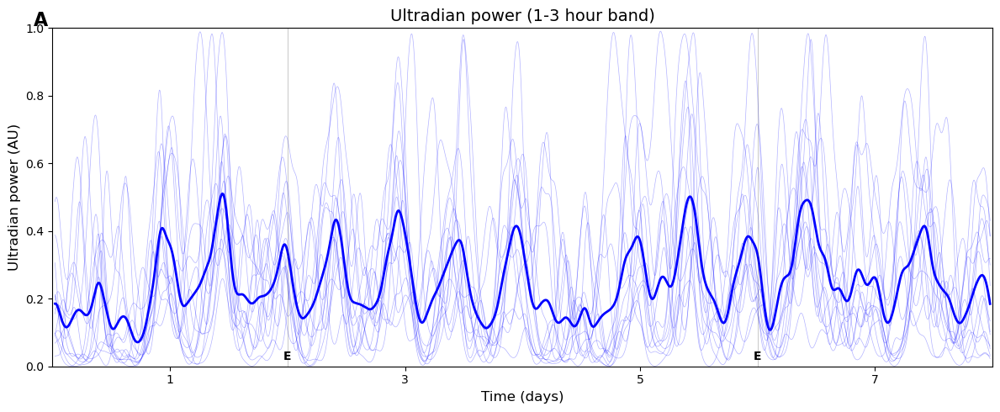

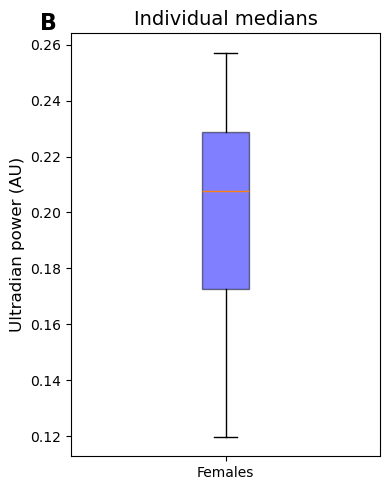


Done! Saved figures.


In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

# Extract female columns
female_cols = [col for col in df_smarr.columns if col.startswith('fem')]
female_data = df_smarr[female_cols].values.T  # Shape: (n_females, n_timepoints)

n_females, n_timepoints = female_data.shape
print(f"Females: {n_females}, Timepoints: {n_timepoints}")
print(f"Days: {n_timepoints / 1440:.1f}")

# Time in minutes
time_min = df_smarr['time (min)'].values
time_days = time_min / 1440

# =============================================================================
# WAVELET ANALYSIS - Extract 1-3 hour ultradian power
# =============================================================================
def compute_ultradian_power(data, fs=1, period_range=(60, 180)):
    """
    Compute ultradian band power using continuous wavelet transform.
    
    Parameters:
    -----------
    data : 1D array - time series (1-min resolution)
    fs : float - sampling frequency (samples per minute) = 1
    period_range : tuple - (min_period, max_period) in minutes
    
    Returns:
    --------
    ultradian_power : 1D array - power in ultradian band over time
    """
    # Define wavelet scales corresponding to 1-3 hour periods
    # For Morlet wavelet: period ≈ scale * 1.03 / fs
    min_period, max_period = period_range
    
    # Create scales for periods from 60 to 180 minutes
    # Using more scales for better resolution
    periods = np.linspace(min_period, max_period, 20)
    scales = periods / 1.03  # Approximate conversion for Morlet
    
    # Continuous wavelet transform using scipy
    # Using complex Morlet wavelet (cmor1.5-1.0)
    coefficients, frequencies = [], []
    
    for scale in scales:
        # Create Morlet wavelet
        wavelet_length = min(int(scale * 10), len(data))
        if wavelet_length % 2 == 0:
            wavelet_length += 1
        
        # Use scipy's morlet2 or manual convolution
        t = np.arange(wavelet_length) - wavelet_length // 2
        wavelet = np.exp(2j * np.pi * t / scale) * np.exp(-t**2 / (2 * (scale/2)**2))
        wavelet = wavelet / np.sqrt(scale)
        
        # Convolve
        convolved = np.convolve(data, wavelet, mode='same')
        coefficients.append(np.abs(convolved)**2)
    
    coefficients = np.array(coefficients)
    
    # Average power across ultradian band
    ultradian_power = np.mean(coefficients, axis=0)
    
    # Normalize to 0-1 range
    ultradian_power = (ultradian_power - ultradian_power.min()) / (ultradian_power.max() - ultradian_power.min())
    
    return ultradian_power


# Alternative: Use scipy.signal.cwt (simpler)
def compute_ultradian_power_scipy(data, fs=1, period_range=(60, 180)):
    """
    Compute ultradian band power using scipy's CWT.
    """
    from scipy.signal import cwt, morlet2
    
    # Scales corresponding to 1-3 hour periods
    min_period, max_period = period_range
    periods = np.linspace(min_period, max_period, 20)
    
    # For morlet2: scale = period * fs / (2 * pi * w) where w=5 typically
    w = 5  # Morlet wavelet parameter
    scales = periods * fs * w / (2 * np.pi)
    
    # CWT
    coeffs = cwt(data, morlet2, scales, w=w)
    power = np.abs(coeffs)**2
    
    # Average across ultradian band
    ultradian_power = np.mean(power, axis=0)
    
    return ultradian_power


# =============================================================================
# COMPUTE ULTRADIAN POWER FOR ALL FEMALES
# =============================================================================
print("Computing ultradian power for each female...")

ultradian_powers = []
for i, col in enumerate(female_cols):
    data = female_data[i, :]
    
    # Handle NaNs - interpolate
    data = pd.Series(data).interpolate().fillna(0).values
    
    # Compute ultradian power
    power = compute_ultradian_power_scipy(data, fs=1, period_range=(60, 180))
    
    # Normalize to 0-1
    power = (power - np.nanmin(power)) / (np.nanmax(power) - np.nanmin(power))
    
    ultradian_powers.append(power)
    print(f"  {col}: done")

ultradian_powers = np.array(ultradian_powers)  # Shape: (n_females, n_timepoints)

# =============================================================================
# SMOOTH FOR VISUALIZATION (optional - makes plot cleaner)
# =============================================================================
window = 60  # 1-hour smoothing
ultradian_powers_smooth = np.array([
    pd.Series(p).rolling(window=window, center=True).mean().values 
    for p in ultradian_powers
])

# =============================================================================
# PLOT - Figure 3A style
# =============================================================================
fig, ax = plt.subplots(figsize=(12, 5))

# Plot individual females (thin lines)
for i in range(n_females):
    ax.plot(time_days, ultradian_powers_smooth[i, :], 
            color='blue', alpha=0.3, linewidth=0.5)

# Plot mean (thick line)
mean_power = np.nanmean(ultradian_powers_smooth, axis=0)
ax.plot(time_days, mean_power, color='blue', linewidth=2, label='Female mean')

# Mark estrus days (every 4 days, starting at day 2 based on Smarr's alignment)
estrus_days = [2, 6, 10, 14]
for e_day in estrus_days:
    if e_day <= time_days.max():
        ax.axvline(x=e_day, color='black', linestyle='-', alpha=0.3, linewidth=0.5)
        ax.text(e_day, 0.02, 'E', ha='center', fontsize=10, fontweight='bold')

# Formatting
ax.set_xlabel('Time (days)', fontsize=12)
ax.set_ylabel('Ultradian power (AU)', fontsize=12)
ax.set_title('Ultradian power (1-3 hour band)', fontsize=14)
ax.set_xlim(0, time_days.max())
ax.set_ylim(0, 1)
ax.set_xticks(range(1, int(time_days.max()) + 1, 2))

# Add panel label
ax.text(-0.02, 1.05, 'A', transform=ax.transAxes, fontsize=16, fontweight='bold', va='top')

plt.tight_layout()
plt.savefig('smarr_ultradian_power_fig3a.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT - Figure 3B style (box plot of individual medians)
# =============================================================================
fig, ax = plt.subplots(figsize=(4, 5))

# Calculate median ultradian power per individual
individual_medians = np.nanmedian(ultradian_powers, axis=1)

# Box plot (only females since we don't have male data)
bp = ax.boxplot([individual_medians], labels=['Females'], patch_artist=True)
bp['boxes'][0].set_facecolor('blue')
bp['boxes'][0].set_alpha(0.5)

ax.set_ylabel('Ultradian power (AU)', fontsize=12)
ax.set_title('Individual medians', fontsize=14)

# Add panel label
ax.text(-0.1, 1.05, 'B', transform=ax.transAxes, fontsize=16, fontweight='bold', va='top')

plt.tight_layout()
plt.savefig('smarr_ultradian_medians_fig3b.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nDone! Saved figures.")

In [34]:
print(df.columns.tolist())

['predicted_identity', 'start_time', 'end_time', 'state_name', 'organization_id', 'cage_id', 'study_id', 'device_id', 'animal_id', 'bout_length_seconds', 'source_file', 'date', 'replicate']


Females: 14, Timepoints: 11520, Days: 8.0
Computing ultradian power...
  fem1: done
  fem2: done
  fem3: done
  fem4: done
  fem5: done
  fem6: done
  fem7: done
  fem8: done
  fem9: done


/tmp/ipykernel_899/2181273510.py:33: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)


  fem10: done
  fem11: done
  fem12: done
  fem13: done
  fem14: done


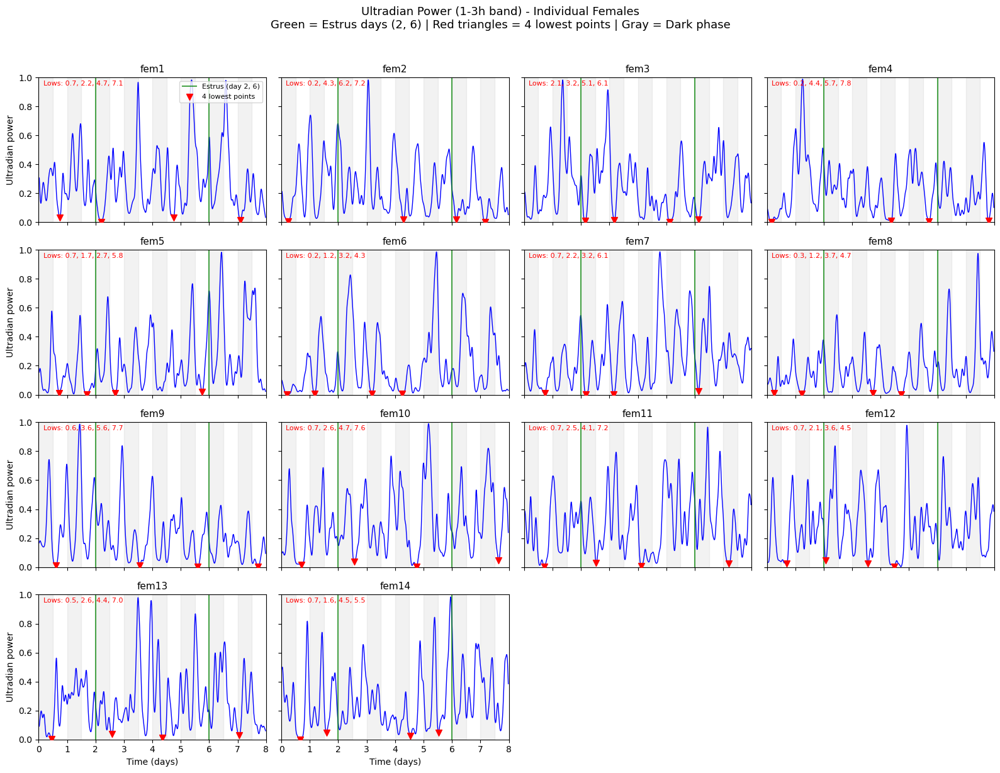


ESTRUS ALIGNMENT CHECK
Known estrus days: 2 and 6
If ultradian suppression marks estrus, lowest points should be near these days

fem1: lows at ['0.7', '2.2', '4.7', '7.1'] | ✓ day 2
fem2: lows at ['0.2', '4.3', '6.2', '7.2'] | ✓ day 6
fem3: lows at ['2.1', '3.2', '5.1', '6.1'] | ✓ day 2, day 6
fem4: lows at ['0.2', '4.4', '5.7', '7.8'] | ✓ day 6
fem5: lows at ['0.7', '1.7', '2.7', '5.8'] | ✓ day 2, day 6
fem6: lows at ['0.2', '1.2', '3.2', '4.3'] | ✗ No match
fem7: lows at ['0.7', '2.2', '3.2', '6.1'] | ✓ day 2, day 6
fem8: lows at ['0.3', '1.2', '3.7', '4.7'] | ✗ No match
fem9: lows at ['0.6', '3.6', '5.6', '7.7'] | ✓ day 6
fem10: lows at ['0.7', '2.6', '4.7', '7.6'] | ✗ No match
fem11: lows at ['0.7', '2.5', '4.1', '7.2'] | ✗ No match
fem12: lows at ['0.7', '2.1', '3.6', '4.5'] | ✓ day 2
fem13: lows at ['0.5', '2.6', '4.4', '7.0'] | ✗ No match
fem14: lows at ['0.7', '1.6', '4.5', '5.5'] | ✓ day 2, day 6

------------------------------------------------------------
SUMMARY
Total mic

In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import cwt, morlet2, find_peaks

# =============================================================================
# LOAD SMARR DATA
# =============================================================================
female_cols = [col for col in df_smarr.columns if col.startswith('fem')]
female_data = df_smarr[female_cols].values.T  # Shape: (n_females, n_timepoints)

n_females, n_timepoints = female_data.shape
print(f"Females: {n_females}, Timepoints: {n_timepoints}, Days: {n_timepoints/1440:.1f}")

time_min = df_smarr['time (min)'].values
time_days = time_min / 1440

# =============================================================================
# WAVELET FUNCTION
# =============================================================================
def compute_ultradian_power(data, fs=1, period_range=(60, 180)):
    """
    Compute ultradian band power using scipy's CWT.
    """
    data = pd.Series(data).interpolate().fillna(0).values
    
    min_period, max_period = period_range
    periods = np.linspace(min_period, max_period, 20)
    
    w = 5
    scales = periods * fs * w / (2 * np.pi)
    
    coeffs = cwt(data, morlet2, scales, w=w)
    power = np.abs(coeffs)**2
    ultradian_power = np.mean(power, axis=0)
    ultradian_power = (ultradian_power - np.nanmin(ultradian_power)) / (np.nanmax(ultradian_power) - np.nanmin(ultradian_power))
    
    return ultradian_power

# =============================================================================
# COMPUTE ULTRADIAN POWER
# =============================================================================
print("Computing ultradian power...")
ultradian_powers = []
for i in range(n_females):
    power = compute_ultradian_power(female_data[i, :])
    ultradian_powers.append(power)
    print(f"  {female_cols[i]}: done")

ultradian_powers = np.array(ultradian_powers)

# Smooth for visualization
window = 60  # 1-hour smoothing
ultradian_powers_smooth = np.array([
    pd.Series(p).rolling(window=window, center=True).mean().values 
    for p in ultradian_powers
])

# =============================================================================
# FUNCTION TO FIND N LOWEST POINTS (local minima)
# =============================================================================
def find_n_lowest_points(signal, time, n=4, min_distance_days=0.5):
    """
    Find the n lowest local minima in the signal.
    """
    min_distance = int(min_distance_days * 1440)
    
    signal_clean = np.nan_to_num(signal, nan=np.nanmean(signal))
    inverted = -signal_clean
    
    peaks, properties = find_peaks(inverted, distance=min_distance)
    
    if len(peaks) == 0:
        return [], []
    
    peak_values = signal_clean[peaks]
    sorted_idx = np.argsort(peak_values)
    
    n_to_get = min(n, len(peaks))
    lowest_idx = peaks[sorted_idx[:n_to_get]]
    lowest_times = time[lowest_idx]
    lowest_values = signal_clean[lowest_idx]
    
    return lowest_times, lowest_values

# =============================================================================
# PLOT - Individual mice with 4 lowest points highlighted
# =============================================================================
fig, axes = plt.subplots(4, 4, figsize=(16, 12), sharex=True, sharey=True)
axes = axes.flatten()

# Known estrus days (data is aligned, only 8 days available)
estrus_days = [2, 6]

for i in range(n_females):
    ax = axes[i]
    
    # Light/dark shading - CORRECTED
    # t=0 is lights OFF, so 0-0.5 is dark, 0.5-1.0 is light
    max_days = int(np.ceil(time_days.max()))
    for day in range(max_days + 1):
        ax.axvspan(day, day + 0.5, alpha=0.1, color='gray')  # Dark phase (active)
    
    # Plot ultradian power
    ax.plot(time_days, ultradian_powers_smooth[i, :], color='blue', linewidth=1)
    
    # Mark known estrus days
    for e_day in estrus_days:
        if e_day <= time_days.max():
            ax.axvline(x=e_day, color='green', linestyle='-', alpha=0.7, linewidth=1.5)
    
    # Find and mark 4 lowest points
    lowest_times, lowest_values = find_n_lowest_points(
        ultradian_powers_smooth[i, :], 
        time_days, 
        n=4, 
        min_distance_days=0.75
    )
    
    # Plot lowest points
    ax.scatter(lowest_times, lowest_values, color='red', s=50, zorder=5, marker='v')
    
    # Add day labels for lowest points
    label_str = ', '.join([f'{t:.1f}' for t in sorted(lowest_times)])
    ax.text(0.02, 0.98, f'Lows: {label_str}', transform=ax.transAxes, 
            fontsize=8, va='top', ha='left', color='red')
    
    ax.set_title(f'{female_cols[i]}', fontsize=11)
    ax.set_ylim(0, 1)
    ax.set_xlim(0, time_days.max())
    
    if i >= 12:
        ax.set_xlabel('Time (days)')
    if i % 4 == 0:
        ax.set_ylabel('Ultradian power')

# Turn off unused subplots
for i in range(n_females, 16):
    axes[i].axis('off')

# Legend
axes[0].axvline(x=-999, color='green', linestyle='-', alpha=0.7, linewidth=1.5, label='Estrus (day 2, 6)')
axes[0].scatter([], [], color='red', s=50, marker='v', label='4 lowest points')
axes[0].legend(loc='upper right', fontsize=8)

plt.suptitle('Ultradian Power (1-3h band) - Individual Females\nGreen = Estrus days (2, 6) | Red triangles = 4 lowest points | Gray = Dark phase', 
             fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig('smarr_ultradian_individual_estrus.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# ANALYSIS: Do lowest points align with estrus?
# =============================================================================
print("\n" + "="*60)
print("ESTRUS ALIGNMENT CHECK")
print("="*60)
print("Known estrus days: 2 and 6")
print("If ultradian suppression marks estrus, lowest points should be near these days")
print()

for i, col in enumerate(female_cols):
    lowest_times, _ = find_n_lowest_points(
        ultradian_powers_smooth[i, :], time_days, n=4, min_distance_days=0.75
    )
    sorted_times = sorted(lowest_times)
    
    # Check if any lowest point is within 0.5 days of estrus
    hits = []
    for e_day in estrus_days:
        for t in sorted_times:
            if abs(t - e_day) <= 0.5:
                hits.append(f"day {e_day}")
                break
    
    hit_str = f"✓ {', '.join(hits)}" if hits else "✗ No match"
    print(f"{col}: lows at {[f'{t:.1f}' for t in sorted_times]} | {hit_str}")

# Summary
print("\n" + "-"*60)
print("SUMMARY")
all_hits = 0
for i in range(n_females):
    lowest_times, _ = find_n_lowest_points(
        ultradian_powers_smooth[i, :], time_days, n=4, min_distance_days=0.75
    )
    for e_day in estrus_days:
        for t in lowest_times:
            if abs(t - e_day) <= 0.5:
                all_hits += 1
                break

print(f"Total mice with at least one low near estrus day 2: checking...")
print(f"Total estrus-aligned hits: {all_hits} / {n_females * 2} possible")

Females: 14, Timepoints: 11520, Days: 8.0
Complete 4-day cycles: 2


/tmp/ipykernel_899/2735734709.py:73: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.axvspan(start_h + 12, start_h + 24, ymin=0, ymax=0.03, color='white', edgecolor='black', alpha=1)


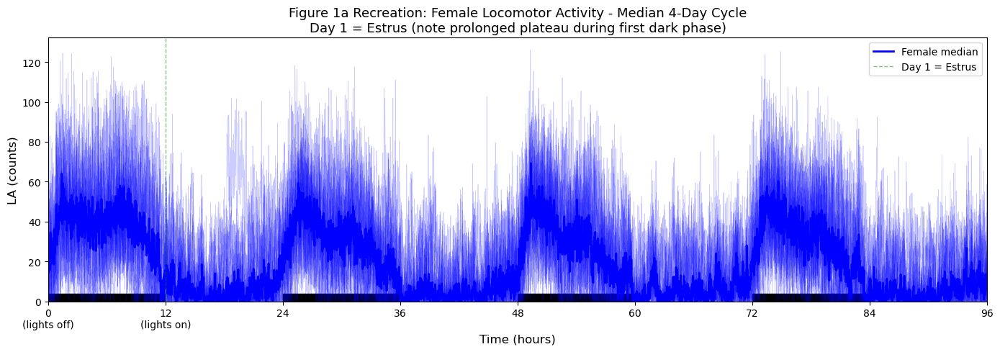


Computing wavelet spectrograms...
  fem1: done
  fem2: done
  fem3: done


/tmp/ipykernel_899/2735734709.py:125: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)


  fem4: done
  fem5: done
  fem6: done
  fem7: done
  fem8: done
  fem9: done
  fem10: done
  fem11: done
  fem12: done
  fem13: done
  fem14: done


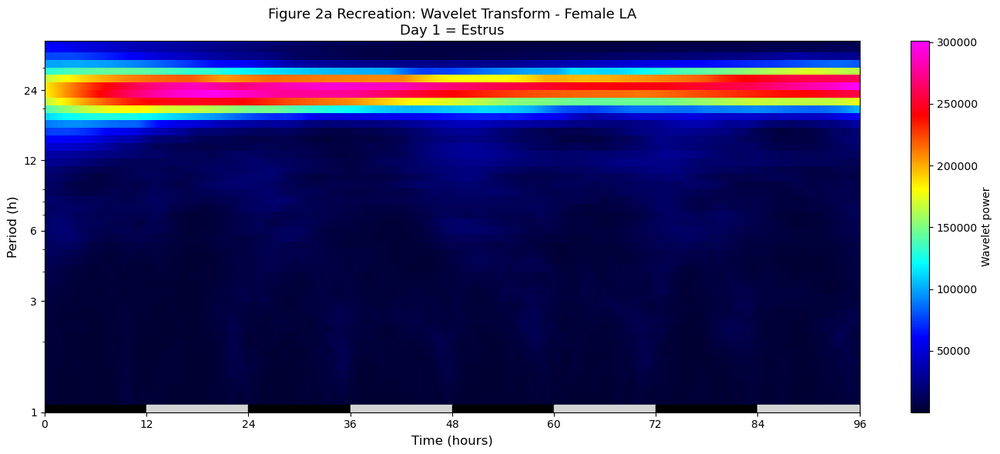

/tmp/ipykernel_899/2735734709.py:245: RuntimeWarning: All-NaN slice encountered
  median_cr = np.nanmedian(circadian_smooth[:, :n_minutes_4days], axis=0)
/tmp/ipykernel_899/2735734709.py:265: RuntimeWarning: All-NaN slice encountered
  median_ur = np.nanmedian(ultradian_smooth[:, :n_minutes_4days], axis=0)


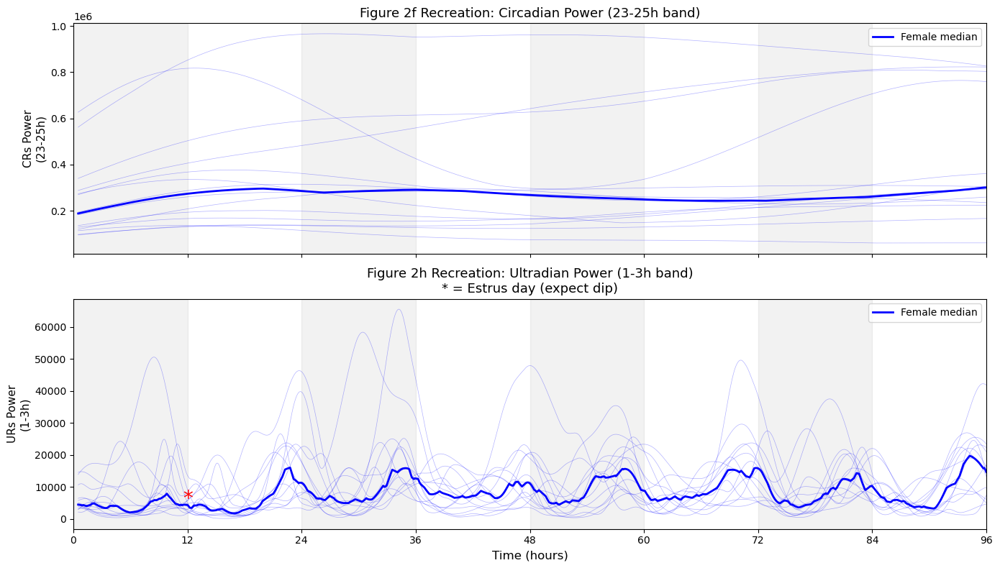


ESTRUS vs NON-ESTRUS ULTRADIAN POWER
Mean UR power on ESTRUS day: 7597.31 ± 4840.01
Mean UR power on NON-ESTRUS days: 10625.28 ± 4309.44
Ratio (estrus/non-estrus): 0.715
Wilcoxon signed-rank test: p = 0.0023
✓ Significant difference - estrus shows different ultradian power


In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import cwt, morlet2
from matplotlib.colors import LinearSegmentedColormap

# =============================================================================
# LOAD SMARR DATA
# =============================================================================

female_cols = [col for col in df_smarr.columns if col.startswith('fem')]
female_data = df_smarr[female_cols].values.T  # Shape: (n_females, n_timepoints)

n_females, n_timepoints = female_data.shape
print(f"Females: {n_females}, Timepoints: {n_timepoints}, Days: {n_timepoints/1440:.1f}")

time_min = df_smarr['time (min)'].values
time_days = time_min / 1440

# =============================================================================
# FIGURE 1 RECREATION: Median 4-day activity plot
# =============================================================================
# Data is 8 days, we have 2 complete 4-day cycles
# Day 1 (estrus), Day 2, Day 3, Day 4, Day 5 (estrus), Day 6, Day 7, Day 8
# We'll fold into 4-day cycles and take median

minutes_per_day = 1440
minutes_per_cycle = 4 * minutes_per_day

# Reshape to 4-day cycles (we have 2 complete cycles in 8 days)
n_cycles = n_timepoints // minutes_per_cycle
print(f"Complete 4-day cycles: {n_cycles}")

# For each female, reshape into cycles and compute median
cycle_data = []
for i in range(n_females):
    animal_data = female_data[i, :n_cycles * minutes_per_cycle]
    # Reshape to (n_cycles, minutes_per_cycle)
    reshaped = animal_data.reshape(n_cycles, minutes_per_cycle)
    cycle_data.append(reshaped)

cycle_data = np.array(cycle_data)  # Shape: (n_females, n_cycles, minutes_per_cycle)

# Median across cycles for each female, then median across females
median_per_female = np.median(cycle_data, axis=1)  # (n_females, minutes_per_cycle)
population_median = np.median(median_per_female, axis=0)  # (minutes_per_cycle,)
population_mean = np.mean(median_per_female, axis=0)

# Time axis for 4 days (in hours from lights-off)
# t=0 is lights OFF, so we're starting at the beginning of dark phase
time_4day_hours = np.arange(minutes_per_cycle) / 60  # Convert to hours

# Create time axis like Smarr's figure (CT time, 12 = noon)
# If t=0 is lights off (6 PM = CT12 in their notation)
time_ct = (time_4day_hours + 12) % 24  # Shift so CT12 = lights off

fig, ax = plt.subplots(figsize=(14, 5))

# Plot individual females (thin lines)
for i in range(n_females):
    ax.plot(time_4day_hours, median_per_female[i, :], color='blue', alpha=0.2, linewidth=0.5)

# Plot population median (thick line)
ax.plot(time_4day_hours, population_median, color='blue', linewidth=2, label='Female median')

# Add light/dark bars at bottom
# t=0 is lights OFF, so 0-12h = dark, 12-24h = light, etc.
for day in range(4):
    start_h = day * 24
    # Dark phase (0-12h of each day)
    ax.axvspan(start_h, start_h + 12, ymin=0, ymax=0.03, color='black', alpha=1)
    # Light phase (12-24h of each day)
    ax.axvspan(start_h + 12, start_h + 24, ymin=0, ymax=0.03, color='white', edgecolor='black', alpha=1)

# Mark estrus day
ax.axvline(x=12, color='green', linestyle='--', alpha=0.5, linewidth=1, label='Day 1 = Estrus')

# Labels
ax.set_xlabel('Time (hours)', fontsize=12)
ax.set_ylabel('LA (counts)', fontsize=12)
ax.set_title('Figure 1a Recreation: Female Locomotor Activity - Median 4-Day Cycle\nDay 1 = Estrus (note prolonged plateau during first dark phase)', fontsize=13)
ax.set_xlim(0, 96)
ax.set_ylim(0, None)

# X-axis ticks every 12 hours
ax.set_xticks(np.arange(0, 97, 12))
ax.set_xticklabels(['0\n(lights off)', '12\n(lights on)', '24', '36', '48', '60', '72', '84', '96'])

ax.legend(loc='upper right')

plt.tight_layout()
plt.savefig('smarr_fig1_recreation.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# FIGURE 2 RECREATION: Wavelet Analysis
# =============================================================================

def compute_wavelet_spectrogram(data, fs=1, periods=None):
    """
    Compute wavelet spectrogram.
    
    Parameters:
    -----------
    data : 1D array - time series
    fs : float - sampling frequency (samples per minute) = 1
    periods : array - periods to analyze (in minutes)
    
    Returns:
    --------
    power : 2D array - (n_periods, n_timepoints)
    periods : array - periods analyzed
    """
    if periods is None:
        # Periods from 1h to 39h (60 to 2340 minutes)
        periods = np.logspace(np.log10(60), np.log10(39*60), 50)
    
    # Handle NaNs
    data = pd.Series(data).interpolate().fillna(0).values
    
    w = 5  # Morlet wavelet parameter
    scales = periods * fs * w / (2 * np.pi)
    
    # CWT
    coeffs = cwt(data, morlet2, scales, w=w)
    power = np.abs(coeffs)**2
    
    return power, periods

# Compute wavelet for each female
print("\nComputing wavelet spectrograms...")
all_spectrograms = []
for i in range(n_females):
    power, periods = compute_wavelet_spectrogram(female_data[i, :])
    all_spectrograms.append(power)
    print(f"  {female_cols[i]}: done")

all_spectrograms = np.array(all_spectrograms)  # (n_females, n_periods, n_timepoints)

# Median spectrogram across females
median_spectrogram = np.median(all_spectrograms, axis=0)

# Convert periods to hours
periods_hours = periods / 60

# =============================================================================
# FIGURE 2A: Wavelet Spectrogram
# =============================================================================
fig, ax = plt.subplots(figsize=(14, 6))

# Use first 4 days for comparison with Smarr's figure
n_minutes_4days = 4 * 1440
time_4days = np.arange(n_minutes_4days) / 60  # hours

# Create custom colormap (similar to Smarr's - blue to red)
colors = ['#000033', '#0000FF', '#00FFFF', '#FFFF00', '#FF0000', '#FF00FF']
cmap = LinearSegmentedColormap.from_list('smarr', colors, N=256)

# Plot spectrogram
im = ax.pcolormesh(time_4days, periods_hours, median_spectrogram[:, :n_minutes_4days], 
                    cmap=cmap, shading='auto')

ax.set_yscale('log')
ax.set_ylabel('Period (h)', fontsize=12)
ax.set_xlabel('Time (hours)', fontsize=12)
ax.set_title('Figure 2a Recreation: Wavelet Transform - Female LA\nDay 1 = Estrus', fontsize=13)

# Y-axis ticks
ax.set_yticks([1, 3, 6, 12, 24])
ax.set_yticklabels(['1', '3', '6', '12', '24'])
ax.set_ylim(1, 39)

# X-axis
ax.set_xlim(0, 96)
ax.set_xticks(np.arange(0, 97, 12))

# Add light/dark bars
for day in range(4):
    start_h = day * 24
    ax.axvspan(start_h, start_h + 12, ymin=0, ymax=0.02, color='black', alpha=1)
    ax.axvspan(start_h + 12, start_h + 24, ymin=0, ymax=0.02, color='lightgray', alpha=1)

# Colorbar
cbar = plt.colorbar(im, ax=ax, label='Wavelet power')

plt.tight_layout()
plt.savefig('smarr_fig2a_spectrogram.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# FIGURE 2H: Ultradian Power (1-3h) over time
# =============================================================================

def extract_band_power(spectrogram, periods_hours, band=(1, 3)):
    """Extract power in a specific frequency band."""
    band_mask = (periods_hours >= band[0]) & (periods_hours <= band[1])
    band_power = np.mean(spectrogram[band_mask, :], axis=0)
    return band_power

def extract_band_power_max(spectrogram, periods_hours, band=(1, 3)):
    """Extract MAX power in a specific frequency band (as per Smarr's methods)."""
    band_mask = (periods_hours >= band[0]) & (periods_hours <= band[1])
    band_power = np.max(spectrogram[band_mask, :], axis=0)
    return band_power

# Extract ultradian (1-3h) and circadian (23-25h) power for each female
ultradian_powers = []
circadian_powers = []

for i in range(n_females):
    ur_power = extract_band_power_max(all_spectrograms[i], periods_hours, band=(1, 3))
    cr_power = extract_band_power_max(all_spectrograms[i], periods_hours, band=(23, 25))
    ultradian_powers.append(ur_power)
    circadian_powers.append(cr_power)

ultradian_powers = np.array(ultradian_powers)
circadian_powers = np.array(circadian_powers)

# Smooth for visualization (1-hour window)
window = 60
ultradian_smooth = np.array([
    pd.Series(p).rolling(window=window, center=True).mean().values 
    for p in ultradian_powers
])
circadian_smooth = np.array([
    pd.Series(p).rolling(window=window, center=True).mean().values 
    for p in circadian_powers
])

# =============================================================================
# PLOT: Circadian Power (Figure 2f style)
# =============================================================================
fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

# Use 4 days of data
time_hours_4day = np.arange(n_minutes_4days) / 60

# Panel 1: Circadian power (23-25h)
ax = axes[0]
for i in range(n_females):
    ax.plot(time_hours_4day, circadian_smooth[i, :n_minutes_4days], 
            color='blue', alpha=0.3, linewidth=0.5)

# Population median
median_cr = np.nanmedian(circadian_smooth[:, :n_minutes_4days], axis=0)
ax.plot(time_hours_4day, median_cr, color='blue', linewidth=2, label='Female median')

# Light/dark shading
for day in range(4):
    start_h = day * 24
    ax.axvspan(start_h, start_h + 12, alpha=0.1, color='gray')

ax.set_ylabel('CRs Power\n(23-25h)', fontsize=11)
ax.set_title('Figure 2f Recreation: Circadian Power (23-25h band)', fontsize=13)
ax.legend(loc='upper right')
ax.set_xlim(0, 96)

# Panel 2: Ultradian power (1-3h)
ax = axes[1]
for i in range(n_females):
    ax.plot(time_hours_4day, ultradian_smooth[i, :n_minutes_4days], 
            color='blue', alpha=0.3, linewidth=0.5)

# Population median
median_ur = np.nanmedian(ultradian_smooth[:, :n_minutes_4days], axis=0)
ax.plot(time_hours_4day, median_ur, color='blue', linewidth=2, label='Female median')

# Light/dark shading
for day in range(4):
    start_h = day * 24
    ax.axvspan(start_h, start_h + 12, alpha=0.1, color='gray')

# Mark estrus days with asterisk (day 1 = hours 0-24)
# The dip should be visible around day 1
ax.annotate('*', xy=(12, median_ur[12*60]), fontsize=20, ha='center', color='red')

ax.set_xlabel('Time (hours)', fontsize=12)
ax.set_ylabel('URs Power\n(1-3h)', fontsize=11)
ax.set_title('Figure 2h Recreation: Ultradian Power (1-3h band)\n* = Estrus day (expect dip)', fontsize=13)
ax.legend(loc='upper right')
ax.set_xlim(0, 96)
ax.set_xticks(np.arange(0, 97, 12))

plt.tight_layout()
plt.savefig('smarr_fig2fh_power.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# QUANTIFY: Is ultradian power lower on estrus days?
# =============================================================================
print("\n" + "="*60)
print("ESTRUS vs NON-ESTRUS ULTRADIAN POWER")
print("="*60)

# Day 1 (estrus): hours 0-24 -> minutes 0-1440
# Day 2-4 (non-estrus): hours 24-96 -> minutes 1440-5760

estrus_minutes = slice(0, 1440)
non_estrus_minutes = slice(1440, 4*1440)

estrus_ur = ultradian_powers[:, estrus_minutes].mean(axis=1)
non_estrus_ur = ultradian_powers[:, non_estrus_minutes].mean(axis=1)

print(f"Mean UR power on ESTRUS day: {estrus_ur.mean():.2f} ± {estrus_ur.std():.2f}")
print(f"Mean UR power on NON-ESTRUS days: {non_estrus_ur.mean():.2f} ± {non_estrus_ur.std():.2f}")
print(f"Ratio (estrus/non-estrus): {estrus_ur.mean() / non_estrus_ur.mean():.3f}")

# Statistical test
from scipy.stats import wilcoxon
stat, p = wilcoxon(estrus_ur, non_estrus_ur)
print(f"Wilcoxon signed-rank test: p = {p:.4f}")

if p < 0.05:
    print("✓ Significant difference - estrus shows different ultradian power")
else:
    print("✗ Not significant at p<0.05")

Females: 14, Timepoints: 11520, Days: 8.0
Complete 4-day cycles: 2


/tmp/ipykernel_899/2735734709.py:73: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.axvspan(start_h + 12, start_h + 24, ymin=0, ymax=0.03, color='white', edgecolor='black', alpha=1)


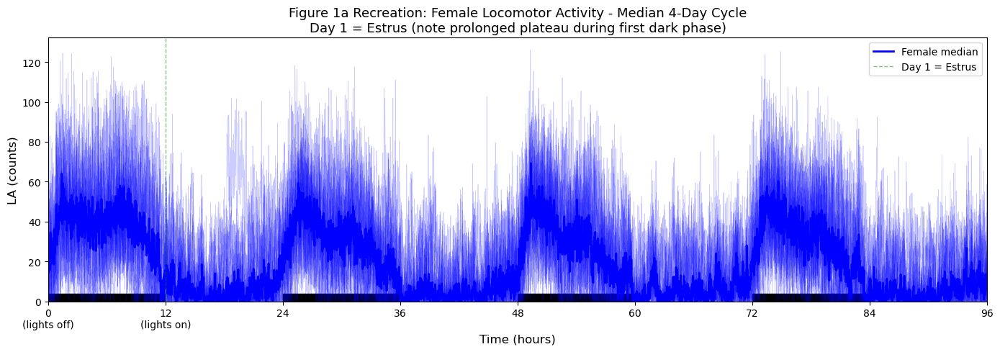


Computing wavelet spectrograms...
  fem1: done
  fem2: done
  fem3: done


/tmp/ipykernel_899/2735734709.py:125: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)


  fem4: done
  fem5: done
  fem6: done
  fem7: done
  fem8: done
  fem9: done
  fem10: done
  fem11: done
  fem12: done
  fem13: done
  fem14: done


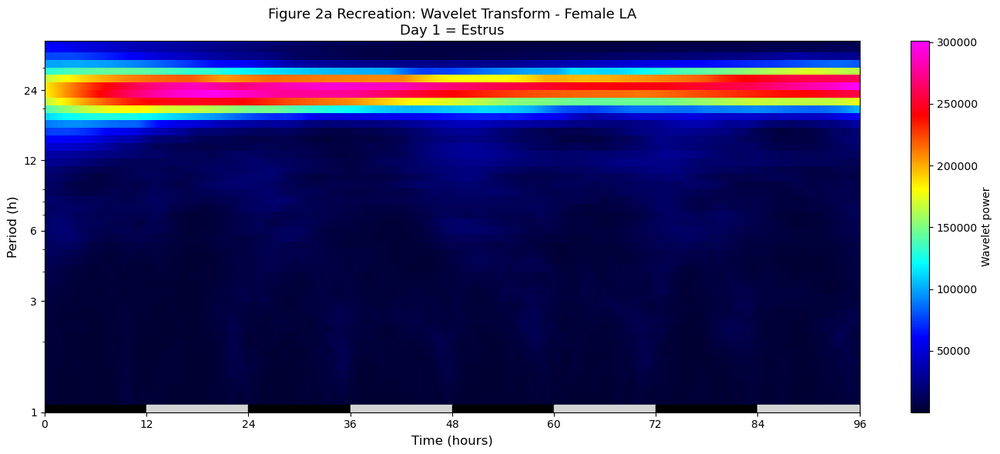

/tmp/ipykernel_899/2735734709.py:245: RuntimeWarning: All-NaN slice encountered
  median_cr = np.nanmedian(circadian_smooth[:, :n_minutes_4days], axis=0)
/tmp/ipykernel_899/2735734709.py:265: RuntimeWarning: All-NaN slice encountered
  median_ur = np.nanmedian(ultradian_smooth[:, :n_minutes_4days], axis=0)


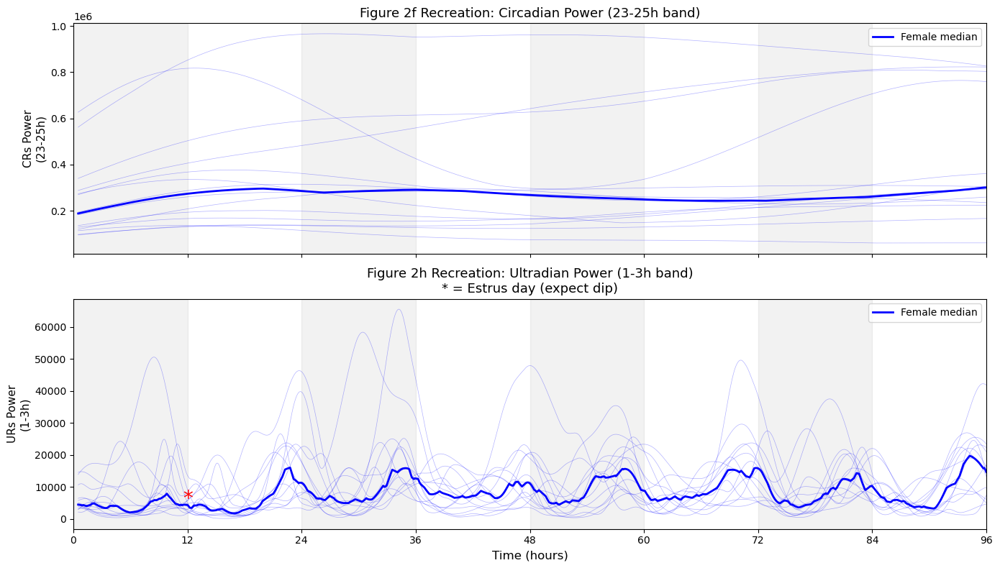


ESTRUS vs NON-ESTRUS ULTRADIAN POWER
Mean UR power on ESTRUS day: 7597.31 ± 4840.01
Mean UR power on NON-ESTRUS days: 10625.28 ± 4309.44
Ratio (estrus/non-estrus): 0.715
Wilcoxon signed-rank test: p = 0.0023
✓ Significant difference - estrus shows different ultradian power


In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import cwt, morlet2
from matplotlib.colors import LinearSegmentedColormap

# =============================================================================
# LOAD SMARR DATA
# =============================================================================

female_cols = [col for col in df_smarr.columns if col.startswith('fem')]
female_data = df_smarr[female_cols].values.T  # Shape: (n_females, n_timepoints)

n_females, n_timepoints = female_data.shape
print(f"Females: {n_females}, Timepoints: {n_timepoints}, Days: {n_timepoints/1440:.1f}")

time_min = df_smarr['time (min)'].values
time_days = time_min / 1440

# =============================================================================
# FIGURE 1 RECREATION: Median 4-day activity plot
# =============================================================================
# Data is 8 days, we have 2 complete 4-day cycles
# Day 1 (estrus), Day 2, Day 3, Day 4, Day 5 (estrus), Day 6, Day 7, Day 8
# We'll fold into 4-day cycles and take median

minutes_per_day = 1440
minutes_per_cycle = 4 * minutes_per_day

# Reshape to 4-day cycles (we have 2 complete cycles in 8 days)
n_cycles = n_timepoints // minutes_per_cycle
print(f"Complete 4-day cycles: {n_cycles}")

# For each female, reshape into cycles and compute median
cycle_data = []
for i in range(n_females):
    animal_data = female_data[i, :n_cycles * minutes_per_cycle]
    # Reshape to (n_cycles, minutes_per_cycle)
    reshaped = animal_data.reshape(n_cycles, minutes_per_cycle)
    cycle_data.append(reshaped)

cycle_data = np.array(cycle_data)  # Shape: (n_females, n_cycles, minutes_per_cycle)

# Median across cycles for each female, then median across females
median_per_female = np.median(cycle_data, axis=1)  # (n_females, minutes_per_cycle)
population_median = np.median(median_per_female, axis=0)  # (minutes_per_cycle,)
population_mean = np.mean(median_per_female, axis=0)

# Time axis for 4 days (in hours from lights-off)
# t=0 is lights OFF, so we're starting at the beginning of dark phase
time_4day_hours = np.arange(minutes_per_cycle) / 60  # Convert to hours

# Create time axis like Smarr's figure (CT time, 12 = noon)
# If t=0 is lights off (6 PM = CT12 in their notation)
time_ct = (time_4day_hours + 12) % 24  # Shift so CT12 = lights off

fig, ax = plt.subplots(figsize=(14, 5))

# Plot individual females (thin lines)
for i in range(n_females):
    ax.plot(time_4day_hours, median_per_female[i, :], color='blue', alpha=0.2, linewidth=0.5)

# Plot population median (thick line)
ax.plot(time_4day_hours, population_median, color='blue', linewidth=2, label='Female median')

# Add light/dark bars at bottom
# t=0 is lights OFF, so 0-12h = dark, 12-24h = light, etc.
for day in range(4):
    start_h = day * 24
    # Dark phase (0-12h of each day)
    ax.axvspan(start_h, start_h + 12, ymin=0, ymax=0.03, color='black', alpha=1)
    # Light phase (12-24h of each day)
    ax.axvspan(start_h + 12, start_h + 24, ymin=0, ymax=0.03, color='white', edgecolor='black', alpha=1)

# Mark estrus day
ax.axvline(x=12, color='green', linestyle='--', alpha=0.5, linewidth=1, label='Day 1 = Estrus')

# Labels
ax.set_xlabel('Time (hours)', fontsize=12)
ax.set_ylabel('LA (counts)', fontsize=12)
ax.set_title('Figure 1a Recreation: Female Locomotor Activity - Median 4-Day Cycle\nDay 1 = Estrus (note prolonged plateau during first dark phase)', fontsize=13)
ax.set_xlim(0, 96)
ax.set_ylim(0, None)

# X-axis ticks every 12 hours
ax.set_xticks(np.arange(0, 97, 12))
ax.set_xticklabels(['0\n(lights off)', '12\n(lights on)', '24', '36', '48', '60', '72', '84', '96'])

ax.legend(loc='upper right')

plt.tight_layout()
plt.savefig('smarr_fig1_recreation.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# FIGURE 2 RECREATION: Wavelet Analysis
# =============================================================================

def compute_wavelet_spectrogram(data, fs=1, periods=None):
    """
    Compute wavelet spectrogram.
    
    Parameters:
    -----------
    data : 1D array - time series
    fs : float - sampling frequency (samples per minute) = 1
    periods : array - periods to analyze (in minutes)
    
    Returns:
    --------
    power : 2D array - (n_periods, n_timepoints)
    periods : array - periods analyzed
    """
    if periods is None:
        # Periods from 1h to 39h (60 to 2340 minutes)
        periods = np.logspace(np.log10(60), np.log10(39*60), 50)
    
    # Handle NaNs
    data = pd.Series(data).interpolate().fillna(0).values
    
    w = 5  # Morlet wavelet parameter
    scales = periods * fs * w / (2 * np.pi)
    
    # CWT
    coeffs = cwt(data, morlet2, scales, w=w)
    power = np.abs(coeffs)**2
    
    return power, periods

# Compute wavelet for each female
print("\nComputing wavelet spectrograms...")
all_spectrograms = []
for i in range(n_females):
    power, periods = compute_wavelet_spectrogram(female_data[i, :])
    all_spectrograms.append(power)
    print(f"  {female_cols[i]}: done")

all_spectrograms = np.array(all_spectrograms)  # (n_females, n_periods, n_timepoints)

# Median spectrogram across females
median_spectrogram = np.median(all_spectrograms, axis=0)

# Convert periods to hours
periods_hours = periods / 60

# =============================================================================
# FIGURE 2A: Wavelet Spectrogram
# =============================================================================
fig, ax = plt.subplots(figsize=(14, 6))

# Use first 4 days for comparison with Smarr's figure
n_minutes_4days = 4 * 1440
time_4days = np.arange(n_minutes_4days) / 60  # hours

# Create custom colormap (similar to Smarr's - blue to red)
colors = ['#000033', '#0000FF', '#00FFFF', '#FFFF00', '#FF0000', '#FF00FF']
cmap = LinearSegmentedColormap.from_list('smarr', colors, N=256)

# Plot spectrogram
im = ax.pcolormesh(time_4days, periods_hours, median_spectrogram[:, :n_minutes_4days], 
                    cmap=cmap, shading='auto')

ax.set_yscale('log')
ax.set_ylabel('Period (h)', fontsize=12)
ax.set_xlabel('Time (hours)', fontsize=12)
ax.set_title('Figure 2a Recreation: Wavelet Transform - Female LA\nDay 1 = Estrus', fontsize=13)

# Y-axis ticks
ax.set_yticks([1, 3, 6, 12, 24])
ax.set_yticklabels(['1', '3', '6', '12', '24'])
ax.set_ylim(1, 39)

# X-axis
ax.set_xlim(0, 96)
ax.set_xticks(np.arange(0, 97, 12))

# Add light/dark bars
for day in range(4):
    start_h = day * 24
    ax.axvspan(start_h, start_h + 12, ymin=0, ymax=0.02, color='black', alpha=1)
    ax.axvspan(start_h + 12, start_h + 24, ymin=0, ymax=0.02, color='lightgray', alpha=1)

# Colorbar
cbar = plt.colorbar(im, ax=ax, label='Wavelet power')

plt.tight_layout()
plt.savefig('smarr_fig2a_spectrogram.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# FIGURE 2H: Ultradian Power (1-3h) over time
# =============================================================================

def extract_band_power(spectrogram, periods_hours, band=(1, 3)):
    """Extract power in a specific frequency band."""
    band_mask = (periods_hours >= band[0]) & (periods_hours <= band[1])
    band_power = np.mean(spectrogram[band_mask, :], axis=0)
    return band_power

def extract_band_power_max(spectrogram, periods_hours, band=(1, 3)):
    """Extract MAX power in a specific frequency band (as per Smarr's methods)."""
    band_mask = (periods_hours >= band[0]) & (periods_hours <= band[1])
    band_power = np.max(spectrogram[band_mask, :], axis=0)
    return band_power

# Extract ultradian (1-3h) and circadian (23-25h) power for each female
ultradian_powers = []
circadian_powers = []

for i in range(n_females):
    ur_power = extract_band_power_max(all_spectrograms[i], periods_hours, band=(1, 3))
    cr_power = extract_band_power_max(all_spectrograms[i], periods_hours, band=(23, 25))
    ultradian_powers.append(ur_power)
    circadian_powers.append(cr_power)

ultradian_powers = np.array(ultradian_powers)
circadian_powers = np.array(circadian_powers)

# Smooth for visualization (1-hour window)
window = 60
ultradian_smooth = np.array([
    pd.Series(p).rolling(window=window, center=True).mean().values 
    for p in ultradian_powers
])
circadian_smooth = np.array([
    pd.Series(p).rolling(window=window, center=True).mean().values 
    for p in circadian_powers
])

# =============================================================================
# PLOT: Circadian Power (Figure 2f style)
# =============================================================================
fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

# Use 4 days of data
time_hours_4day = np.arange(n_minutes_4days) / 60

# Panel 1: Circadian power (23-25h)
ax = axes[0]
for i in range(n_females):
    ax.plot(time_hours_4day, circadian_smooth[i, :n_minutes_4days], 
            color='blue', alpha=0.3, linewidth=0.5)

# Population median
median_cr = np.nanmedian(circadian_smooth[:, :n_minutes_4days], axis=0)
ax.plot(time_hours_4day, median_cr, color='blue', linewidth=2, label='Female median')

# Light/dark shading
for day in range(4):
    start_h = day * 24
    ax.axvspan(start_h, start_h + 12, alpha=0.1, color='gray')

ax.set_ylabel('CRs Power\n(23-25h)', fontsize=11)
ax.set_title('Figure 2f Recreation: Circadian Power (23-25h band)', fontsize=13)
ax.legend(loc='upper right')
ax.set_xlim(0, 96)

# Panel 2: Ultradian power (1-3h)
ax = axes[1]
for i in range(n_females):
    ax.plot(time_hours_4day, ultradian_smooth[i, :n_minutes_4days], 
            color='blue', alpha=0.3, linewidth=0.5)

# Population median
median_ur = np.nanmedian(ultradian_smooth[:, :n_minutes_4days], axis=0)
ax.plot(time_hours_4day, median_ur, color='blue', linewidth=2, label='Female median')

# Light/dark shading
for day in range(4):
    start_h = day * 24
    ax.axvspan(start_h, start_h + 12, alpha=0.1, color='gray')

# Mark estrus days with asterisk (day 1 = hours 0-24)
# The dip should be visible around day 1
ax.annotate('*', xy=(12, median_ur[12*60]), fontsize=20, ha='center', color='red')

ax.set_xlabel('Time (hours)', fontsize=12)
ax.set_ylabel('URs Power\n(1-3h)', fontsize=11)
ax.set_title('Figure 2h Recreation: Ultradian Power (1-3h band)\n* = Estrus day (expect dip)', fontsize=13)
ax.legend(loc='upper right')
ax.set_xlim(0, 96)
ax.set_xticks(np.arange(0, 97, 12))

plt.tight_layout()
plt.savefig('smarr_fig2fh_power.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# QUANTIFY: Is ultradian power lower on estrus days?
# =============================================================================
print("\n" + "="*60)
print("ESTRUS vs NON-ESTRUS ULTRADIAN POWER")
print("="*60)

# Day 1 (estrus): hours 0-24 -> minutes 0-1440
# Day 2-4 (non-estrus): hours 24-96 -> minutes 1440-5760

estrus_minutes = slice(0, 1440)
non_estrus_minutes = slice(1440, 4*1440)

estrus_ur = ultradian_powers[:, estrus_minutes].mean(axis=1)
non_estrus_ur = ultradian_powers[:, non_estrus_minutes].mean(axis=1)

print(f"Mean UR power on ESTRUS day: {estrus_ur.mean():.2f} ± {estrus_ur.std():.2f}")
print(f"Mean UR power on NON-ESTRUS days: {non_estrus_ur.mean():.2f} ± {non_estrus_ur.std():.2f}")
print(f"Ratio (estrus/non-estrus): {estrus_ur.mean() / non_estrus_ur.mean():.3f}")

# Statistical test
from scipy.stats import wilcoxon
stat, p = wilcoxon(estrus_ur, non_estrus_ur)
print(f"Wilcoxon signed-rank test: p = {p:.4f}")

if p < 0.05:
    print("✓ Significant difference - estrus shows different ultradian power")
else:
    print("✗ Not significant at p<0.05")

Females: 14, Timepoints: 11520, Days: 8.0
Estrus days: [2, 6]
Non-estrus days: [1, 3, 4, 5, 7, 8]

INDIVIDUAL MOUSE ANALYSIS: Late dark phase (hours 6-10)
Mouse    Estrus       Non-estrus   Ratio    Higher on E?
------------------------------------------------------------
fem1     21.0         21.6         0.97     ✗
fem2     14.2         20.2         0.70     ✗
fem3     20.9         24.5         0.85     ✗
fem4     37.3         52.1         0.72     ✗
fem5     35.2         47.4         0.74     ✗
fem6     24.7         29.9         0.83     ✗
fem7     17.8         20.7         0.86     ✗
fem8     45.3         44.7         1.01     ✓
fem9     44.8         37.3         1.20     ✓
fem10    25.9         28.6         0.91     ✗
fem11    31.3         34.9         0.90     ✗
fem12    32.0         33.0         0.97     ✗
fem13    29.4         34.7         0.85     ✗
fem14    32.2         30.9         1.04     ✓
------------------------------------------------------------
Mice with higher activ

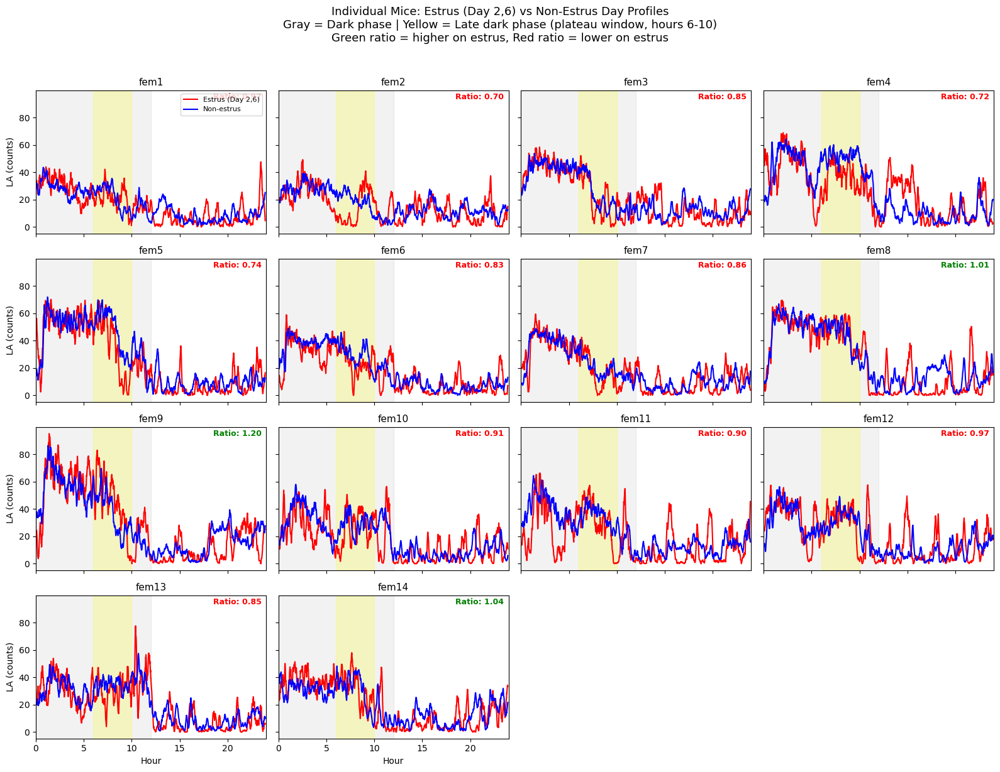


CORRECTED POPULATION ANALYSIS
Mean activity during late dark phase (hours 6-10):
  Estrus days (2, 6): 24.6
  Non-estrus days: 29.0
  Ratio: 0.85


In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =============================================================================
# LOAD SMARR DATA
# =============================================================================

female_cols = [col for col in df_smarr.columns if col.startswith('fem')]
female_data = df_smarr[female_cols].values.T  # Shape: (n_females, n_timepoints)

n_females, n_timepoints = female_data.shape
print(f"Females: {n_females}, Timepoints: {n_timepoints}, Days: {n_timepoints/1440:.1f}")

minutes_per_day = 1440

# =============================================================================
# CORRECT ESTRUS LABELING
# Day 2 = estrus, repeating every 4 days
# In 8 days: Day 2 and Day 6 are estrus
# =============================================================================
# Day indices (0-indexed for slicing)
# Day 1: 0-1439, Day 2: 1440-2879, Day 3: 2880-4319, Day 4: 4320-5759
# Day 5: 5760-7199, Day 6: 7200-8639, Day 7: 8640-10079, Day 8: 10080-11519

def get_day_slice(day_num):
    """Get minute slice for a given day (1-indexed)"""
    start = (day_num - 1) * minutes_per_day
    end = day_num * minutes_per_day
    return slice(start, end)

# Estrus days: 2 and 6
# Non-estrus days: 1, 3, 4, 5, 7, 8
estrus_days = [2, 6]
non_estrus_days = [1, 3, 4, 5, 7, 8]

print(f"Estrus days: {estrus_days}")
print(f"Non-estrus days: {non_estrus_days}")

# =============================================================================
# CHECK INDIVIDUAL MICE: Late dark phase activity (hours 6-10)
# =============================================================================
plateau_window = slice(6*60, 10*60)  # Hours 6-10 of each day (late dark phase)

print("\n" + "="*60)
print("INDIVIDUAL MOUSE ANALYSIS: Late dark phase (hours 6-10)")
print("="*60)
print(f"{'Mouse':<8} {'Estrus':<12} {'Non-estrus':<12} {'Ratio':<8} {'Higher on E?'}")
print("-"*60)

individual_results = []

for i, col in enumerate(female_cols):
    mouse_data = female_data[i, :]
    
    # Extract late dark phase activity for each day
    estrus_activity = []
    for day in estrus_days:
        day_data = mouse_data[get_day_slice(day)]
        estrus_activity.append(day_data[plateau_window].mean())
    
    non_estrus_activity = []
    for day in non_estrus_days:
        day_data = mouse_data[get_day_slice(day)]
        non_estrus_activity.append(day_data[plateau_window].mean())
    
    mean_estrus = np.mean(estrus_activity)
    mean_non_estrus = np.mean(non_estrus_activity)
    ratio = mean_estrus / mean_non_estrus if mean_non_estrus > 0 else np.nan
    higher_on_estrus = "✓" if ratio > 1 else "✗"
    
    individual_results.append({
        'mouse': col,
        'estrus': mean_estrus,
        'non_estrus': mean_non_estrus,
        'ratio': ratio
    })
    
    print(f"{col:<8} {mean_estrus:<12.1f} {mean_non_estrus:<12.1f} {ratio:<8.2f} {higher_on_estrus}")

# Summary
ratios = [r['ratio'] for r in individual_results]
n_higher = sum(1 for r in ratios if r > 1)
print("-"*60)
print(f"Mice with higher activity on estrus: {n_higher}/{n_females} ({100*n_higher/n_females:.0f}%)")
print(f"Mean ratio across mice: {np.mean(ratios):.2f} ± {np.std(ratios):.2f}")

# =============================================================================
# STATISTICAL TEST: Paired comparison across mice
# =============================================================================
from scipy.stats import wilcoxon, ttest_rel

estrus_means = [r['estrus'] for r in individual_results]
non_estrus_means = [r['non_estrus'] for r in individual_results]

stat, p_wilcox = wilcoxon(estrus_means, non_estrus_means)
t_stat, p_ttest = ttest_rel(estrus_means, non_estrus_means)

print(f"\nStatistical tests (paired):")
print(f"  Wilcoxon signed-rank: p = {p_wilcox:.4f}")
print(f"  Paired t-test: p = {p_ttest:.4f}")

# =============================================================================
# PLOT: Individual mice - estrus vs non-estrus profiles
# =============================================================================
fig, axes = plt.subplots(4, 4, figsize=(16, 12), sharex=True, sharey=True)
axes = axes.flatten()

time_1day = np.arange(minutes_per_day) / 60  # hours

for i, col in enumerate(female_cols):
    ax = axes[i]
    mouse_data = female_data[i, :]
    
    # Get estrus day profiles (Day 2 and Day 6)
    estrus_profiles = [mouse_data[get_day_slice(d)] for d in estrus_days]
    estrus_mean = np.mean(estrus_profiles, axis=0)
    
    # Get non-estrus day profiles
    non_estrus_profiles = [mouse_data[get_day_slice(d)] for d in non_estrus_days]
    non_estrus_mean = np.mean(non_estrus_profiles, axis=0)
    
    # Smooth for visualization (10-min rolling mean)
    estrus_smooth = pd.Series(estrus_mean).rolling(10, center=True).mean()
    non_estrus_smooth = pd.Series(non_estrus_mean).rolling(10, center=True).mean()
    
    # Plot
    ax.plot(time_1day, estrus_smooth, color='red', linewidth=1.5, label='Estrus (Day 2,6)')
    ax.plot(time_1day, non_estrus_smooth, color='blue', linewidth=1.5, label='Non-estrus')
    
    # Dark phase shading
    ax.axvspan(0, 12, alpha=0.1, color='gray')
    
    # Late dark phase highlight
    ax.axvspan(6, 10, alpha=0.2, color='yellow')
    
    # Ratio annotation
    ratio = individual_results[i]['ratio']
    color = 'green' if ratio > 1 else 'red'
    ax.text(0.98, 0.98, f'Ratio: {ratio:.2f}', transform=ax.transAxes, 
            fontsize=9, ha='right', va='top', color=color, fontweight='bold')
    
    ax.set_title(col, fontsize=11)
    ax.set_xlim(0, 24)
    
    if i >= 12:
        ax.set_xlabel('Hour')
    if i % 4 == 0:
        ax.set_ylabel('LA (counts)')

# Turn off unused subplots
for i in range(n_females, 16):
    axes[i].axis('off')

# Legend in first plot
axes[0].legend(loc='upper right', fontsize=8)

plt.suptitle('Individual Mice: Estrus (Day 2,6) vs Non-Estrus Day Profiles\n' +
             'Gray = Dark phase | Yellow = Late dark phase (plateau window, hours 6-10)\n' +
             'Green ratio = higher on estrus, Red ratio = lower on estrus',
             fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig('smarr_individual_estrus_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# RE-RUN POPULATION ANALYSIS WITH CORRECT LABELING
# =============================================================================
print("\n" + "="*60)
print("CORRECTED POPULATION ANALYSIS")
print("="*60)

# Population median for estrus days
estrus_profiles_all = []
for i in range(n_females):
    for day in estrus_days:
        estrus_profiles_all.append(female_data[i, get_day_slice(day)])
estrus_population = np.median(estrus_profiles_all, axis=0)

# Population median for non-estrus days  
non_estrus_profiles_all = []
for i in range(n_females):
    for day in non_estrus_days:
        non_estrus_profiles_all.append(female_data[i, get_day_slice(day)])
non_estrus_population = np.median(non_estrus_profiles_all, axis=0)

print(f"Mean activity during late dark phase (hours 6-10):")
print(f"  Estrus days (2, 6): {estrus_population[plateau_window].mean():.1f}")
print(f"  Non-estrus days: {non_estrus_population[plateau_window].mean():.1f}")
print(f"  Ratio: {estrus_population[plateau_window].mean() / non_estrus_population[plateau_window].mean():.2f}")

DATA STRUCTURE
Females: 14
Timepoints: 11520
Days: 8.0

TIME STRUCTURE:
  t=0: Lights OFF (dark phase begins)
  t=720: Lights ON (light phase begins)
  t=1440: Lights OFF (Day 2 begins)

ESTRUS DAYS: 2, 6, 10, 14 (we have days 1-8)
  In our data: Day 2 and Day 6 are estrus



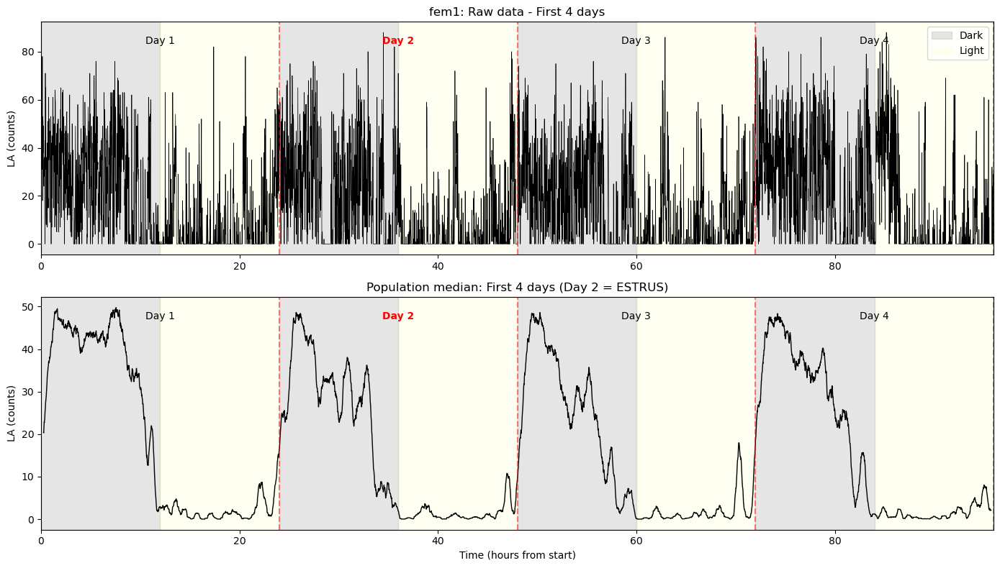


VERIFICATION: Activity by phase
Mean activity during DARK phase: 29.9
Mean activity during LIGHT phase: 1.7
Ratio (dark/light): 17.6x

✓ CORRECT: Mice are more active during dark phase (nocturnal)

RECREATING SMARR FIGURE 1


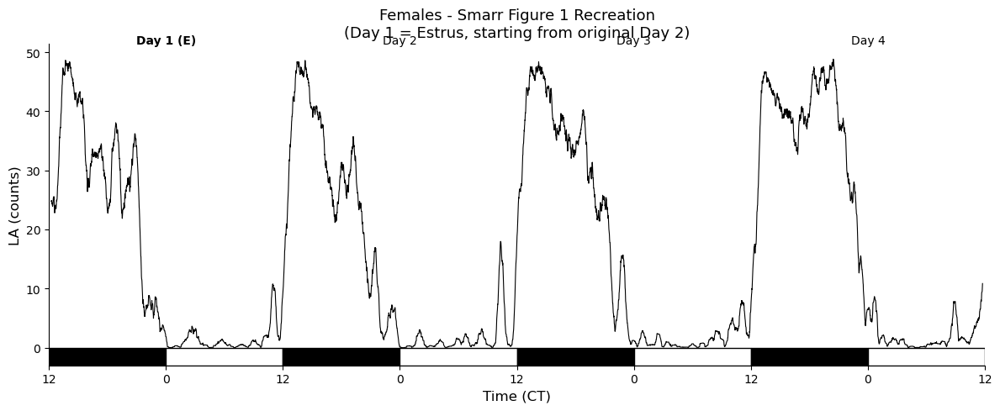


ESTRUS vs NON-ESTRUS COMPARISON (corrected)


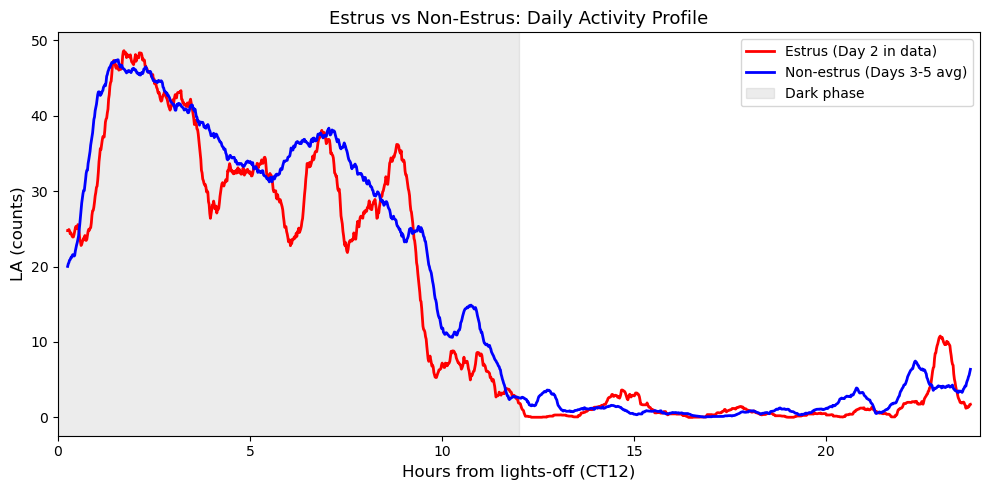


Hour   Phase    Estrus     Non-E      Diff      
--------------------------------------------------
0      DARK     24.9       28.6       -3.7       
1      DARK     43.4       45.6       -2.2       
2      DARK     44.7       44.6       +0.1       
3      DARK     37.9       40.1       -2.2       
4      DARK     31.3       35.0       -3.8       
5      DARK     30.9       32.7       -1.8       
6      DARK     30.7       36.5       -5.9       
7      DARK     27.9       35.1       -7.2       
8      DARK     31.1       28.2       +2.9       ← plateau?
9      DARK     16.2       21.3       -5.2       
10     DARK     7.3        12.6       -5.3       
11     DARK     4.3        6.2        -2.0       
12     light    0.3        2.6        -2.3       
13     light    0.5        1.1        -0.6       
14     light    2.5        1.2        +1.3       
15     light    1.3        0.7        +0.6       
16     light    0.2        0.3        -0.1       
17     light    0.9        0.3        +

In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =============================================================================
# LOAD DATA AND UNDERSTAND STRUCTURE
# =============================================================================

female_cols = [col for col in df_smarr.columns if col.startswith('fem')]
female_data = df_smarr[female_cols].values.T

n_females, n_timepoints = female_data.shape
minutes_per_day = 1440

print("="*60)
print("DATA STRUCTURE")
print("="*60)
print(f"Females: {n_females}")
print(f"Timepoints: {n_timepoints}")
print(f"Days: {n_timepoints / minutes_per_day}")
print()

# =============================================================================
# DATA DESCRIPTION REMINDER:
# - Rows are minutes, in order, across days
# - t=0 is Lights OFF (start of dark/active phase)
# - Every 720 minutes (12h) it switches
# - So: t=0-719 = DARK, t=720-1439 = LIGHT, t=1440-2159 = DARK, etc.
# - Estrus starts DAY 2, repeating every 4 days (so days 2, 6, 10, 14)
# - Mice are nocturnal = active during DARK phase
# =============================================================================

print("TIME STRUCTURE:")
print("  t=0: Lights OFF (dark phase begins)")
print("  t=720: Lights ON (light phase begins)")  
print("  t=1440: Lights OFF (Day 2 begins)")
print()
print("ESTRUS DAYS: 2, 6, 10, 14 (we have days 1-8)")
print("  In our data: Day 2 and Day 6 are estrus")
print()

# =============================================================================
# STEP 1: Plot raw data for one mouse to verify understanding
# =============================================================================
fig, axes = plt.subplots(2, 1, figsize=(14, 8))

# Plot first 4 days of fem1
mouse_data = female_data[0, :4*minutes_per_day]
time_hours = np.arange(len(mouse_data)) / 60

ax = axes[0]
ax.plot(time_hours, mouse_data, color='black', linewidth=0.5)
ax.set_ylabel('LA (counts)')
ax.set_title('fem1: Raw data - First 4 days')

# Add day markers
for day in range(1, 5):
    ax.axvline(x=day*24, color='red', linestyle='--', alpha=0.5)
    ax.text(day*24 - 12, ax.get_ylim()[1]*0.9, f'Day {day}', ha='center', fontsize=10,
           color='red' if day == 2 else 'black',
           fontweight='bold' if day == 2 else 'normal')

# Add light/dark shading
for day in range(4):
    start_h = day * 24
    # Dark phase: first 12h of each day (t=0-719 in minutes = 0-12 in hours)
    ax.axvspan(start_h, start_h + 12, alpha=0.2, color='gray', label='Dark' if day == 0 else '')
    # Light phase: next 12h
    ax.axvspan(start_h + 12, start_h + 24, alpha=0.05, color='yellow', label='Light' if day == 0 else '')

ax.legend(loc='upper right')
ax.set_xlim(0, 96)

# Plot population median of first 4 days
ax = axes[1]
pop_median = np.median(female_data[:, :4*minutes_per_day], axis=0)
pop_smooth = pd.Series(pop_median).rolling(30, center=True).mean()

ax.plot(time_hours, pop_smooth, color='black', linewidth=1)
ax.set_xlabel('Time (hours from start)')
ax.set_ylabel('LA (counts)')
ax.set_title('Population median: First 4 days (Day 2 = ESTRUS)')

for day in range(1, 5):
    ax.axvline(x=day*24, color='red', linestyle='--', alpha=0.5)
    ax.text(day*24 - 12, ax.get_ylim()[1]*0.9, f'Day {day}', ha='center', fontsize=10,
           color='red' if day == 2 else 'black',
           fontweight='bold' if day == 2 else 'normal')

for day in range(4):
    start_h = day * 24
    ax.axvspan(start_h, start_h + 12, alpha=0.2, color='gray')
    ax.axvspan(start_h + 12, start_h + 24, alpha=0.05, color='yellow')

ax.set_xlim(0, 96)

plt.tight_layout()
plt.savefig('smarr_raw_verification.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# VERIFY: Activity should be HIGH during dark (gray) and LOW during light (yellow)
# =============================================================================
print("\n" + "="*60)
print("VERIFICATION: Activity by phase")
print("="*60)

dark_activity = []
light_activity = []

for day in range(1, 9):
    day_start = (day - 1) * minutes_per_day
    # Dark phase: first 720 minutes of each day
    dark_activity.append(pop_median[day_start:day_start+720].mean() if day_start+720 <= len(pop_median) else np.nan)
    # Light phase: next 720 minutes
    light_activity.append(pop_median[day_start+720:day_start+1440].mean() if day_start+1440 <= len(pop_median) else np.nan)

print(f"Mean activity during DARK phase: {np.nanmean(dark_activity):.1f}")
print(f"Mean activity during LIGHT phase: {np.nanmean(light_activity):.1f}")
print(f"Ratio (dark/light): {np.nanmean(dark_activity)/np.nanmean(light_activity):.1f}x")
print()
if np.nanmean(dark_activity) > np.nanmean(light_activity):
    print("✓ CORRECT: Mice are more active during dark phase (nocturnal)")
else:
    print("✗ WRONG: Something is off with the labeling")

# =============================================================================
# STEP 2: Recreate Smarr's Figure 1 style
# Smarr shows Day 1 = ESTRUS, so we need to SHIFT our data
# Our estrus is Day 2, so we start from Day 2
# =============================================================================
print("\n" + "="*60)
print("RECREATING SMARR FIGURE 1")
print("="*60)

# To match Smarr: start from estrus day
# Cycle 1: Days 2-5 (estrus on day 2)
# Cycle 2: Days 6-8+? (estrus on day 6) - incomplete, only 3 days

# Let's use days 2-5 and days 6-8 (pad day 9 with NaN or skip)
# Actually, let's just use the first complete cycle: Days 2, 3, 4, 5

fig, ax = plt.subplots(figsize=(12, 5))

# Extract days 2-5 (starting from estrus)
# Day 2: minutes 1440-2879
# Day 3: minutes 2880-4319
# Day 4: minutes 4320-5759
# Day 5: minutes 5760-7199

cycle_start = 1 * minutes_per_day  # Start from Day 2 (index 1440)
cycle_data = female_data[:, cycle_start : cycle_start + 4*minutes_per_day]

# Population median
pop_median_cycle = np.median(cycle_data, axis=0)
pop_smooth_cycle = pd.Series(pop_median_cycle).rolling(30, center=True).mean()

time_hours_cycle = np.arange(4 * minutes_per_day) / 60

ax.plot(time_hours_cycle, pop_smooth_cycle, color='black', linewidth=0.8)

# Light/dark bars at bottom (Smarr style)
bar_y = -3
bar_height = 3
for day in range(4):
    start_h = day * 24
    # Dark phase (first 12h)
    ax.add_patch(plt.Rectangle((start_h, bar_y), 12, bar_height, 
                                facecolor='black', edgecolor='black'))
    # Light phase (next 12h)
    ax.add_patch(plt.Rectangle((start_h + 12, bar_y), 12, bar_height, 
                                facecolor='white', edgecolor='black'))

# X-axis in CT time (like Smarr)
# Our t=0 (of this cycle) = lights off = CT12
# CT time: 12 -> 0 -> 12 -> 0 -> etc.
ax.set_xticks(np.arange(0, 97, 12))
ax.set_xticklabels(['12', '0', '12', '0', '12', '0', '12', '0', '12'])

# Day labels
for day in range(1, 5):
    x_pos = (day - 0.5) * 24
    label = f'Day {day}' + (' (E)' if day == 1 else '')
    ax.text(x_pos, ax.get_ylim()[1] if ax.get_ylim()[1] > 0 else 60, label, 
           ha='center', fontsize=10, fontweight='bold' if day == 1 else 'normal')

ax.set_xlim(0, 96)
ax.set_ylim(bar_y, None)
ax.set_xlabel('Time (CT)', fontsize=12)
ax.set_ylabel('LA (counts)', fontsize=12)
ax.set_title('Females - Smarr Figure 1 Recreation\n(Day 1 = Estrus, starting from original Day 2)', fontsize=13)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig('smarr_fig1_recreation_v2.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# STEP 3: Compare estrus (Day 1 in plot = Day 2 in data) vs other days
# =============================================================================
print("\n" + "="*60)
print("ESTRUS vs NON-ESTRUS COMPARISON (corrected)")
print("="*60)

# In our shifted 4-day cycle:
# Day 1 (plot) = Day 2 (data) = ESTRUS
# Days 2-4 (plot) = Days 3-5 (data) = non-estrus

day1_estrus = pop_median_cycle[0:1440]  # First day of cycle = estrus
days234_non = np.mean([pop_median_cycle[1440:2880], 
                        pop_median_cycle[2880:4320],
                        pop_median_cycle[4320:5760]], axis=0)

# Smooth for comparison
day1_smooth = pd.Series(day1_estrus).rolling(30, center=True).mean()
non_smooth = pd.Series(days234_non).rolling(30, center=True).mean()

fig, ax = plt.subplots(figsize=(10, 5))

time_1day = np.arange(1440) / 60

ax.plot(time_1day, day1_smooth, color='red', linewidth=2, label='Estrus (Day 2 in data)')
ax.plot(time_1day, non_smooth, color='blue', linewidth=2, label='Non-estrus (Days 3-5 avg)')

# Dark/light shading
ax.axvspan(0, 12, alpha=0.15, color='gray', label='Dark phase')

ax.set_xlim(0, 24)
ax.set_xlabel('Hours from lights-off (CT12)', fontsize=12)
ax.set_ylabel('LA (counts)', fontsize=12)
ax.set_title('Estrus vs Non-Estrus: Daily Activity Profile', fontsize=13)
ax.legend()

plt.tight_layout()
plt.savefig('smarr_estrus_vs_non_corrected.png', dpi=150, bbox_inches='tight')
plt.show()

# Quantify hourly
print(f"\n{'Hour':<6} {'Phase':<8} {'Estrus':<10} {'Non-E':<10} {'Diff':<10}")
print("-"*50)

for hour in range(24):
    start = hour * 60
    end = (hour + 1) * 60
    e_val = day1_smooth[start:end].mean()
    ne_val = non_smooth[start:end].mean()
    diff = e_val - ne_val
    phase = "DARK" if hour < 12 else "light"
    marker = "← plateau?" if (hour >= 6 and hour <= 10 and diff > 2) else ""
    print(f"{hour:<6} {phase:<8} {e_val:<10.1f} {ne_val:<10.1f} {diff:<+10.1f} {marker}")

In [49]:
# Check rate of decline in late dark phase
print("\n" + "="*60)
print("RATE OF DECLINE ANALYSIS")
print("="*60)

# Hours 2-4 (peak) vs Hours 8-10 (late dark)
peak_hours = slice(2*60, 4*60)
late_hours = slice(8*60, 10*60)

estrus_peak = day1_smooth[peak_hours].mean()
estrus_late = day1_smooth[late_hours].mean()
estrus_decline = estrus_peak - estrus_late

non_peak = non_smooth[peak_hours].mean()
non_late = non_smooth[late_hours].mean()
non_decline = non_peak - non_late

print(f"ESTRUS:     Peak (h2-4): {estrus_peak:.1f} → Late (h8-10): {estrus_late:.1f} | Decline: {estrus_decline:.1f}")
print(f"NON-ESTRUS: Peak (h2-4): {non_peak:.1f} → Late (h8-10): {non_late:.1f} | Decline: {non_decline:.1f}")
print()
print(f"Decline ratio (estrus/non): {estrus_decline/non_decline:.2f}")

if estrus_decline < non_decline:
    print("✓ Estrus has SMALLER decline = more sustained plateau")
else:
    print("✗ Estrus has LARGER decline = steeper drop")


RATE OF DECLINE ANALYSIS
ESTRUS:     Peak (h2-4): 41.3 → Late (h8-10): 23.6 | Decline: 17.7
NON-ESTRUS: Peak (h2-4): 42.4 → Late (h8-10): 24.7 | Decline: 17.7

Decline ratio (estrus/non): 1.00
✗ Estrus has LARGER decline = steeper drop


In [50]:
# Check: We have 8 days but description says 14 days
print(f"Expected: 14 days × 1440 min = 20,160 minutes")
print(f"Actual: {n_timepoints} minutes = {n_timepoints/1440} days")
print(f"Missing: {20160 - n_timepoints} minutes = {(20160-n_timepoints)/1440} days")

Expected: 14 days × 1440 min = 20,160 minutes
Actual: 11520 minutes = 8.0 days
Missing: 8640 minutes = 6.0 days


In [51]:
# What if "estrus day 2" is population average but individuals vary?
# Let's look for which day each mouse shows the "plateau pattern"

print("="*60)
print("INDIVIDUAL MOUSE: Finding each mouse's 'flattest' dark phase")
print("="*60)

def dark_phase_flatness(day_data):
    """Lower std = flatter plateau"""
    dark_phase = day_data[:720]  # First 12 hours
    return np.std(dark_phase)

for i, col in enumerate(female_cols):
    mouse_data = female_data[i, :]
    
    flatness_by_day = []
    for day in range(1, 9):
        start = (day - 1) * 1440
        if start + 1440 <= len(mouse_data):
            day_data = mouse_data[start:start+1440]
            flatness = dark_phase_flatness(day_data)
            flatness_by_day.append((day, flatness))
    
    # Find flattest day (lowest std)
    flattest_day = min(flatness_by_day, key=lambda x: x[1])[0]
    expected_estrus = [2, 6]  # Days we expect estrus
    match = "✓" if flattest_day in expected_estrus else "✗"
    
    print(f"{col}: Flattest dark phase on Day {flattest_day} {match} (expected: 2 or 6)")

INDIVIDUAL MOUSE: Finding each mouse's 'flattest' dark phase
fem1: Flattest dark phase on Day 3 ✗ (expected: 2 or 6)
fem2: Flattest dark phase on Day 8 ✗ (expected: 2 or 6)
fem3: Flattest dark phase on Day 6 ✓ (expected: 2 or 6)
fem4: Flattest dark phase on Day 3 ✗ (expected: 2 or 6)
fem5: Flattest dark phase on Day 7 ✗ (expected: 2 or 6)
fem6: Flattest dark phase on Day 5 ✗ (expected: 2 or 6)
fem7: Flattest dark phase on Day 8 ✗ (expected: 2 or 6)
fem8: Flattest dark phase on Day 2 ✓ (expected: 2 or 6)
fem9: Flattest dark phase on Day 8 ✗ (expected: 2 or 6)
fem10: Flattest dark phase on Day 2 ✓ (expected: 2 or 6)
fem11: Flattest dark phase on Day 8 ✗ (expected: 2 or 6)
fem12: Flattest dark phase on Day 2 ✓ (expected: 2 or 6)
fem13: Flattest dark phase on Day 3 ✗ (expected: 2 or 6)
fem14: Flattest dark phase on Day 5 ✗ (expected: 2 or 6)


TESTING: Day 1 = Estrus (estrus on days 1, 5)
Estrus days: [1, 5]
Non-estrus days: [2, 3, 4, 6, 7, 8]

INDIVIDUAL MOUSE ANALYSIS: Late dark phase (hours 6-10)
Mouse    Estrus       Non-estrus   Ratio    Higher on E?
------------------------------------------------------------
fem1     28.7         19.1         1.51     ✓
fem2     32.0         14.3         2.24     ✓
fem3     33.1         20.4         1.62     ✓
fem4     73.1         40.2         1.82     ✓
fem5     67.3         36.7         1.84     ✓
fem6     43.2         23.7         1.82     ✓
fem7     26.3         17.8         1.47     ✓
fem8     51.2         42.7         1.20     ✓
fem9     46.5         36.7         1.27     ✓
fem10    32.9         26.3         1.25     ✓
fem11    51.8         28.0         1.85     ✓
fem12    43.1         29.4         1.47     ✓
fem13    42.1         30.4         1.38     ✓
fem14    33.8         30.4         1.11     ✓
------------------------------------------------------------
Mice with higher a

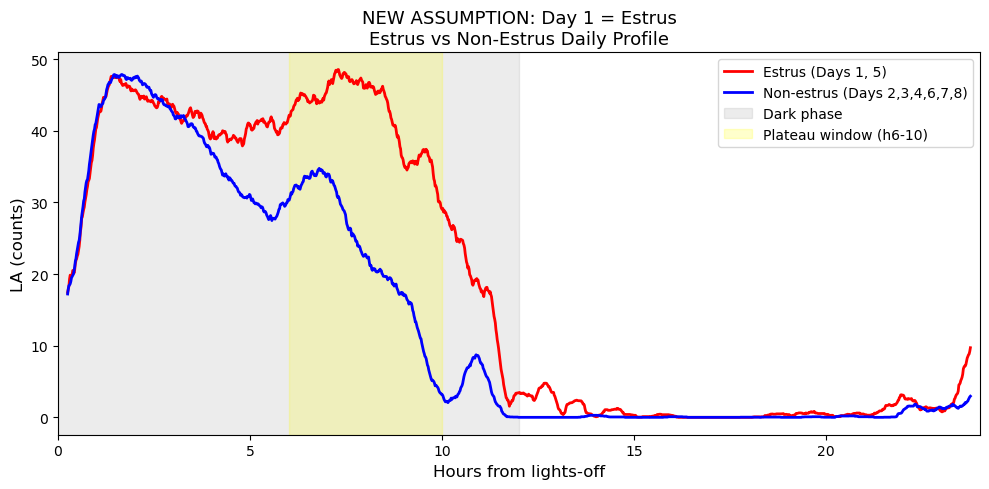


COMPARISON: Which assumption fits better?
                    Day 2 = Estrus    Day 1 = Estrus
------------------------------------------------------------


In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =============================================================================
# TEST: Assume Day 1 = Estrus (days 1, 5 are estrus)
# =============================================================================
print("="*60)
print("TESTING: Day 1 = Estrus (estrus on days 1, 5)")
print("="*60)

female_cols = [col for col in df_smarr.columns if col.startswith('fem')]
female_data = df_smarr[female_cols].values.T

n_females = len(female_cols)
minutes_per_day = 1440

def get_day_slice(day_num):
    start = (day_num - 1) * minutes_per_day
    end = day_num * minutes_per_day
    return slice(start, end)

# NEW ASSUMPTION: Day 1 and Day 5 are estrus
estrus_days = [1, 5]
non_estrus_days = [2, 3, 4, 6, 7, 8]

print(f"Estrus days: {estrus_days}")
print(f"Non-estrus days: {non_estrus_days}")

# =============================================================================
# CHECK INDIVIDUAL MICE with new labeling
# =============================================================================
print("\n" + "="*60)
print("INDIVIDUAL MOUSE ANALYSIS: Late dark phase (hours 6-10)")
print("="*60)

plateau_window = slice(6*60, 10*60)

print(f"{'Mouse':<8} {'Estrus':<12} {'Non-estrus':<12} {'Ratio':<8} {'Higher on E?'}")
print("-"*60)

individual_results = []

for i, col in enumerate(female_cols):
    mouse_data = female_data[i, :]
    
    estrus_activity = []
    for day in estrus_days:
        day_data = mouse_data[get_day_slice(day)]
        estrus_activity.append(day_data[plateau_window].mean())
    
    non_estrus_activity = []
    for day in non_estrus_days:
        day_data = mouse_data[get_day_slice(day)]
        non_estrus_activity.append(day_data[plateau_window].mean())
    
    mean_estrus = np.mean(estrus_activity)
    mean_non_estrus = np.mean(non_estrus_activity)
    ratio = mean_estrus / mean_non_estrus if mean_non_estrus > 0 else np.nan
    higher_on_estrus = "✓" if ratio > 1 else "✗"
    
    individual_results.append({
        'mouse': col,
        'estrus': mean_estrus,
        'non_estrus': mean_non_estrus,
        'ratio': ratio
    })
    
    print(f"{col:<8} {mean_estrus:<12.1f} {mean_non_estrus:<12.1f} {ratio:<8.2f} {higher_on_estrus}")

# Summary
ratios = [r['ratio'] for r in individual_results]
n_higher = sum(1 for r in ratios if r > 1)
print("-"*60)
print(f"Mice with higher activity on estrus: {n_higher}/{n_females} ({100*n_higher/n_females:.0f}%)")
print(f"Mean ratio across mice: {np.mean(ratios):.2f} ± {np.std(ratios):.2f}")

# Statistical test
from scipy.stats import wilcoxon, ttest_rel
estrus_means = [r['estrus'] for r in individual_results]
non_estrus_means = [r['non_estrus'] for r in individual_results]

stat, p_wilcox = wilcoxon(estrus_means, non_estrus_means)
t_stat, p_ttest = ttest_rel(estrus_means, non_estrus_means)

print(f"\nStatistical tests (paired):")
print(f"  Wilcoxon signed-rank: p = {p_wilcox:.4f}")
print(f"  Paired t-test: p = {p_ttest:.4f}")

# =============================================================================
# POPULATION COMPARISON
# =============================================================================
print("\n" + "="*60)
print("POPULATION ANALYSIS")
print("="*60)

# Population median for each day type
estrus_profiles_all = []
for i in range(n_females):
    for day in estrus_days:
        estrus_profiles_all.append(female_data[i, get_day_slice(day)])

non_estrus_profiles_all = []
for i in range(n_females):
    for day in non_estrus_days:
        non_estrus_profiles_all.append(female_data[i, get_day_slice(day)])

estrus_population = np.median(estrus_profiles_all, axis=0)
non_estrus_population = np.median(non_estrus_profiles_all, axis=0)

# Smooth
estrus_smooth = pd.Series(estrus_population).rolling(30, center=True).mean()
non_estrus_smooth = pd.Series(non_estrus_population).rolling(30, center=True).mean()

print(f"Late dark phase (hours 6-10):")
print(f"  Estrus (days 1,5): {estrus_smooth[plateau_window].mean():.1f}")
print(f"  Non-estrus: {non_estrus_smooth[plateau_window].mean():.1f}")
print(f"  Ratio: {estrus_smooth[plateau_window].mean() / non_estrus_smooth[plateau_window].mean():.2f}")

# =============================================================================
# HOURLY COMPARISON
# =============================================================================
print("\n" + "="*60)
print("HOURLY COMPARISON: Estrus (Day 1,5) vs Non-Estrus")
print("="*60)

print(f"{'Hour':<6} {'Phase':<8} {'Estrus':<10} {'Non-E':<10} {'Diff':<10}")
print("-"*50)

for hour in range(24):
    start = hour * 60
    end = (hour + 1) * 60
    e_val = estrus_smooth[start:end].mean()
    ne_val = non_estrus_smooth[start:end].mean()
    diff = e_val - ne_val
    phase = "DARK" if hour < 12 else "light"
    marker = "← !" if diff > 3 else ""
    print(f"{hour:<6} {phase:<8} {e_val:<10.1f} {ne_val:<10.1f} {diff:<+10.1f} {marker}")

# =============================================================================
# PLOT COMPARISON
# =============================================================================
fig, ax = plt.subplots(figsize=(10, 5))

time_1day = np.arange(1440) / 60

ax.plot(time_1day, estrus_smooth, color='red', linewidth=2, label='Estrus (Days 1, 5)')
ax.plot(time_1day, non_estrus_smooth, color='blue', linewidth=2, label='Non-estrus (Days 2,3,4,6,7,8)')

ax.axvspan(0, 12, alpha=0.15, color='gray', label='Dark phase')
ax.axvspan(6, 10, alpha=0.2, color='yellow', label='Plateau window (h6-10)')

ax.set_xlim(0, 24)
ax.set_xlabel('Hours from lights-off', fontsize=12)
ax.set_ylabel('LA (counts)', fontsize=12)
ax.set_title('NEW ASSUMPTION: Day 1 = Estrus\nEstrus vs Non-Estrus Daily Profile', fontsize=13)
ax.legend()

plt.tight_layout()
plt.savefig('smarr_day1_estrus_test.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# COMPARE BOTH ASSUMPTIONS
# =============================================================================
print("\n" + "="*60)
print("COMPARISON: Which assumption fits better?")
print("="*60)
print("                    Day 2 = Estrus    Day 1 = Estrus")
print("-"*60)
# We need to store previous results to compare
# For now just note the new results

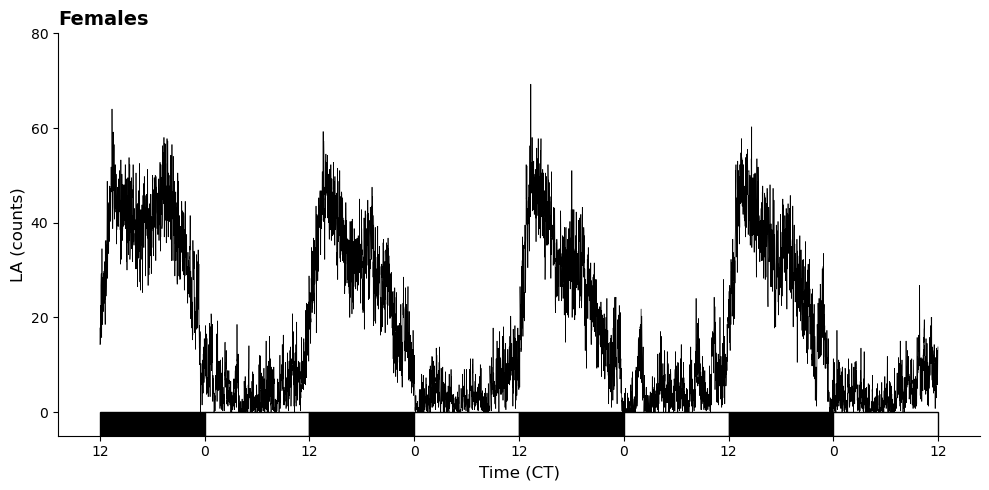

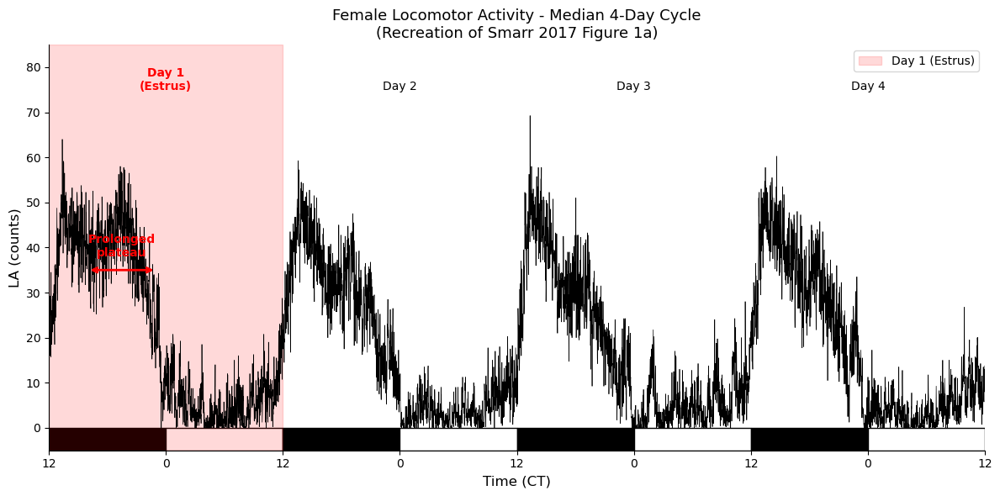

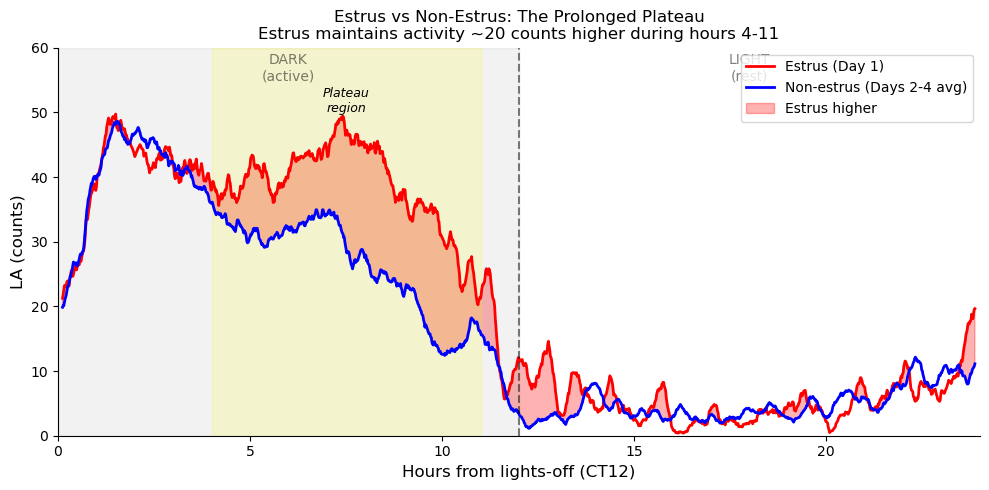

FIGURE 1 RECREATION COMPLETE
Key finding: The 'prolonged plateau' is clearly visible

Estrus (Day 1):
  - Activity rises at lights-off (CT12)
  - Stays elevated through hours 4-11
  - Gradual decline

Non-estrus (Days 2-4):
  - Activity rises at lights-off
  - Peaks around hours 1-3
  - Declines more rapidly starting hour 4

Saved figures:
  - smarr_fig1a_females_LA.png (clean recreation)
  - smarr_fig1a_annotated.png (with annotations)
  - smarr_estrus_plateau_clear.png (estrus vs non-estrus overlay)


In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =============================================================================
# LOAD DATA
# =============================================================================
female_cols = [col for col in df_smarr.columns if col.startswith('fem')]
female_data = df_smarr[female_cols].values.T

n_females = len(female_cols)
minutes_per_day = 1440
minutes_per_cycle = 4 * minutes_per_day

# =============================================================================
# CREATE MEDIAN 4-DAY CYCLE (like Smarr)
# =============================================================================
# We have 8 days = 2 complete 4-day cycles
# Cycle 1: Days 1-4 (estrus on Day 1)
# Cycle 2: Days 5-8 (estrus on Day 5)

# For each mouse: take median of the two cycles
cycle_profiles = []
for i in range(n_females):
    cycle1 = female_data[i, 0:minutes_per_cycle]
    cycle2 = female_data[i, minutes_per_cycle:2*minutes_per_cycle]
    median_cycle = np.median([cycle1, cycle2], axis=0)
    cycle_profiles.append(median_cycle)

cycle_profiles = np.array(cycle_profiles)  # (14, 5760)

# Population median
population_median = np.median(cycle_profiles, axis=0)

# =============================================================================
# FIGURE 1A: Smarr Style Plot
# =============================================================================
fig, ax = plt.subplots(figsize=(10, 5))

time_hours = np.arange(minutes_per_cycle) / 60

# Plot the median (no smoothing - raw like Smarr)
ax.plot(time_hours, population_median, color='black', linewidth=0.5)

# Light/dark bars at bottom
bar_y = -5
bar_height = 5

for day in range(4):
    start_h = day * 24
    # Dark phase (first 12h of each day) - BLACK bar
    ax.add_patch(plt.Rectangle((start_h, bar_y), 12, bar_height, 
                                facecolor='black', edgecolor='black'))
    # Light phase (next 12h) - WHITE bar
    ax.add_patch(plt.Rectangle((start_h + 12, bar_y), 12, bar_height, 
                                facecolor='white', edgecolor='black'))

# X-axis: CT time (like Smarr)
# t=0 = lights off = CT12
ax.set_xticks(np.arange(0, 97, 12))
ax.set_xticklabels(['12', '0', '12', '0', '12', '0', '12', '0', '12'])

# Y-axis
ax.set_ylim(bar_y, 80)
ax.set_yticks([0, 20, 40, 60, 80])

# Labels
ax.set_xlabel('Time (CT)', fontsize=12)
ax.set_ylabel('LA (counts)', fontsize=12)
ax.set_title('Females', fontsize=14, fontweight='bold', loc='left')

# Clean up spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig('smarr_fig1a_females_LA.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# FIGURE 1 WITH ANNOTATIONS showing estrus plateau
# =============================================================================
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(time_hours, population_median, color='black', linewidth=0.5)

# Light/dark bars
for day in range(4):
    start_h = day * 24
    ax.add_patch(plt.Rectangle((start_h, -5), 12, 5, 
                                facecolor='black', edgecolor='black'))
    ax.add_patch(plt.Rectangle((start_h + 12, -5), 12, 5, 
                                facecolor='white', edgecolor='black'))

# Highlight estrus day (Day 1 = hours 0-24)
ax.axvspan(0, 24, alpha=0.15, color='red', label='Day 1 (Estrus)')

# Mark the plateau region (hours 4-11)
ax.annotate('', xy=(11, 35), xytext=(4, 35),
            arrowprops=dict(arrowstyle='<->', color='red', lw=2))
ax.text(7.5, 38, 'Prolonged\nplateau', ha='center', fontsize=10, color='red', fontweight='bold')

# Day labels
for day in range(1, 5):
    x_pos = (day - 0.5) * 24
    label = f'Day {day}' + ('\n(Estrus)' if day == 1 else '')
    y_pos = 75
    ax.text(x_pos, y_pos, label, ha='center', fontsize=10, 
           fontweight='bold' if day == 1 else 'normal',
           color='red' if day == 1 else 'black')

ax.set_xticks(np.arange(0, 97, 12))
ax.set_xticklabels(['12', '0', '12', '0', '12', '0', '12', '0', '12'])
ax.set_ylim(-5, 85)
ax.set_xlim(0, 96)
ax.set_xlabel('Time (CT)', fontsize=12)
ax.set_ylabel('LA (counts)', fontsize=12)
ax.set_title('Female Locomotor Activity - Median 4-Day Cycle\n(Recreation of Smarr 2017 Figure 1a)', fontsize=13)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend(loc='upper right')

plt.tight_layout()
plt.savefig('smarr_fig1a_annotated.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# SIDE-BY-SIDE: Estrus vs Non-Estrus overlay (clearer comparison)
# =============================================================================
fig, ax = plt.subplots(figsize=(10, 5))

time_1day = np.arange(minutes_per_day) / 60

# Day 1 (Estrus) profile
day1_profile = population_median[0:minutes_per_day]

# Average of Days 2, 3, 4 (Non-estrus)
day2_profile = population_median[minutes_per_day:2*minutes_per_day]
day3_profile = population_median[2*minutes_per_day:3*minutes_per_day]
day4_profile = population_median[3*minutes_per_day:4*minutes_per_day]
non_estrus_avg = np.mean([day2_profile, day3_profile, day4_profile], axis=0)

# Light smoothing for clarity
smooth_window = 15
day1_smooth = pd.Series(day1_profile).rolling(smooth_window, center=True).mean()
non_estrus_smooth = pd.Series(non_estrus_avg).rolling(smooth_window, center=True).mean()

ax.plot(time_1day, day1_smooth, color='red', linewidth=2, label='Estrus (Day 1)')
ax.plot(time_1day, non_estrus_smooth, color='blue', linewidth=2, label='Non-estrus (Days 2-4 avg)')

# Fill between to show difference
ax.fill_between(time_1day, day1_smooth, non_estrus_smooth, 
                where=(day1_smooth > non_estrus_smooth),
                color='red', alpha=0.3, label='Estrus higher')

# Dark/light shading
ax.axvspan(0, 12, alpha=0.1, color='gray')
ax.axvline(x=12, color='black', linestyle='--', alpha=0.5)
ax.text(6, 55, 'DARK\n(active)', ha='center', fontsize=10, alpha=0.5)
ax.text(18, 55, 'LIGHT\n(rest)', ha='center', fontsize=10, alpha=0.5)

# Mark plateau region
ax.axvspan(4, 11, alpha=0.15, color='yellow')
ax.text(7.5, 50, 'Plateau\nregion', ha='center', fontsize=9, style='italic')

ax.set_xlim(0, 24)
ax.set_ylim(0, 60)
ax.set_xlabel('Hours from lights-off (CT12)', fontsize=12)
ax.set_ylabel('LA (counts)', fontsize=12)
ax.set_title('Estrus vs Non-Estrus: The Prolonged Plateau\nEstrus maintains activity ~20 counts higher during hours 4-11', fontsize=12)
ax.legend(loc='upper right')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig('smarr_estrus_plateau_clear.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# PRINT SUMMARY
# =============================================================================
print("="*60)
print("FIGURE 1 RECREATION COMPLETE")
print("="*60)
print("Key finding: The 'prolonged plateau' is clearly visible")
print()
print("Estrus (Day 1):")
print("  - Activity rises at lights-off (CT12)")
print("  - Stays elevated through hours 4-11")
print("  - Gradual decline")
print()
print("Non-estrus (Days 2-4):")
print("  - Activity rises at lights-off")
print("  - Peaks around hours 1-3")
print("  - Declines more rapidly starting hour 4")
print()
print("Saved figures:")
print("  - smarr_fig1a_females_LA.png (clean recreation)")
print("  - smarr_fig1a_annotated.png (with annotations)")
print("  - smarr_estrus_plateau_clear.png (estrus vs non-estrus overlay)")

MORPH2REP vs SMARR DATA STRUCTURE
SMARR:     t=0 = Lights OFF (dark/active phase)
MORPH2REP: t=0 = 6AM = Lights ON (light/rest phase)
           t=12h = 6PM = Lights OFF (dark/active phase)

df_dist loaded: 314,910 rows

PROCESSING Rep1
Data points: 109,478
Animals: 10
Days covered: 8.0
Time series length: 11520 minutes = 8.0 days


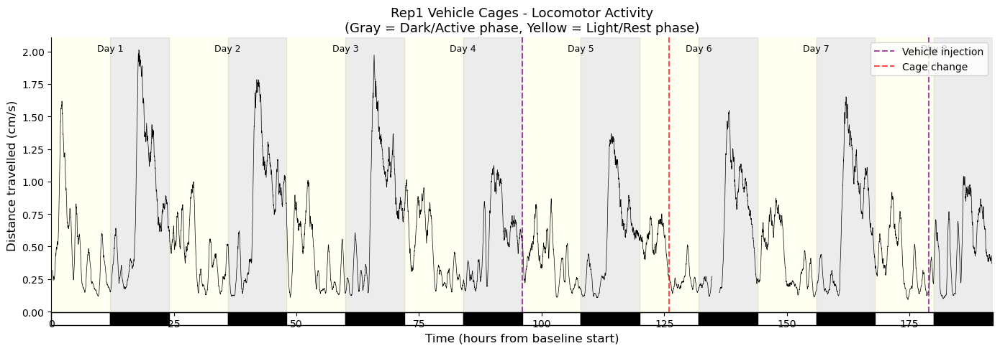

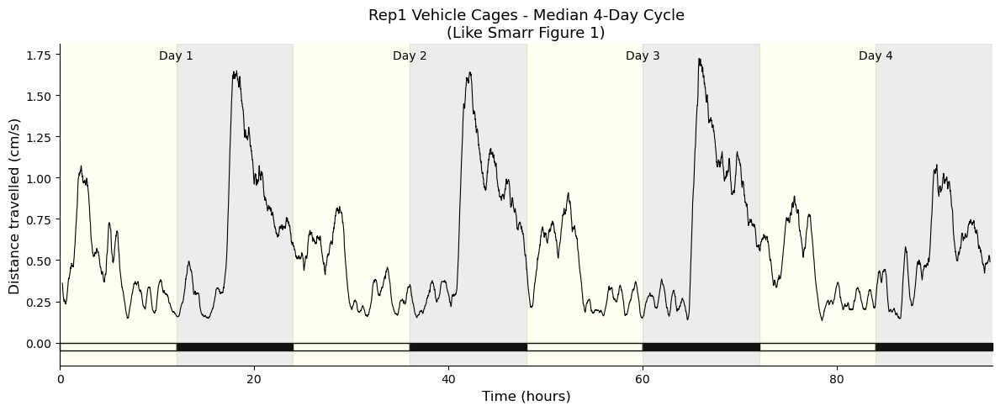


--- Day-by-day analysis (looking for estrus pattern) ---
Day    Dark Phase Mean    Late Dark (h18-22)
--------------------------------------------------
Day 1   0.82               1.32              
Day 2   0.80               1.20              
Day 3   0.79               1.27              
Day 4   0.57               0.81              
Day 5   0.58               0.96              
Day 6   0.66               1.08              
Day 7   0.69               1.12              
Day 8   0.52               0.79              


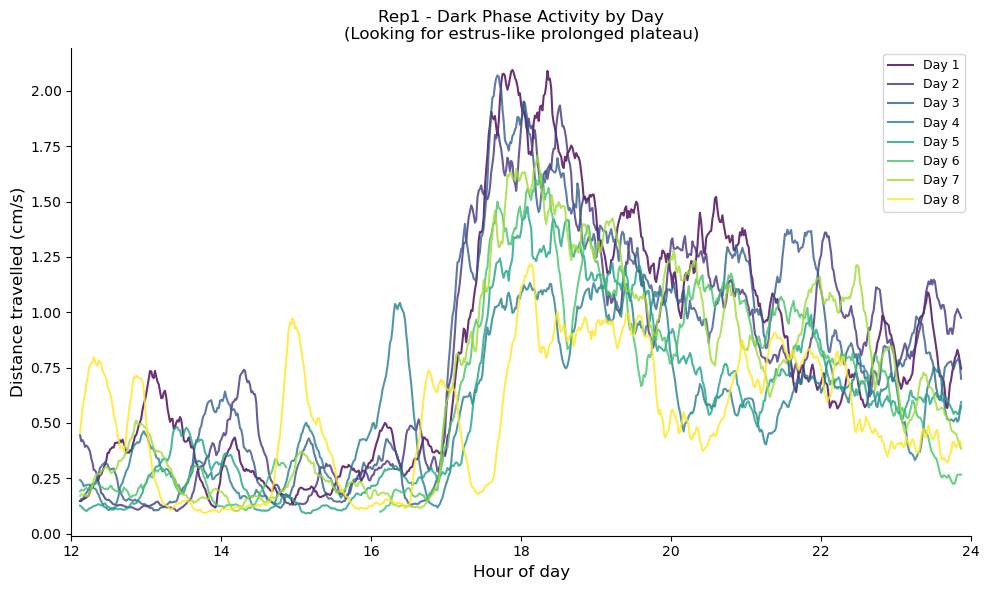


--- Testing different estrus assumptions ---
  Day 1 = estrus: E=1.14, non-E=1.04, ratio=1.09 
  Day 2 = estrus: E=1.14, non-E=1.04, ratio=1.09 
  Day 3 = estrus: E=1.20, non-E=1.02, ratio=1.17 
  Day 4 = estrus: E=0.80, non-E=1.16, ratio=0.69 

PROCESSING Rep2
Data points: 110,150
Animals: 10
Days covered: 8.0
Time series length: 11520 minutes = 8.0 days


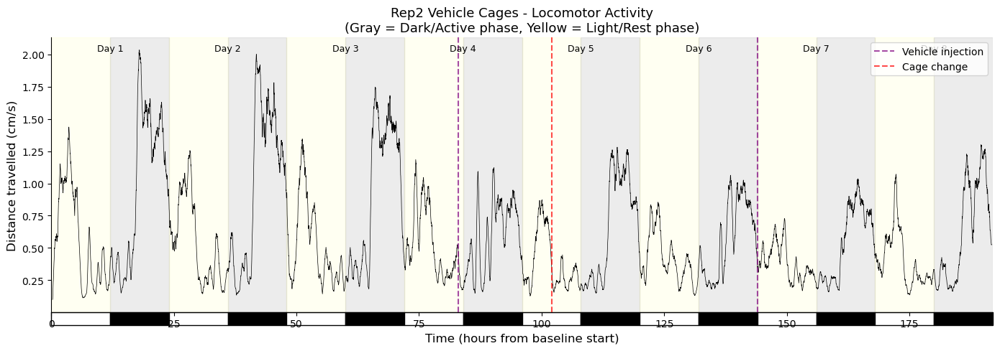

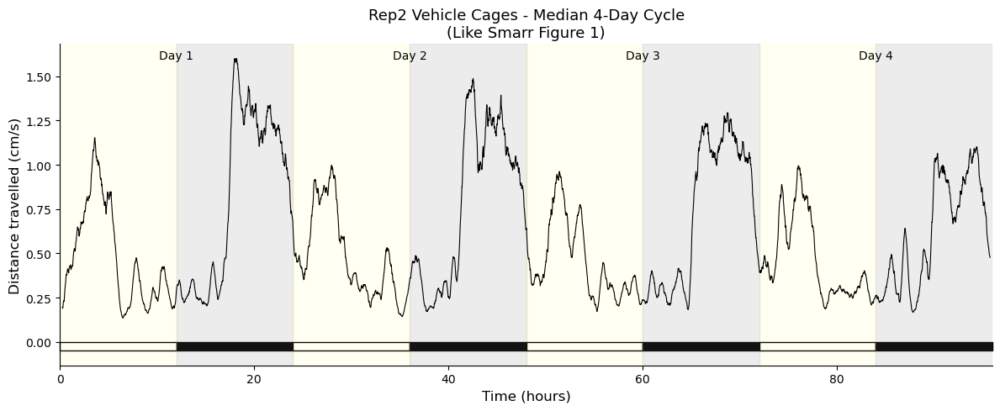


--- Day-by-day analysis (looking for estrus pattern) ---
Day    Dark Phase Mean    Late Dark (h18-22)
--------------------------------------------------
Day 1   0.97               1.50              
Day 2   0.99               1.58              
Day 3   0.92               1.46              
Day 4   0.60               0.80              
Day 5   0.66               1.13              
Day 6   0.58               0.87              
Day 7   0.54               0.84              
Day 8   0.63               1.00              


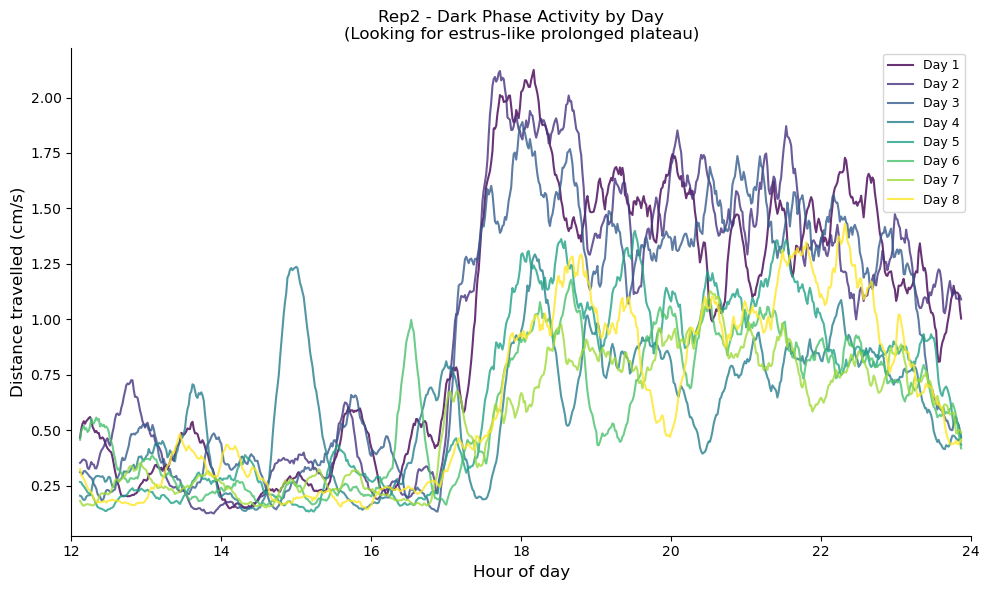


--- Testing different estrus assumptions ---
  Day 1 = estrus: E=1.31, non-E=1.09, ratio=1.20 ← Best fit
  Day 2 = estrus: E=1.23, non-E=1.12, ratio=1.10 
  Day 3 = estrus: E=1.15, non-E=1.15, ratio=1.00 
  Day 4 = estrus: E=0.90, non-E=1.23, ratio=0.73 


In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =============================================================================
# MORPH2REP DATA SETUP
# =============================================================================
# Reminder of light cycle:
# Morph2REP: Lights ON 6AM-6PM, Lights OFF 6PM-6AM
# So if analysis starts at 6AM: hours 0-12 = LIGHT, hours 12-24 = DARK (active)

# This is OPPOSITE to Smarr where t=0 = lights OFF

print("="*60)
print("MORPH2REP vs SMARR DATA STRUCTURE")
print("="*60)
print("SMARR:     t=0 = Lights OFF (dark/active phase)")
print("MORPH2REP: t=0 = 6AM = Lights ON (light/rest phase)")
print("           t=12h = 6PM = Lights OFF (dark/active phase)")
print()

# Vehicle cages configuration
VEHICLE_CAGES = {
    "Rep1": {
        "cages": [4918, 4922, 4923],
        "analysis_start": "2025-01-10 06:00:00",
        "analysis_end": "2025-01-22 06:00:00",
        "cage_change": "2025-01-15 12:00:00",
        "injection1": "2025-01-14 06:00:00",
        "injection2": "2025-01-17 17:00:00",
    },
    "Rep2": {
        "cages": [4928, 4929, 4934],
        "analysis_start": "2025-01-25 06:00:00",
        "analysis_end": "2025-02-04 06:00:00",
        "cage_change": "2025-01-29 12:00:00",
        "injection1": "2025-01-28 17:00:00",
        "injection2": "2025-01-31 06:00:00",
    },
}

# =============================================================================
# LOAD MORPH2REP DATA (assuming df_dist is already loaded from earlier)
# If not, we need to reload it
# =============================================================================

# Check if df_dist exists, if not reload
try:
    print(f"df_dist loaded: {len(df_dist):,} rows")
except NameError:
    print("Need to reload data - run the earlier data loading code first")

# =============================================================================
# PROCESS DATA FOR SMARR-STYLE PLOTS
# =============================================================================
minutes_per_day = 1440
minutes_per_cycle = 4 * minutes_per_day

for rep, cfg in VEHICLE_CAGES.items():
    print(f"\n{'='*60}")
    print(f"PROCESSING {rep}")
    print(f"{'='*60}")
    
    start_time = pd.to_datetime(cfg['analysis_start'])
    
    # Get data for this replicate
    rep_data = df_dist[df_dist['replicate'] == rep].copy()
    
    if len(rep_data) == 0:
        print(f"No data for {rep}")
        continue
    
    # Calculate minutes from start
    rep_data['minutes_from_start'] = (rep_data['time'] - start_time).dt.total_seconds() / 60
    
    # Filter to first 8 days (like Smarr's data)
    max_minutes = 8 * minutes_per_day
    rep_data = rep_data[rep_data['minutes_from_start'] < max_minutes].copy()
    rep_data = rep_data[rep_data['minutes_from_start'] >= 0].copy()
    
    print(f"Data points: {len(rep_data):,}")
    print(f"Animals: {rep_data['animal_id'].nunique()}")
    print(f"Days covered: {rep_data['minutes_from_start'].max() / minutes_per_day:.1f}")
    
    # =============================================================================
    # CREATE MINUTE-LEVEL POPULATION AVERAGE
    # =============================================================================
    # Round to minute bins
    rep_data['minute_bin'] = rep_data['minutes_from_start'].round().astype(int)
    
    # Average across all animals at each minute
    minute_avg = rep_data.groupby('minute_bin')['value'].agg(['mean', 'std', 'count']).reset_index()
    
    # Create complete time series (fill missing minutes with NaN)
    all_minutes = pd.DataFrame({'minute_bin': range(int(minute_avg['minute_bin'].max()) + 1)})
    minute_avg = all_minutes.merge(minute_avg, on='minute_bin', how='left')
    
    population_data = minute_avg['mean'].values
    
    print(f"Time series length: {len(population_data)} minutes = {len(population_data)/1440:.1f} days")
    
    # =============================================================================
    # FIGURE 1 STYLE: Full time series
    # =============================================================================
    fig, ax = plt.subplots(figsize=(14, 5))
    
    time_hours = np.arange(len(population_data)) / 60
    
    # Smooth for visualization
    pop_smooth = pd.Series(population_data).rolling(30, center=True).mean()
    
    ax.plot(time_hours, pop_smooth, color='black', linewidth=0.5)
    
    # Light/dark shading (MORPH2REP: 0-12h = light, 12-24h = dark)
    n_days = int(np.ceil(len(population_data) / minutes_per_day))
    for day in range(n_days):
        start_h = day * 24
        # Light phase (hours 0-12 of each day = 6AM-6PM)
        ax.axvspan(start_h, start_h + 12, alpha=0.05, color='yellow')
        # Dark phase (hours 12-24 = 6PM-6AM) - active period
        ax.axvspan(start_h + 12, start_h + 24, alpha=0.15, color='gray')
    
    # Light/dark bars at bottom
    bar_y = ax.get_ylim()[0] - 0.1
    bar_height = 0.1
    for day in range(n_days):
        start_h = day * 24
        # Light phase - WHITE bar
        ax.add_patch(plt.Rectangle((start_h, bar_y), 12, bar_height, 
                                    facecolor='white', edgecolor='black', clip_on=False))
        # Dark phase - BLACK bar
        ax.add_patch(plt.Rectangle((start_h + 12, bar_y), 12, bar_height, 
                                    facecolor='black', edgecolor='black', clip_on=False))
    
    # Mark events
    injection1_h = (pd.to_datetime(cfg['injection1']) - start_time).total_seconds() / 3600
    injection2_h = (pd.to_datetime(cfg['injection2']) - start_time).total_seconds() / 3600
    cage_change_h = (pd.to_datetime(cfg['cage_change']) - start_time).total_seconds() / 3600
    
    ax.axvline(x=injection1_h, color='purple', linestyle='--', alpha=0.7, label='Vehicle injection')
    ax.axvline(x=injection2_h, color='purple', linestyle='--', alpha=0.7)
    ax.axvline(x=cage_change_h, color='red', linestyle='--', alpha=0.7, label='Cage change')
    
    # Day labels
    for day in range(1, n_days + 1):
        ax.text((day - 0.5) * 24, ax.get_ylim()[1] * 0.95, f'Day {day}', 
               ha='center', fontsize=9)
    
    ax.set_xlim(0, len(population_data) / 60)
    ax.set_xlabel('Time (hours from baseline start)', fontsize=12)
    ax.set_ylabel('Distance travelled (cm/s)', fontsize=12)
    ax.set_title(f'{rep} Vehicle Cages - Locomotor Activity\n(Gray = Dark/Active phase, Yellow = Light/Rest phase)', fontsize=13)
    ax.legend(loc='upper right')
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig(f'morph2rep_{rep}_fig1_full.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # =============================================================================
    # FIGURE 1 STYLE: Median 4-day cycle (if we have enough data)
    # =============================================================================
    if len(population_data) >= 2 * minutes_per_cycle:
        # Two complete 4-day cycles
        cycle1 = population_data[0:minutes_per_cycle]
        cycle2 = population_data[minutes_per_cycle:2*minutes_per_cycle]
        
        # Handle NaNs
        cycle1 = np.nan_to_num(cycle1, nan=np.nanmean(cycle1))
        cycle2 = np.nan_to_num(cycle2, nan=np.nanmean(cycle2))
        
        median_cycle = np.median([cycle1, cycle2], axis=0)
        
        fig, ax = plt.subplots(figsize=(12, 5))
        
        time_hours_cycle = np.arange(minutes_per_cycle) / 60
        median_smooth = pd.Series(median_cycle).rolling(30, center=True).mean()
        
        ax.plot(time_hours_cycle, median_smooth, color='black', linewidth=0.8)
        
        # Light/dark bars
        for day in range(4):
            start_h = day * 24
            ax.add_patch(plt.Rectangle((start_h, -0.05), 12, 0.05, 
                                        facecolor='white', edgecolor='black', clip_on=False))
            ax.add_patch(plt.Rectangle((start_h + 12, -0.05), 12, 0.05, 
                                        facecolor='black', edgecolor='black', clip_on=False))
            # Shading
            ax.axvspan(start_h, start_h + 12, alpha=0.05, color='yellow')
            ax.axvspan(start_h + 12, start_h + 24, alpha=0.15, color='gray')
        
        # Day labels
        for day in range(1, 5):
            ax.text((day - 0.5) * 24, ax.get_ylim()[1] * 0.95 if ax.get_ylim()[1] > 0 else 0.8, 
                   f'Day {day}', ha='center', fontsize=10)
        
        ax.set_xlim(0, 96)
        ax.set_xlabel('Time (hours)', fontsize=12)
        ax.set_ylabel('Distance travelled (cm/s)', fontsize=12)
        ax.set_title(f'{rep} Vehicle Cages - Median 4-Day Cycle\n(Like Smarr Figure 1)', fontsize=13)
        
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        
        plt.tight_layout()
        plt.savefig(f'morph2rep_{rep}_fig1_4day.png', dpi=150, bbox_inches='tight')
        plt.show()
    
    # =============================================================================
    # DAY-BY-DAY COMPARISON: Look for estrus-like pattern
    # =============================================================================
    print(f"\n--- Day-by-day analysis (looking for estrus pattern) ---")
    
    # Extract dark phase (hours 12-24) for each day
    fig, ax = plt.subplots(figsize=(10, 6))
    
    colors = plt.cm.viridis(np.linspace(0, 1, 8))
    
    print(f"{'Day':<6} {'Dark Phase Mean':<18} {'Late Dark (h18-22)':<18}")
    print("-"*50)
    
    for day in range(1, min(9, n_days + 1)):
        day_start = (day - 1) * minutes_per_day
        day_end = day * minutes_per_day
        
        if day_end > len(population_data):
            break
        
        day_data = population_data[day_start:day_end]
        
        # Dark phase: hours 12-24 of each day (minutes 720-1440)
        dark_phase = day_data[720:1440]
        dark_smooth = pd.Series(dark_phase).rolling(15, center=True).mean()
        
        time_dark = np.arange(len(dark_phase)) / 60 + 12  # hours 12-24
        
        ax.plot(time_dark, dark_smooth, color=colors[day-1], linewidth=1.5, 
               label=f'Day {day}', alpha=0.8)
        
        # Stats
        dark_mean = np.nanmean(dark_phase)
        late_dark = np.nanmean(day_data[18*60:22*60]) if len(day_data) > 22*60 else np.nan
        print(f"Day {day:<3} {dark_mean:<18.2f} {late_dark:<18.2f}")
    
    ax.set_xlim(12, 24)
    ax.set_xlabel('Hour of day', fontsize=12)
    ax.set_ylabel('Distance travelled (cm/s)', fontsize=12)
    ax.set_title(f'{rep} - Dark Phase Activity by Day\n(Looking for estrus-like prolonged plateau)', fontsize=12)
    ax.legend(loc='upper right', fontsize=9)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig(f'morph2rep_{rep}_dark_phase_by_day.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # =============================================================================
    # TEST: Assuming 4-day estrus cycle, which day looks like estrus?
    # Check late dark phase activity (hours 18-22, analogous to Smarr's hours 6-10)
    # =============================================================================
    print(f"\n--- Testing different estrus assumptions ---")
    
    for assumed_estrus in [1, 2, 3, 4]:
        # Days with this estrus assumption
        estrus_days = [d for d in range(1, 9) if (d - assumed_estrus) % 4 == 0]
        non_estrus_days = [d for d in range(1, 9) if d not in estrus_days]
        
        estrus_activity = []
        non_estrus_activity = []
        
        for day in range(1, min(9, n_days + 1)):
            day_start = (day - 1) * minutes_per_day
            if day_start + minutes_per_day > len(population_data):
                break
            
            # Late dark phase: hours 18-22 (minutes 1080-1320)
            late_dark = population_data[day_start + 18*60 : day_start + 22*60]
            mean_val = np.nanmean(late_dark)
            
            if day in estrus_days:
                estrus_activity.append(mean_val)
            else:
                non_estrus_activity.append(mean_val)
        
        if estrus_activity and non_estrus_activity:
            ratio = np.mean(estrus_activity) / np.mean(non_estrus_activity)
            marker = "← Best fit" if ratio > 1.2 else ""
            print(f"  Day {assumed_estrus} = estrus: E={np.mean(estrus_activity):.2f}, "
                  f"non-E={np.mean(non_estrus_activity):.2f}, ratio={ratio:.2f} {marker}")

MORPH2REP vs SMARR TIMING

MORPH2REP Light Cycle:
  Lights ON:  6:00 AM - 6:00 PM (12h light/rest)
  Lights OFF: 6:00 PM - 6:00 AM (12h dark/active)

Analysis starts at 6:00 AM, so:
  Hours 0-12 (6AM-6PM) = LIGHT phase (rest)
  Hours 12-24 (6PM-6AM) = DARK phase (active)

SMARR:
  t=0 = Lights OFF (dark/active phase FIRST)

To match Smarr, we need to SHIFT by 12 hours
so that t=0 aligns with lights OFF (6PM)

PROCESSING Rep1
Original start: 2025-01-10 06:00:00 (6AM, lights ON)
Shifted start:  2025-01-10 18:00:00 (6PM, lights OFF)
Data points: 109,331
Animals: 10
Days covered: 8.0
Time series length: 11520 minutes = 8.0 days

--- Verification: Activity by phase (after shift) ---
Mean activity during DARK (hours 0-12):  0.679
Mean activity during LIGHT (hours 12-24): 0.405
Ratio (dark/light): 1.7x
✓ CORRECT: Mice more active during dark phase


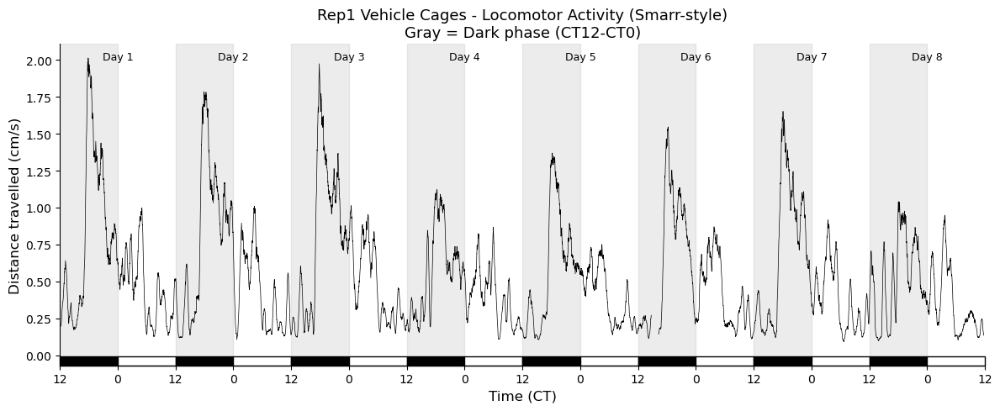

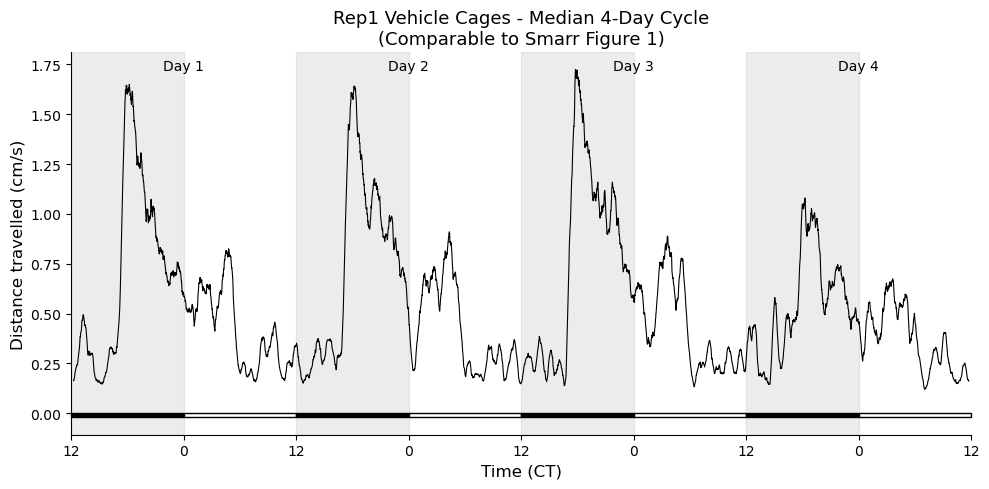


--- Day-by-day: Late dark phase activity (hours 6-10) ---
(Analogous to Smarr's plateau window)
Day    Late Dark (h6-10)    Full Dark (h0-12)   
--------------------------------------------------
Day 1   1.139                0.699               
Day 2   1.138                0.725               
Day 3   1.197                0.739               
Day 4   0.796                0.547               

Highest late dark activity: Day 3
(If estrus pattern present, this day may be estrus)


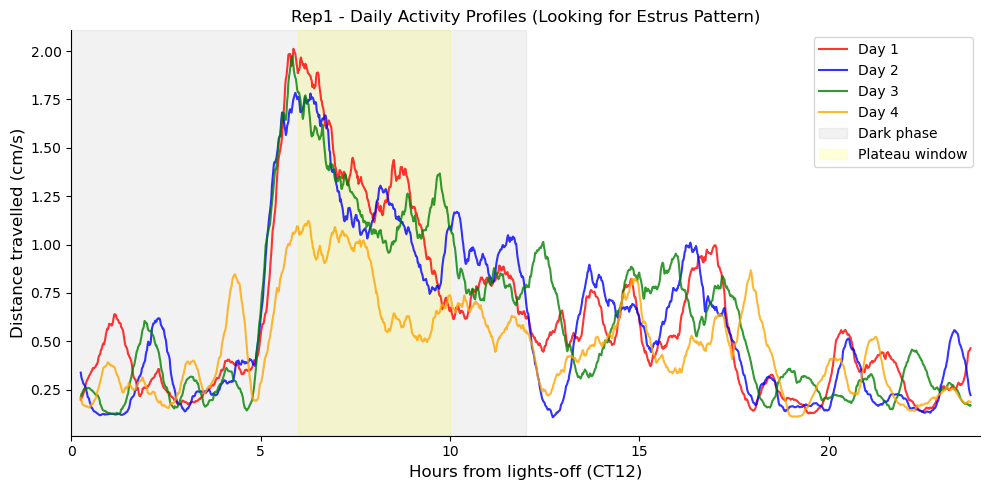


PROCESSING Rep2
Original start: 2025-01-25 06:00:00 (6AM, lights ON)
Shifted start:  2025-01-25 18:00:00 (6PM, lights OFF)
Data points: 110,073
Animals: 10
Days covered: 8.0
Time series length: 11520 minutes = 8.0 days

--- Verification: Activity by phase (after shift) ---
Mean activity during DARK (hours 0-12):  0.736
Mean activity during LIGHT (hours 12-24): 0.449
Ratio (dark/light): 1.6x
✓ CORRECT: Mice more active during dark phase


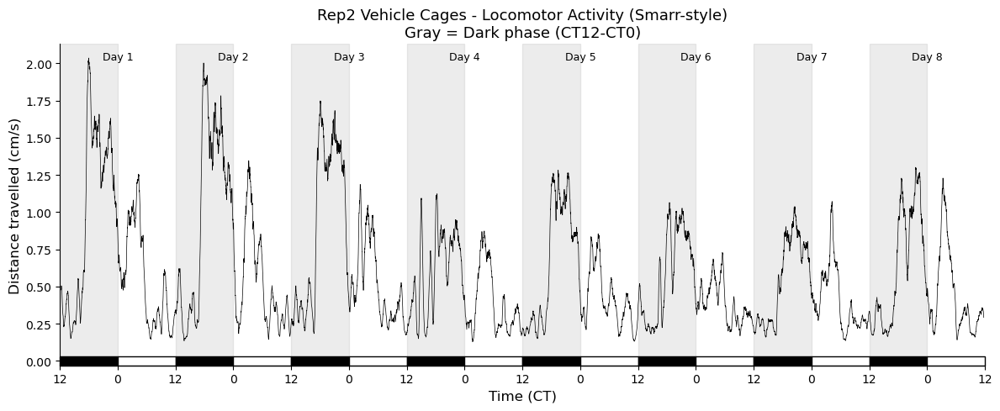

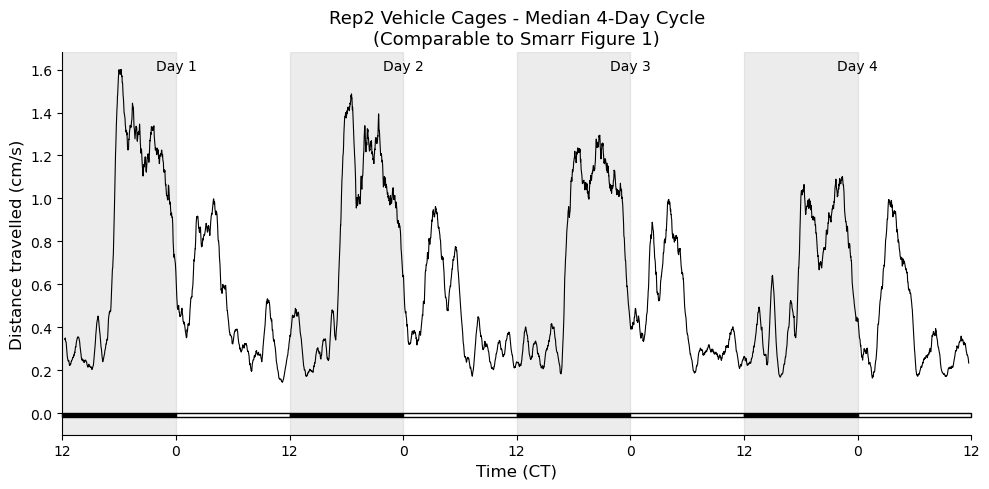


--- Day-by-day: Late dark phase activity (hours 6-10) ---
(Analogous to Smarr's plateau window)
Day    Late Dark (h6-10)    Full Dark (h0-12)   
--------------------------------------------------
Day 1   1.315                0.814               
Day 2   1.228                0.784               
Day 3   1.148                0.730               
Day 4   0.901                0.616               

Highest late dark activity: Day 1
(If estrus pattern present, this day may be estrus)


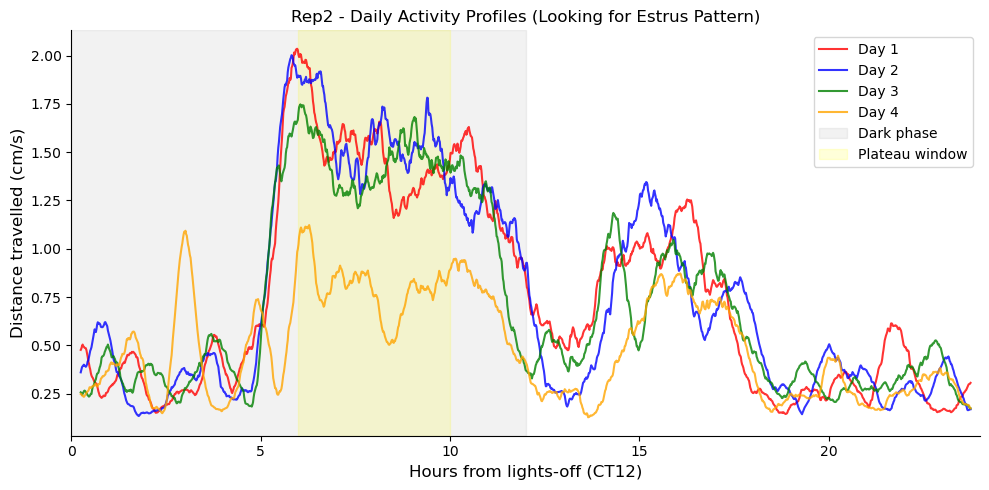


SUMMARY
Plots now aligned with Smarr's convention:
  - t=0 (CT12) = Lights OFF (6PM)
  - Hours 0-12 = Dark phase (active)
  - Hours 12-24 = Light phase (rest)
  - Gray shading = Dark phase
  - Black bars = Dark, White bars = Light


In [57]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =============================================================================
# MORPH2REP TIMING STRUCTURE
# =============================================================================
print("="*60)
print("MORPH2REP vs SMARR TIMING")
print("="*60)
print()
print("MORPH2REP Light Cycle:")
print("  Lights ON:  6:00 AM - 6:00 PM (12h light/rest)")
print("  Lights OFF: 6:00 PM - 6:00 AM (12h dark/active)")
print()
print("Analysis starts at 6:00 AM, so:")
print("  Hours 0-12 (6AM-6PM) = LIGHT phase (rest)")
print("  Hours 12-24 (6PM-6AM) = DARK phase (active)")
print()
print("SMARR:")
print("  t=0 = Lights OFF (dark/active phase FIRST)")
print()
print("To match Smarr, we need to SHIFT by 12 hours")
print("so that t=0 aligns with lights OFF (6PM)")
print("="*60)

# =============================================================================
# VEHICLE CAGES CONFIGURATION
# =============================================================================
VEHICLE_CAGES = {
    "Rep1": {
        "cages": [4918, 4922, 4923],
        "analysis_start": "2025-01-10 06:00:00",  # 6AM - but we'll shift to 6PM
        "baseline_days": 4,  # Days before first injection
        "injection1": "2025-01-14 06:00:00",
        "injection2": "2025-01-17 17:00:00",
        "cage_change": "2025-01-15 12:00:00",
    },
    "Rep2": {
        "cages": [4928, 4929, 4934],
        "analysis_start": "2025-01-25 06:00:00",
        "baseline_days": 3,
        "injection1": "2025-01-28 17:00:00",
        "injection2": "2025-01-31 06:00:00",
        "cage_change": "2025-01-29 12:00:00",
    },
}

# =============================================================================
# PROCESS DATA - SHIFT TO ALIGN WITH SMARR (t=0 = lights OFF)
# =============================================================================
minutes_per_day = 1440
minutes_per_cycle = 4 * minutes_per_day

for rep, cfg in VEHICLE_CAGES.items():
    print(f"\n{'='*60}")
    print(f"PROCESSING {rep}")
    print(f"{'='*60}")
    
    # Original start time (6AM)
    original_start = pd.to_datetime(cfg['analysis_start'])
    
    # Shifted start time (6PM) - 12 hours later, so t=0 = lights OFF
    shifted_start = original_start + pd.Timedelta(hours=12)
    
    print(f"Original start: {original_start} (6AM, lights ON)")
    print(f"Shifted start:  {shifted_start} (6PM, lights OFF)")
    
    # Get data for this replicate
    rep_data = df_dist[df_dist['replicate'] == rep].copy()
    
    if len(rep_data) == 0:
        print(f"No data for {rep}")
        continue
    
    # Calculate minutes from SHIFTED start (so t=0 = 6PM = lights OFF)
    rep_data['minutes_from_start'] = (rep_data['time'] - shifted_start).dt.total_seconds() / 60
    
    # Filter to valid range (after shifted start)
    rep_data = rep_data[rep_data['minutes_from_start'] >= 0].copy()
    
    # Limit to 8 days
    max_minutes = 8 * minutes_per_day
    rep_data = rep_data[rep_data['minutes_from_start'] < max_minutes].copy()
    
    print(f"Data points: {len(rep_data):,}")
    print(f"Animals: {rep_data['animal_id'].nunique()}")
    print(f"Days covered: {rep_data['minutes_from_start'].max() / minutes_per_day:.1f}")
    
    # =============================================================================
    # CREATE MINUTE-LEVEL POPULATION AVERAGE
    # =============================================================================
    rep_data['minute_bin'] = rep_data['minutes_from_start'].round().astype(int)
    minute_avg = rep_data.groupby('minute_bin')['value'].agg(['mean', 'std', 'count']).reset_index()
    
    # Fill missing minutes
    all_minutes = pd.DataFrame({'minute_bin': range(int(minute_avg['minute_bin'].max()) + 1)})
    minute_avg = all_minutes.merge(minute_avg, on='minute_bin', how='left')
    
    population_data = minute_avg['mean'].values
    
    print(f"Time series length: {len(population_data)} minutes = {len(population_data)/1440:.1f} days")
    
    # =============================================================================
    # VERIFY: Activity should be HIGH in hours 0-12 (dark) and LOW in hours 12-24 (light)
    # After shifting, this should match Smarr's pattern
    # =============================================================================
    print(f"\n--- Verification: Activity by phase (after shift) ---")
    
    dark_activity = []
    light_activity = []
    
    n_days = min(8, int(len(population_data) / minutes_per_day))
    for day in range(n_days):
        day_start = day * minutes_per_day
        # After shift: Dark phase = hours 0-12, Light phase = hours 12-24
        dark_vals = population_data[day_start:day_start+720]
        light_vals = population_data[day_start+720:day_start+1440]
        dark_activity.append(np.nanmean(dark_vals))
        light_activity.append(np.nanmean(light_vals))
    
    print(f"Mean activity during DARK (hours 0-12):  {np.nanmean(dark_activity):.3f}")
    print(f"Mean activity during LIGHT (hours 12-24): {np.nanmean(light_activity):.3f}")
    ratio = np.nanmean(dark_activity) / np.nanmean(light_activity) if np.nanmean(light_activity) > 0 else np.inf
    print(f"Ratio (dark/light): {ratio:.1f}x")
    
    if ratio > 1.5:
        print("✓ CORRECT: Mice more active during dark phase")
    else:
        print("⚠ WARNING: Dark/light ratio lower than expected")
    
    # =============================================================================
    # FIGURE 1 STYLE: Smarr-style plot (now aligned)
    # =============================================================================
    fig, ax = plt.subplots(figsize=(12, 5))
    
    time_hours = np.arange(len(population_data)) / 60
    pop_smooth = pd.Series(population_data).rolling(30, center=True).mean()
    
    ax.plot(time_hours, pop_smooth, color='black', linewidth=0.5)
    
    # Light/dark shading (NOW CORRECT: 0-12h = dark, 12-24h = light)
    n_plot_days = int(np.ceil(len(population_data) / minutes_per_day))
    for day in range(n_plot_days):
        start_h = day * 24
        # Dark phase (hours 0-12 of each day) - GRAY
        ax.axvspan(start_h, start_h + 12, alpha=0.15, color='gray')
        # Light phase (hours 12-24) - no shading (white)
    
    # Light/dark bars at bottom (like Smarr)
    y_min = ax.get_ylim()[0]
    bar_height = (ax.get_ylim()[1] - ax.get_ylim()[0]) * 0.03
    bar_y = y_min - bar_height
    
    for day in range(n_plot_days):
        start_h = day * 24
        # Dark phase - BLACK bar
        ax.add_patch(plt.Rectangle((start_h, bar_y), 12, bar_height, 
                                    facecolor='black', edgecolor='black', clip_on=False))
        # Light phase - WHITE bar
        ax.add_patch(plt.Rectangle((start_h + 12, bar_y), 12, bar_height, 
                                    facecolor='white', edgecolor='black', clip_on=False))
    
    # X-axis in CT time (like Smarr: CT12 = lights off = our t=0)
    ax.set_xticks(np.arange(0, len(population_data)/60 + 1, 12))
    ct_labels = []
    for i in range(int(len(population_data)/60/12) + 1):
        ct_labels.append('12' if i % 2 == 0 else '0')
    ax.set_xticklabels(ct_labels[:len(ax.get_xticks())])
    
    # Day labels
    for day in range(1, n_plot_days + 1):
        x_pos = (day - 0.5) * 24
        if x_pos < len(population_data) / 60:
            ax.text(x_pos, ax.get_ylim()[1] * 0.95, f'Day {day}', ha='center', fontsize=9)
    
    ax.set_xlim(0, len(population_data) / 60)
    ax.set_ylim(bar_y, None)
    ax.set_xlabel('Time (CT)', fontsize=12)
    ax.set_ylabel('Distance travelled (cm/s)', fontsize=12)
    ax.set_title(f'{rep} Vehicle Cages - Locomotor Activity (Smarr-style)\nGray = Dark phase (CT12-CT0)', fontsize=13)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig(f'morph2rep_{rep}_fig1_smarr_style.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # =============================================================================
    # MEDIAN 4-DAY CYCLE (if enough data)
    # =============================================================================
    if len(population_data) >= 2 * minutes_per_cycle:
        cycle1 = population_data[0:minutes_per_cycle]
        cycle2 = population_data[minutes_per_cycle:2*minutes_per_cycle]
        
        cycle1 = np.nan_to_num(cycle1, nan=np.nanmean(cycle1))
        cycle2 = np.nan_to_num(cycle2, nan=np.nanmean(cycle2))
        
        median_cycle = np.median([cycle1, cycle2], axis=0)
        
        fig, ax = plt.subplots(figsize=(10, 5))
        
        time_hours_cycle = np.arange(minutes_per_cycle) / 60
        median_smooth = pd.Series(median_cycle).rolling(30, center=True).mean()
        
        ax.plot(time_hours_cycle, median_smooth, color='black', linewidth=0.8)
        
        # Light/dark bars and shading
        for day in range(4):
            start_h = day * 24
            ax.axvspan(start_h, start_h + 12, alpha=0.15, color='gray')
            ax.add_patch(plt.Rectangle((start_h, -0.02), 12, 0.02, 
                                        facecolor='black', edgecolor='black', clip_on=False))
            ax.add_patch(plt.Rectangle((start_h + 12, -0.02), 12, 0.02, 
                                        facecolor='white', edgecolor='black', clip_on=False))
        
        # CT time labels
        ax.set_xticks(np.arange(0, 97, 12))
        ax.set_xticklabels(['12', '0', '12', '0', '12', '0', '12', '0', '12'])
        
        # Day labels
        for day in range(1, 5):
            ax.text((day - 0.5) * 24, ax.get_ylim()[1] * 0.95 if ax.get_ylim()[1] > 0 else median_smooth.max() * 0.95, 
                   f'Day {day}', ha='center', fontsize=10)
        
        ax.set_xlim(0, 96)
        ax.set_xlabel('Time (CT)', fontsize=12)
        ax.set_ylabel('Distance travelled (cm/s)', fontsize=12)
        ax.set_title(f'{rep} Vehicle Cages - Median 4-Day Cycle\n(Comparable to Smarr Figure 1)', fontsize=13)
        
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        
        plt.tight_layout()
        plt.savefig(f'morph2rep_{rep}_fig1_4day_cycle.png', dpi=150, bbox_inches='tight')
        plt.show()
        
        # =============================================================================
        # DAY-BY-DAY COMPARISON: Looking for estrus pattern
        # =============================================================================
        print(f"\n--- Day-by-day: Late dark phase activity (hours 6-10) ---")
        print(f"(Analogous to Smarr's plateau window)")
        print(f"{'Day':<6} {'Late Dark (h6-10)':<20} {'Full Dark (h0-12)':<20}")
        print("-"*50)
        
        late_dark_by_day = []
        for day in range(1, 5):
            day_start = (day - 1) * minutes_per_day
            day_data = median_cycle[day_start:day_start + minutes_per_day]
            
            # Late dark phase: hours 6-10 (like Smarr)
            late_dark = np.nanmean(day_data[6*60:10*60])
            full_dark = np.nanmean(day_data[0:12*60])
            
            late_dark_by_day.append(late_dark)
            print(f"Day {day:<3} {late_dark:<20.3f} {full_dark:<20.3f}")
        
        # Find which day has highest late dark activity (potential estrus)
        best_day = np.argmax(late_dark_by_day) + 1
        print(f"\nHighest late dark activity: Day {best_day}")
        print("(If estrus pattern present, this day may be estrus)")
    
    # =============================================================================
    # OVERLAY: Compare days directly
    # =============================================================================
    fig, ax = plt.subplots(figsize=(10, 5))
    
    time_1day = np.arange(minutes_per_day) / 60
    colors = ['red', 'blue', 'green', 'orange']
    
    for day in range(1, min(5, n_plot_days + 1)):
        day_start = (day - 1) * minutes_per_day
        if day_start + minutes_per_day <= len(population_data):
            day_data = population_data[day_start:day_start + minutes_per_day]
            day_smooth = pd.Series(day_data).rolling(30, center=True).mean()
            ax.plot(time_1day, day_smooth, color=colors[day-1], linewidth=1.5, 
                   label=f'Day {day}', alpha=0.8)
    
    ax.axvspan(0, 12, alpha=0.1, color='gray', label='Dark phase')
    ax.axvspan(6, 10, alpha=0.15, color='yellow', label='Plateau window')
    
    ax.set_xlim(0, 24)
    ax.set_xlabel('Hours from lights-off (CT12)', fontsize=12)
    ax.set_ylabel('Distance travelled (cm/s)', fontsize=12)
    ax.set_title(f'{rep} - Daily Activity Profiles (Looking for Estrus Pattern)', fontsize=12)
    ax.legend(loc='upper right')
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig(f'morph2rep_{rep}_day_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

print("\n" + "="*60)
print("SUMMARY")
print("="*60)
print("Plots now aligned with Smarr's convention:")
print("  - t=0 (CT12) = Lights OFF (6PM)")
print("  - Hours 0-12 = Dark phase (active)")
print("  - Hours 12-24 = Light phase (rest)")
print("  - Gray shading = Dark phase")
print("  - Black bars = Dark, White bars = Light")

INDIVIDUAL ANIMAL ANALYSIS

Lee-Boot Effect: In all-female groups, estrous cycles often
become irregular or suppressed. Let's check individual variation.


Rep1 - INDIVIDUAL ANIMALS
Cages: [4918, 4922, 4923]
Animals: 10

--- Late Dark Phase Activity (hours 6-10) by Animal ---
Animal       Cage     Day1     Day2     Day3     Day4     Day5     Day6     Day7     Peak Day
----------------------------------------------------------------------------------------------------
0            4918     0.11     0.13     0.09     0.07     0.07     0.10     0.11     Day 2
9257         4918     1.85     1.68     1.57     0.71     1.15     1.25     1.47     Day 1
9258         4918     3.11     2.62     2.68     0.99     1.68     2.13     2.51     Day 1
9259         4918     1.33     1.18     1.21     0.82     0.92     1.01     0.87     Day 1
9260         4922     1.20     0.90     1.11     0.87     0.67     0.94     0.87     Day 1
9261         4922     1.44     1.52     1.51     1.05     1.52     1.42  

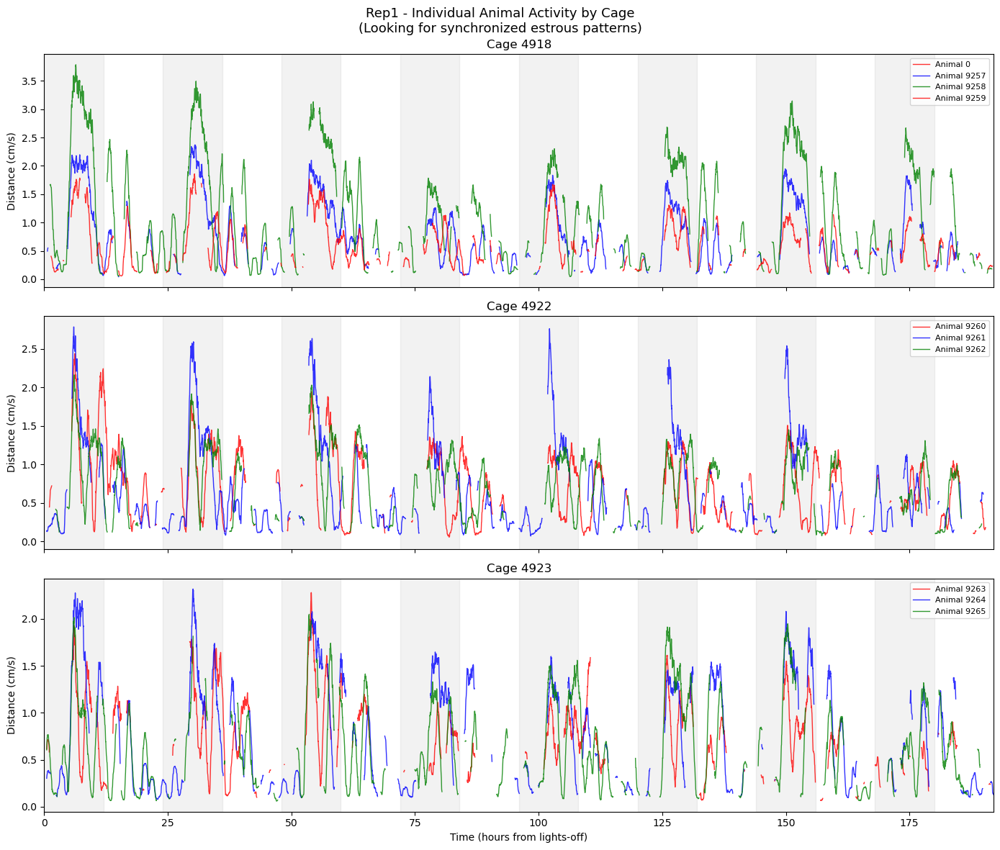


--- Testing 4-Day Cycle Hypothesis ---
If Day 1 = estrus, Day 5 should also show elevated activity

Animal 0: Day1=0.11, Day5=0.07, Days2-4 avg=0.10 → ~ Only Day 1 elevated
Animal 9257: Day1=1.85, Day5=1.15, Days2-4 avg=1.32 → ~ Only Day 1 elevated
Animal 9258: Day1=3.11, Day5=1.68, Days2-4 avg=2.10 → ~ Only Day 1 elevated
Animal 9259: Day1=1.33, Day5=0.92, Days2-4 avg=1.07 → ~ Only Day 1 elevated
Animal 9260: Day1=1.20, Day5=0.67, Days2-4 avg=0.96 → ~ Only Day 1 elevated
Animal 9261: Day1=1.44, Day5=1.52, Days2-4 avg=1.36 → ~ Only Day 5 elevated
Animal 9262: Day1=1.15, Day5=0.93, Days2-4 avg=0.93 → ~ Only Day 1 elevated
Animal 9263: Day1=1.00, Day5=0.81, Days2-4 avg=0.83 → ~ Only Day 1 elevated
Animal 9264: Day1=1.39, Day5=1.08, Days2-4 avg=1.40 → ✗ No clear pattern
Animal 9265: Day1=0.88, Day5=0.88, Days2-4 avg=1.09 → ✗ No clear pattern

Rep2 - INDIVIDUAL ANIMALS
Cages: [4928, 4929, 4934]
Animals: 10

--- Late Dark Phase Activity (hours 6-10) by Animal ---
Animal       Cage     Day1

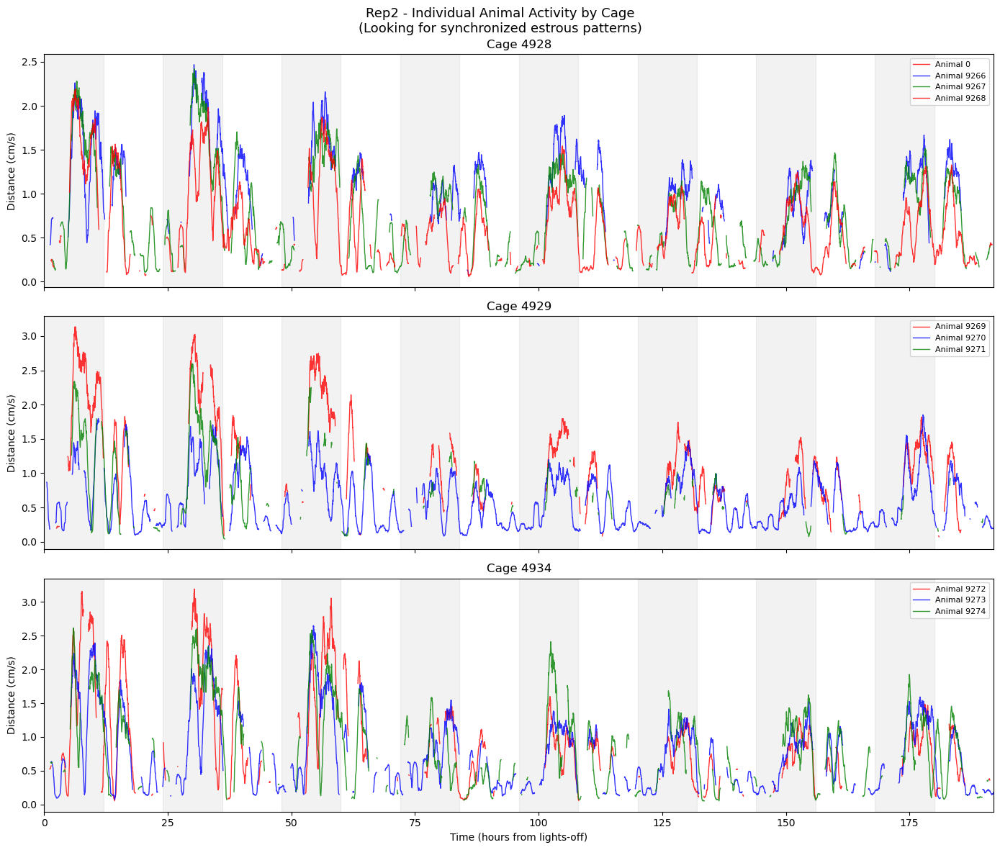


--- Testing 4-Day Cycle Hypothesis ---
If Day 1 = estrus, Day 5 should also show elevated activity

Animal 0: Day1=0.12, Day5=0.12, Days2-4 avg=0.09 → ✓ Day 1 & 5 both elevated (supports 4-day cycle)
Animal 9266: Day1=1.58, Day5=1.52, Days2-4 avg=1.52 → ✗ No clear pattern
Animal 9267: Day1=1.80, Day5=1.27, Days2-4 avg=1.47 → ~ Only Day 1 elevated
Animal 9268: Day1=1.60, Day5=1.11, Days2-4 avg=1.14 → ~ Only Day 1 elevated
Animal 9269: Day1=2.46, Day5=1.50, Days2-4 avg=1.93 → ~ Only Day 1 elevated
Animal 9270: Day1=0.80, Day5=0.95, Days2-4 avg=0.85 → ~ Only Day 5 elevated
Animal 9271: Day1=1.38, Day5=1.31, Days2-4 avg=1.36 → ✗ No clear pattern
Animal 9272: Day1=2.48, Day5=0.98, Days2-4 avg=1.76 → ~ Only Day 1 elevated
Animal 9273: Day1=1.53, Day5=1.16, Days2-4 avg=1.53 → ✗ No clear pattern
Animal 9274: Day1=1.90, Day5=1.60, Days2-4 avg=1.53 → ~ Only Day 1 elevated

SUMMARY: ESTROUS SYNCHRONIZATION

Lee-Boot Effect in all-female groups typically causes:
  - Extended/irregular estrous cyc

In [58]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =============================================================================
# INDIVIDUAL ANIMAL ANALYSIS
# =============================================================================
print("="*60)
print("INDIVIDUAL ANIMAL ANALYSIS")
print("="*60)
print()
print("Lee-Boot Effect: In all-female groups, estrous cycles often")
print("become irregular or suppressed. Let's check individual variation.")
print()

# Shifted start time (6PM = lights off)
for rep, cfg in VEHICLE_CAGES.items():
    print(f"\n{'='*60}")
    print(f"{rep} - INDIVIDUAL ANIMALS")
    print(f"{'='*60}")
    
    original_start = pd.to_datetime(cfg['analysis_start'])
    shifted_start = original_start + pd.Timedelta(hours=12)  # 6PM
    
    rep_data = df_dist[df_dist['replicate'] == rep].copy()
    
    if len(rep_data) == 0:
        print(f"No data for {rep}")
        continue
    
    rep_data['minutes_from_start'] = (rep_data['time'] - shifted_start).dt.total_seconds() / 60
    rep_data = rep_data[rep_data['minutes_from_start'] >= 0].copy()
    
    # Get unique animals and cages
    animals = rep_data['animal_id'].unique()
    cages = rep_data['cage_id'].unique()
    
    print(f"Cages: {sorted(cages)}")
    print(f"Animals: {len(animals)}")
    
    # =============================================================================
    # ANALYZE EACH ANIMAL: Find their "highest activity" days
    # =============================================================================
    print(f"\n--- Late Dark Phase Activity (hours 6-10) by Animal ---")
    print(f"{'Animal':<12} {'Cage':<8} {'Day1':<8} {'Day2':<8} {'Day3':<8} {'Day4':<8} {'Day5':<8} {'Day6':<8} {'Day7':<8} {'Peak Day'}")
    print("-"*100)
    
    animal_results = []
    
    for animal_id in sorted(animals):
        animal_data = rep_data[rep_data['animal_id'] == animal_id].copy()
        cage_id = animal_data['cage_id'].iloc[0]
        
        # Create minute-level time series for this animal
        animal_data['minute_bin'] = animal_data['minutes_from_start'].round().astype(int)
        minute_avg = animal_data.groupby('minute_bin')['value'].mean()
        
        # Fill to complete series
        max_min = int(minute_avg.index.max()) if len(minute_avg) > 0 else 0
        full_series = pd.Series(index=range(max_min + 1), dtype=float)
        full_series.update(minute_avg)
        animal_ts = full_series.values
        
        # Calculate late dark phase (hours 6-10) for each day
        late_dark_by_day = []
        minutes_per_day = 1440
        n_days = min(8, len(animal_ts) // minutes_per_day)
        
        for day in range(n_days):
            day_start = day * minutes_per_day
            # Late dark phase: hours 6-10 (minutes 360-600)
            late_dark_start = day_start + 6*60
            late_dark_end = day_start + 10*60
            
            if late_dark_end <= len(animal_ts):
                late_dark = np.nanmean(animal_ts[late_dark_start:late_dark_end])
            else:
                late_dark = np.nan
            late_dark_by_day.append(late_dark)
        
        # Find peak day
        valid_days = [(i+1, v) for i, v in enumerate(late_dark_by_day) if not np.isnan(v)]
        if valid_days:
            peak_day = max(valid_days, key=lambda x: x[1])[0]
        else:
            peak_day = None
        
        animal_results.append({
            'animal_id': animal_id,
            'cage_id': cage_id,
            'late_dark': late_dark_by_day,
            'peak_day': peak_day
        })
        
        # Print row
        day_vals = [f"{v:.2f}" if not np.isnan(v) else "N/A" for v in late_dark_by_day[:7]]
        while len(day_vals) < 7:
            day_vals.append("N/A")
        print(f"{animal_id:<12} {cage_id:<8} {day_vals[0]:<8} {day_vals[1]:<8} {day_vals[2]:<8} {day_vals[3]:<8} {day_vals[4]:<8} {day_vals[5]:<8} {day_vals[6]:<8} Day {peak_day}")
    
    # =============================================================================
    # CHECK CAGE-LEVEL SYNCHRONIZATION
    # =============================================================================
    print(f"\n--- Cage-Level Synchronization Check ---")
    print("Do animals in the same cage peak on the same day?")
    print()
    
    for cage_id in sorted(cages):
        cage_animals = [r for r in animal_results if r['cage_id'] == cage_id]
        peak_days = [r['peak_day'] for r in cage_animals if r['peak_day'] is not None]
        
        if len(peak_days) >= 2:
            if len(set(peak_days)) == 1:
                sync_status = "✓ SYNCED"
            elif max(peak_days) - min(peak_days) <= 1:
                sync_status = "~ CLOSE"
            else:
                sync_status = "✗ NOT SYNCED"
        else:
            sync_status = "? INSUFFICIENT DATA"
        
        animal_ids = [r['animal_id'] for r in cage_animals]
        print(f"Cage {cage_id}: Animals {animal_ids} peak on days {peak_days} → {sync_status}")
    
    # =============================================================================
    # PLOT: Individual animals by cage
    # =============================================================================
    fig, axes = plt.subplots(len(cages), 1, figsize=(14, 4*len(cages)), sharex=True)
    if len(cages) == 1:
        axes = [axes]
    
    colors = ['red', 'blue', 'green']
    
    for idx, cage_id in enumerate(sorted(cages)):
        ax = axes[idx]
        cage_animals = [r for r in animal_results if r['cage_id'] == cage_id]
        
        for i, animal_result in enumerate(cage_animals):
            animal_id = animal_result['animal_id']
            animal_data = rep_data[rep_data['animal_id'] == animal_id].copy()
            
            # Create time series
            animal_data['minute_bin'] = animal_data['minutes_from_start'].round().astype(int)
            minute_avg = animal_data.groupby('minute_bin')['value'].mean()
            
            max_min = int(minute_avg.index.max()) if len(minute_avg) > 0 else 0
            full_series = pd.Series(index=range(max_min + 1), dtype=float)
            full_series.update(minute_avg)
            animal_ts = full_series.values
            
            # Smooth and plot
            time_hours = np.arange(len(animal_ts)) / 60
            animal_smooth = pd.Series(animal_ts).rolling(60, center=True).mean()
            
            ax.plot(time_hours, animal_smooth, color=colors[i % 3], 
                   linewidth=1, alpha=0.8, label=f'Animal {animal_id}')
        
        # Light/dark shading
        n_days = int(np.ceil(len(animal_ts) / 1440))
        for day in range(n_days):
            start_h = day * 24
            ax.axvspan(start_h, start_h + 12, alpha=0.1, color='gray')
        
        ax.set_ylabel('Distance (cm/s)')
        ax.set_title(f'Cage {cage_id}')
        ax.legend(loc='upper right', fontsize=8)
        ax.set_xlim(0, min(8*24, len(animal_ts)/60))
    
    axes[-1].set_xlabel('Time (hours from lights-off)')
    
    plt.suptitle(f'{rep} - Individual Animal Activity by Cage\n(Looking for synchronized estrous patterns)', fontsize=13)
    plt.tight_layout()
    plt.savefig(f'morph2rep_{rep}_individual_animals.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # =============================================================================
    # TEST: If Day 1 = estrus, is Day 5 also elevated?
    # =============================================================================
    print(f"\n--- Testing 4-Day Cycle Hypothesis ---")
    print("If Day 1 = estrus, Day 5 should also show elevated activity")
    print()
    
    for animal_result in animal_results:
        animal_id = animal_result['animal_id']
        late_dark = animal_result['late_dark']
        
        if len(late_dark) >= 5:
            day1 = late_dark[0]
            day5 = late_dark[4]
            days_234 = np.nanmean([late_dark[1], late_dark[2], late_dark[3]])
            
            # Is Day 1 and Day 5 both higher than Days 2-4?
            day1_high = day1 > days_234 * 1.1 if not np.isnan(day1) and not np.isnan(days_234) else False
            day5_high = day5 > days_234 * 1.1 if not np.isnan(day5) and not np.isnan(days_234) else False
            
            pattern = ""
            if day1_high and day5_high:
                pattern = "✓ Day 1 & 5 both elevated (supports 4-day cycle)"
            elif day1_high:
                pattern = "~ Only Day 1 elevated"
            elif day5_high:
                pattern = "~ Only Day 5 elevated"
            else:
                pattern = "✗ No clear pattern"
            
            print(f"Animal {animal_id}: Day1={day1:.2f}, Day5={day5:.2f}, Days2-4 avg={days_234:.2f} → {pattern}")

print("\n" + "="*60)
print("SUMMARY: ESTROUS SYNCHRONIZATION")
print("="*60)
print()
print("Lee-Boot Effect in all-female groups typically causes:")
print("  - Extended/irregular estrous cycles")
print("  - Possible suppression of cycling")
print("  - Variable synchronization between cagemates")
print()
print("For estrous detection in Morph2REP:")
print("  - Cannot assume all mice cycle together")
print("  - Individual analysis is important")
print("  - Wavelet analysis may reveal individual ultradian patterns")
print("  - Ground truth (vaginal cytology) would be needed for validation")

Females: 14, Timepoints: 11520, Days: 8.0

Computing wavelet transforms...
  fem1... done
  fem2... done
  fem3... done
  fem4... 

/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)


done
  fem5... done
  fem6... done
  fem7... done
  fem8... done
  fem9... done
  fem10... done
  fem11... done
  fem12... done
  fem13... done
  fem14... done

Spectrogram shape: (14, 50, 11520)


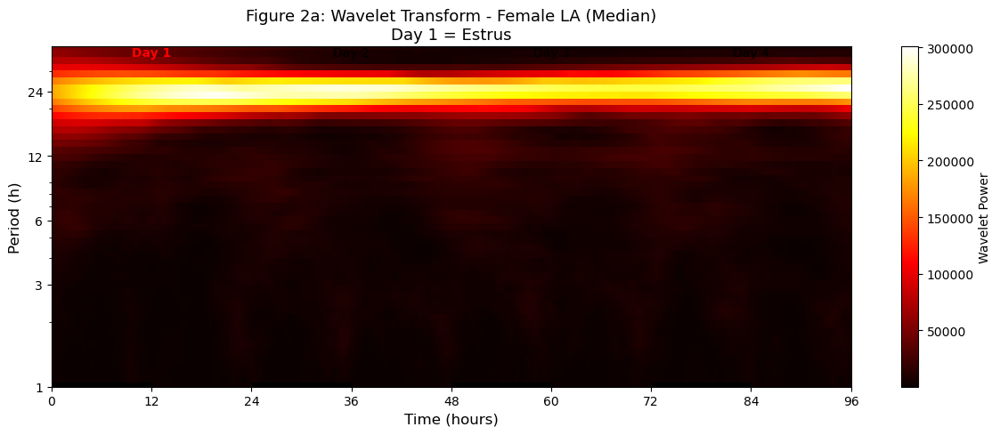

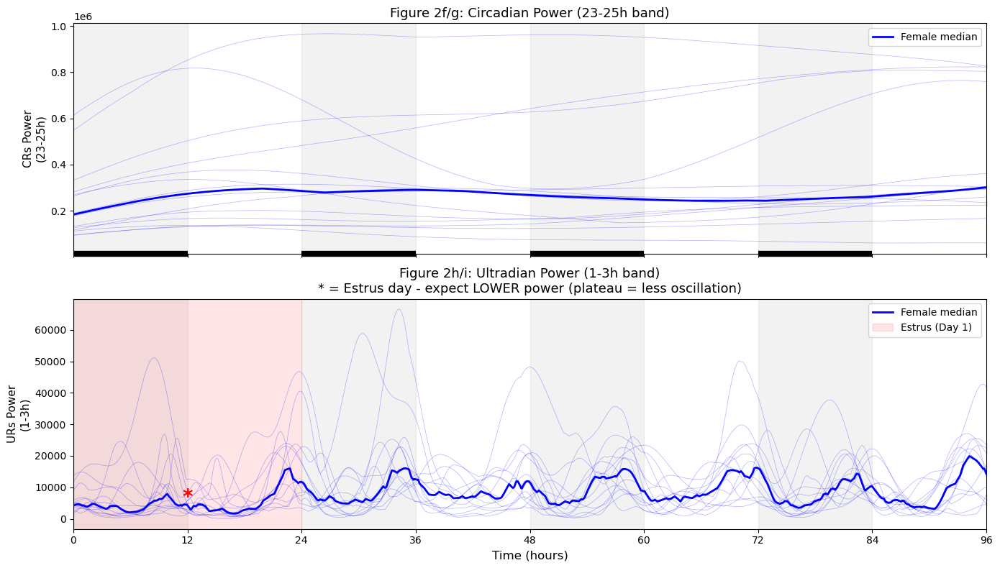


ULTRADIAN POWER: ESTRUS vs NON-ESTRUS

Per-animal mean ultradian power:
Mouse      Estrus (Day 1)     Non-estrus (Days 2-4)  Ratio      Lower on E?
----------------------------------------------------------------------
fem1       3491.34            4377.14                0.80       ✓
fem2       7062.53            9395.81                0.75       ✓
fem3       7413.80            10578.57               0.70       ✓
fem4       6925.31            17422.55               0.40       ✓
fem5       5645.82            7832.74                0.72       ✓
fem6       2882.14            7945.07                0.36       ✓
fem7       3485.35            6398.31                0.54       ✓
fem8       9455.47            9674.89                0.98       ✓
fem9       23467.54           21012.34               1.12       ✗
fem10      6417.85            11277.20               0.57       ✓
fem11      7977.78            12211.91               0.65       ✓
fem12      9255.83            14539.70               0

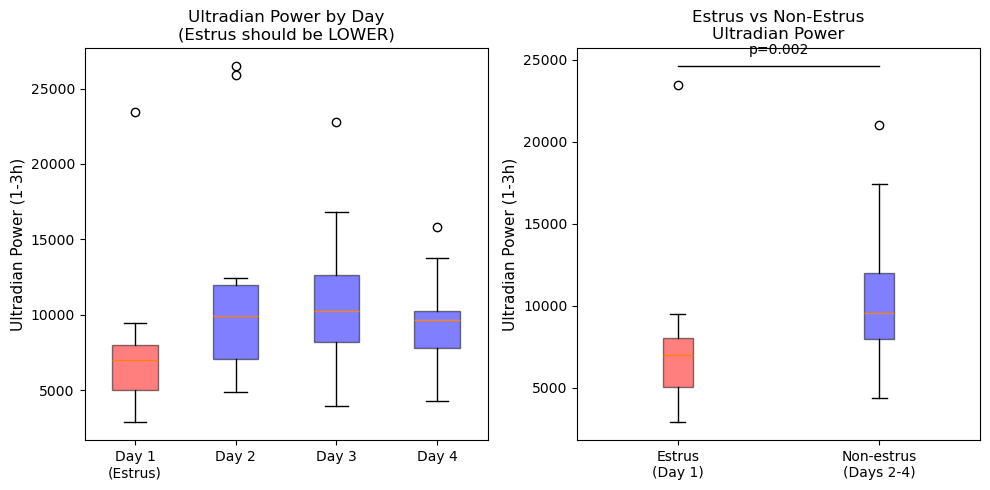


FIGURE 2 RECREATION COMPLETE
Saved:
  - smarr_fig2a_spectrogram.png
  - smarr_fig2hi_power.png
  - smarr_fig2_boxplots.png


In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import cwt, morlet2

# =============================================================================
# LOAD SMARR DATA
# =============================================================================

female_cols = [col for col in df_smarr.columns if col.startswith('fem')]
female_data = df_smarr[female_cols].values.T  # (n_females, n_timepoints)

n_females, n_timepoints = female_data.shape
minutes_per_day = 1440

print(f"Females: {n_females}, Timepoints: {n_timepoints}, Days: {n_timepoints/1440:.1f}")

# Confirmed: Day 1 = Estrus (days 1, 5 are estrus in 8-day data)

# =============================================================================
# WAVELET TRANSFORM FUNCTION
# =============================================================================
def compute_wavelet_transform(data, periods_minutes=None, w=5):
    """
    Compute continuous wavelet transform.
    
    Parameters:
    -----------
    data : 1D array - time series (1-min resolution)
    periods_minutes : array - periods to analyze (in minutes)
    w : int - Morlet wavelet parameter (Smarr used similar to this)
    
    Returns:
    --------
    power : 2D array - (n_periods, n_timepoints)
    periods : array - periods analyzed (in minutes)
    """
    # Handle NaNs
    data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
    
    if periods_minutes is None:
        # Periods from 1h to 39h (60 to 2340 minutes), log-spaced
        periods_minutes = np.logspace(np.log10(60), np.log10(39*60), 50)
    
    # Convert periods to scales for morlet2 wavelet
    # For morlet2: scale = period * fs * w / (2 * pi), where fs = 1 sample/min
    fs = 1  # 1 sample per minute
    scales = periods_minutes * fs * w / (2 * np.pi)
    
    # Compute CWT
    coeffs = cwt(data, morlet2, scales, w=w)
    power = np.abs(coeffs)**2
    
    return power, periods_minutes


def extract_band_power(power, periods_minutes, band_hours):
    """
    Extract MAX power in a frequency band (per Smarr's methods).
    
    Parameters:
    -----------
    power : 2D array - (n_periods, n_timepoints)
    periods_minutes : array - periods in minutes
    band_hours : tuple - (min_hours, max_hours)
    
    Returns:
    --------
    band_power : 1D array - max power in band at each timepoint
    """
    periods_hours = periods_minutes / 60
    band_mask = (periods_hours >= band_hours[0]) & (periods_hours <= band_hours[1])
    
    if not np.any(band_mask):
        return np.zeros(power.shape[1])
    
    # MAX power in band (as per Smarr's methods)
    band_power = np.max(power[band_mask, :], axis=0)
    
    return band_power


# =============================================================================
# COMPUTE WAVELET FOR ALL FEMALES
# =============================================================================
print("\nComputing wavelet transforms...")

# Define periods
periods_minutes = np.logspace(np.log10(60), np.log10(39*60), 50)
periods_hours = periods_minutes / 60

all_spectrograms = []
all_ultradian = []
all_circadian = []

for i in range(n_females):
    print(f"  {female_cols[i]}...", end=" ")
    
    # Compute wavelet
    power, _ = compute_wavelet_transform(female_data[i, :], periods_minutes)
    all_spectrograms.append(power)
    
    # Extract band powers
    ultradian = extract_band_power(power, periods_minutes, (1, 3))  # 1-3 hour
    circadian = extract_band_power(power, periods_minutes, (23, 25))  # 23-25 hour
    
    all_ultradian.append(ultradian)
    all_circadian.append(circadian)
    
    print("done")

all_spectrograms = np.array(all_spectrograms)  # (n_females, n_periods, n_timepoints)
all_ultradian = np.array(all_ultradian)  # (n_females, n_timepoints)
all_circadian = np.array(all_circadian)  # (n_females, n_timepoints)

print(f"\nSpectrogram shape: {all_spectrograms.shape}")

# =============================================================================
# FIGURE 2A: MEDIAN WAVELET SPECTROGRAM
# =============================================================================
# Use first 4 days to match Smarr's figure
n_minutes_4days = 4 * minutes_per_day

# Median across females
median_spectrogram = np.median(all_spectrograms[:, :, :n_minutes_4days], axis=0)

fig, ax = plt.subplots(figsize=(12, 5))

time_hours = np.arange(n_minutes_4days) / 60

# Plot spectrogram
im = ax.pcolormesh(time_hours, periods_hours, median_spectrogram, 
                   shading='auto', cmap='hot')

ax.set_yscale('log')
ax.set_ylabel('Period (h)', fontsize=12)
ax.set_xlabel('Time (hours)', fontsize=12)
ax.set_title('Figure 2a: Wavelet Transform - Female LA (Median)\nDay 1 = Estrus', fontsize=13)

# Y-axis ticks like Smarr
ax.set_yticks([1, 3, 6, 12, 24])
ax.set_yticklabels(['1', '3', '6', '12', '24'])
ax.set_ylim(1, 39)

# X-axis
ax.set_xlim(0, 96)
ax.set_xticks(np.arange(0, 97, 12))

# Light/dark bars at bottom
for day in range(4):
    start_h = day * 24
    # Dark phase (hours 0-12)
    ax.axhline(y=1, xmin=start_h/96, xmax=(start_h+12)/96, color='black', linewidth=8, solid_capstyle='butt')
    # Light phase (hours 12-24) - white, shown by gap

# Day labels
for day in range(1, 5):
    ax.text((day - 0.5) * 24, 35, f'Day {day}', ha='center', fontsize=10,
           fontweight='bold' if day == 1 else 'normal',
           color='red' if day == 1 else 'black')

# Colorbar
cbar = plt.colorbar(im, ax=ax, label='Wavelet Power')

plt.tight_layout()
plt.savefig('smarr_fig2a_spectrogram.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# FIGURE 2H/I: ULTRADIAN AND CIRCADIAN POWER OVER TIME
# =============================================================================
fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

time_hours_4day = np.arange(n_minutes_4days) / 60

# --- Panel 1: Circadian Power (23-25h) ---
ax = axes[0]

# Individual females (thin lines)
for i in range(n_females):
    ax.plot(time_hours_4day, all_circadian[i, :n_minutes_4days], 
            color='blue', alpha=0.3, linewidth=0.5)

# Median (thick line)
median_circadian = np.median(all_circadian[:, :n_minutes_4days], axis=0)
ax.plot(time_hours_4day, median_circadian, color='blue', linewidth=2, label='Female median')

# Light/dark shading
for day in range(4):
    start_h = day * 24
    ax.axvspan(start_h, start_h + 12, alpha=0.1, color='gray')

# Light/dark bars
for day in range(4):
    start_h = day * 24
    ax.axhline(y=ax.get_ylim()[0], xmin=start_h/96, xmax=(start_h+12)/96, 
              color='black', linewidth=6, solid_capstyle='butt', clip_on=False)

ax.set_ylabel('CRs Power\n(23-25h)', fontsize=11)
ax.set_title('Figure 2f/g: Circadian Power (23-25h band)', fontsize=13)
ax.legend(loc='upper right')
ax.set_xlim(0, 96)

# --- Panel 2: Ultradian Power (1-3h) - THE KEY PANEL ---
ax = axes[1]

# Individual females (thin lines)
for i in range(n_females):
    ax.plot(time_hours_4day, all_ultradian[i, :n_minutes_4days], 
            color='blue', alpha=0.3, linewidth=0.5)

# Median (thick line)
median_ultradian = np.median(all_ultradian[:, :n_minutes_4days], axis=0)
ax.plot(time_hours_4day, median_ultradian, color='blue', linewidth=2, label='Female median')

# Light/dark shading
for day in range(4):
    start_h = day * 24
    ax.axvspan(start_h, start_h + 12, alpha=0.1, color='gray')

# Mark estrus day
ax.axvspan(0, 24, alpha=0.1, color='red', label='Estrus (Day 1)')

# Add asterisk at Day 1 (estrus) to show the dip
# Find the minimum in Day 1
day1_ultradian = median_ultradian[:minutes_per_day]
min_idx = np.argmin(day1_ultradian)
min_time = min_idx / 60
min_val = day1_ultradian[min_idx]
ax.annotate('*', xy=(12, np.mean(day1_ultradian)), fontsize=20, ha='center', color='red', fontweight='bold')

ax.set_xlabel('Time (hours)', fontsize=12)
ax.set_ylabel('URs Power\n(1-3h)', fontsize=11)
ax.set_title('Figure 2h/i: Ultradian Power (1-3h band)\n* = Estrus day - expect LOWER power (plateau = less oscillation)', fontsize=13)
ax.legend(loc='upper right')
ax.set_xlim(0, 96)
ax.set_xticks(np.arange(0, 97, 12))

plt.tight_layout()
plt.savefig('smarr_fig2hi_power.png', dpi=150, bbox_inches='tight')
plt.show()

# =============================================================================
# QUANTIFY: Ultradian power on estrus vs non-estrus days
# =============================================================================
print("\n" + "="*60)
print("ULTRADIAN POWER: ESTRUS vs NON-ESTRUS")
print("="*60)

# Day 1 (estrus): minutes 0-1440
# Days 2-4 (non-estrus): minutes 1440-5760

estrus_ur = all_ultradian[:, :minutes_per_day].mean(axis=1)  # Mean per animal on Day 1
non_estrus_ur = all_ultradian[:, minutes_per_day:4*minutes_per_day].mean(axis=1)  # Mean per animal on Days 2-4

print(f"\nPer-animal mean ultradian power:")
print(f"{'Mouse':<10} {'Estrus (Day 1)':<18} {'Non-estrus (Days 2-4)':<22} {'Ratio':<10} {'Lower on E?'}")
print("-"*70)

for i, col in enumerate(female_cols):
    ratio = estrus_ur[i] / non_estrus_ur[i] if non_estrus_ur[i] > 0 else np.nan
    lower = "✓" if ratio < 1 else "✗"
    print(f"{col:<10} {estrus_ur[i]:<18.2f} {non_estrus_ur[i]:<22.2f} {ratio:<10.2f} {lower}")

n_lower = np.sum(estrus_ur < non_estrus_ur)
print("-"*70)
print(f"Mice with LOWER ultradian power on estrus: {n_lower}/{n_females} ({100*n_lower/n_females:.0f}%)")

# Statistical test
from scipy.stats import wilcoxon, ttest_rel

stat, p_wilcox = wilcoxon(estrus_ur, non_estrus_ur)
t_stat, p_ttest = ttest_rel(estrus_ur, non_estrus_ur)

print(f"\nStatistical tests (paired):")
print(f"  Wilcoxon signed-rank: p = {p_wilcox:.4f}")
print(f"  Paired t-test: p = {p_ttest:.4f}")

print(f"\nMean ± SD:")
print(f"  Estrus: {estrus_ur.mean():.2f} ± {estrus_ur.std():.2f}")
print(f"  Non-estrus: {non_estrus_ur.mean():.2f} ± {non_estrus_ur.std():.2f}")
print(f"  Ratio: {estrus_ur.mean() / non_estrus_ur.mean():.2f}")

if estrus_ur.mean() < non_estrus_ur.mean() and p_wilcox < 0.05:
    print("\n✓ CONFIRMED: Ultradian power is significantly LOWER on estrus day")
    print("  This matches Smarr's finding (χ²=13.52, p<0.001)")
else:
    print("\n⚠ Result does not match expected pattern")

# =============================================================================
# FIGURE: Box plot comparison (like Smarr's panels B and D)
# =============================================================================
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Panel 1: Ultradian power by day
ax = axes[0]
day_powers = []
for day in range(1, 5):
    day_start = (day - 1) * minutes_per_day
    day_end = day * minutes_per_day
    day_mean = all_ultradian[:, day_start:day_end].mean(axis=1)
    day_powers.append(day_mean)

bp = ax.boxplot(day_powers, labels=['Day 1\n(Estrus)', 'Day 2', 'Day 3', 'Day 4'], patch_artist=True)
bp['boxes'][0].set_facecolor('red')
bp['boxes'][0].set_alpha(0.5)
for i in range(1, 4):
    bp['boxes'][i].set_facecolor('blue')
    bp['boxes'][i].set_alpha(0.5)

ax.set_ylabel('Ultradian Power (1-3h)', fontsize=11)
ax.set_title('Ultradian Power by Day\n(Estrus should be LOWER)', fontsize=12)

# Panel 2: Estrus vs Non-estrus
ax = axes[1]
bp = ax.boxplot([estrus_ur, non_estrus_ur], labels=['Estrus\n(Day 1)', 'Non-estrus\n(Days 2-4)'], patch_artist=True)
bp['boxes'][0].set_facecolor('red')
bp['boxes'][0].set_alpha(0.5)
bp['boxes'][1].set_facecolor('blue')
bp['boxes'][1].set_alpha(0.5)

# Add significance marker
if p_wilcox < 0.05:
    y_max = max(estrus_ur.max(), non_estrus_ur.max())
    ax.plot([1, 2], [y_max*1.05, y_max*1.05], 'k-', linewidth=1)
    ax.text(1.5, y_max*1.08, f'p={p_wilcox:.3f}', ha='center', fontsize=10)

ax.set_ylabel('Ultradian Power (1-3h)', fontsize=11)
ax.set_title('Estrus vs Non-Estrus\nUltradian Power', fontsize=12)

plt.tight_layout()
plt.savefig('smarr_fig2_boxplots.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n" + "="*60)
print("FIGURE 2 RECREATION COMPLETE")
print("="*60)
print("Saved:")
print("  - smarr_fig2a_spectrogram.png")
print("  - smarr_fig2hi_power.png")
print("  - smarr_fig2_boxplots.png")

WAVELET ANALYSIS: MORPH2REP

Rep1 - WAVELET ANALYSIS
Animals: [9257, 9258, 9259, 9260, 9261, 9262, 9263, 9264, 9265]
  Animal 9257: computing wavelet (8.0 days)... done
  Animal 9258: computing wavelet (8.0 days)... 

/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_8

done
  Animal 9259: computing wavelet (8.0 days)... done
  Animal 9260: computing wavelet (8.0 days)... done
  Animal 9261: computing wavelet (8.0 days)... 

/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_8

done
  Animal 9262: computing wavelet (8.0 days)... done
  Animal 9263: computing wavelet (8.0 days)... done
  Animal 9264: computing wavelet (8.0 days)... 

/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_8

done
  Animal 9265: computing wavelet (8.0 days)... done

Processed 9 animals


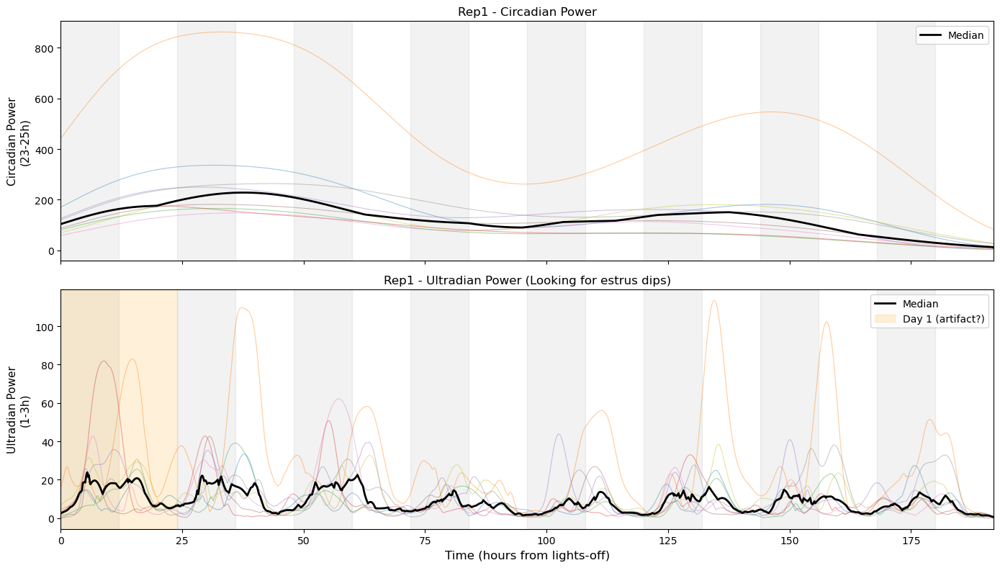


--- Ultradian Power by Day ---
(Looking for dips that might indicate estrus)
Animal      Day1        Day2        Day3        Day4        Day5        Day6        Day7        Lowest Day
--------------------------------------------------------------------------------------------------------------
9257        9.9         11.4        7.2         6.3         4.5         9.7         6.6         Day 5
9258        33.0        45.1        27.2        16.3        22.9        35.0        30.4        Day 4
9259        10.6        14.2        6.4         8.0         4.4         8.5         7.6         Day 5
9260        27.4        11.6        14.0        4.5         3.5         11.1        4.9         Day 5
9261        15.8        13.7        17.3        9.5         12.8        6.9         13.0        Day 6
9262        6.7         10.6        7.0         6.2         8.6         4.1         4.3         Day 6
9263        11.6        13.8        22.5        5.0         3.5         8.3         6.2     

/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_8

  Animal 9268: computing wavelet (8.0 days)... done
  Animal 9269: computing wavelet (8.0 days)... done
  Animal 9270: computing wavelet (8.0 days)... done


/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_8

  Animal 9271: computing wavelet (8.0 days)... done
  Animal 9272: computing wavelet (8.0 days)... 

/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)


done
  Animal 9273: computing wavelet (8.0 days)... done
  Animal 9274: computing wavelet (8.0 days)... done

Processed 9 animals


/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)


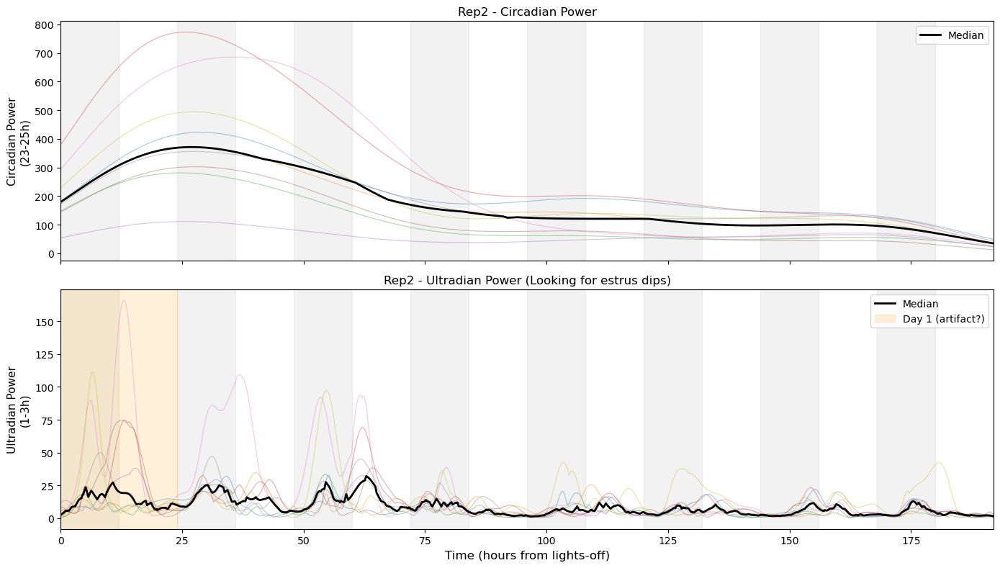


--- Ultradian Power by Day ---
(Looking for dips that might indicate estrus)
Animal      Day1        Day2        Day3        Day4        Day5        Day6        Day7        Lowest Day
--------------------------------------------------------------------------------------------------------------
9266        10.1        13.0        8.1         6.4         8.7         6.8         6.8         Day 4
9267        8.5         15.6        8.3         7.5         8.8         3.8         3.5         Day 7
9268        8.5         11.5        15.4        4.3         5.3         3.6         2.7         Day 7
9269        25.5        18.3        22.5        9.5         6.0         8.1         7.8         Day 5
9270        16.0        11.4        16.4        6.7         5.3         5.0         5.6         Day 6
9271        31.0        14.9        15.2        5.6         6.2         4.4         4.2         Day 7
9272        51.8        51.6        42.5        9.2         5.5         6.6         4.5     

In [61]:
# =============================================================================
# APPLY WAVELET ANALYSIS TO MORPH2REP
# =============================================================================
print("="*60)
print("WAVELET ANALYSIS: MORPH2REP")
print("="*60)

minutes_per_day = 1440

for rep, cfg in VEHICLE_CAGES.items():
    print(f"\n{'='*60}")
    print(f"{rep} - WAVELET ANALYSIS")
    print(f"{'='*60}")
    
    # Shifted start (6PM = lights off, matching Smarr)
    original_start = pd.to_datetime(cfg['analysis_start'])
    shifted_start = original_start + pd.Timedelta(hours=12)
    
    rep_data = df_dist[df_dist['replicate'] == rep].copy()
    
    if len(rep_data) == 0:
        print(f"No data for {rep}")
        continue
    
    rep_data['minutes_from_start'] = (rep_data['time'] - shifted_start).dt.total_seconds() / 60
    rep_data = rep_data[rep_data['minutes_from_start'] >= 0].copy()
    
    # Limit to 8 days
    max_minutes = 8 * minutes_per_day
    rep_data = rep_data[rep_data['minutes_from_start'] < max_minutes].copy()
    
    animals = sorted(rep_data['animal_id'].unique())
    # Filter out animal_id = 0 (tracking failures)
    animals = [a for a in animals if a != 0]
    
    print(f"Animals: {animals}")
    
    # =============================================================================
    # COMPUTE WAVELET FOR EACH ANIMAL
    # =============================================================================
    all_ultradian_morph = []
    all_circadian_morph = []
    animal_ids_processed = []
    
    for animal_id in animals:
        animal_data = rep_data[rep_data['animal_id'] == animal_id].copy()
        
        # Create minute-level time series
        animal_data['minute_bin'] = animal_data['minutes_from_start'].round().astype(int)
        minute_avg = animal_data.groupby('minute_bin')['value'].mean()
        
        # Fill to complete series
        max_min = min(int(minute_avg.index.max()), max_minutes - 1)
        full_series = pd.Series(index=range(max_min + 1), dtype=float)
        full_series.update(minute_avg)
        animal_ts = full_series.values
        
        # Skip if too short
        if len(animal_ts) < 4 * minutes_per_day:
            print(f"  Animal {animal_id}: insufficient data ({len(animal_ts)/1440:.1f} days), skipping")
            continue
        
        print(f"  Animal {animal_id}: computing wavelet ({len(animal_ts)/1440:.1f} days)...", end=" ")
        
        # Compute wavelet
        power, periods = compute_wavelet_transform(animal_ts, periods_minutes)
        
        # Extract band powers
        ultradian = extract_band_power(power, periods, (1, 3))
        circadian = extract_band_power(power, periods, (23, 25))
        
        all_ultradian_morph.append(ultradian)
        all_circadian_morph.append(circadian)
        animal_ids_processed.append(animal_id)
        
        print("done")
    
    if len(all_ultradian_morph) == 0:
        print("No animals processed")
        continue
    
    # Pad to same length
    max_len = max(len(u) for u in all_ultradian_morph)
    all_ultradian_morph = [np.pad(u, (0, max_len - len(u)), constant_values=np.nan) for u in all_ultradian_morph]
    all_circadian_morph = [np.pad(c, (0, max_len - len(c)), constant_values=np.nan) for c in all_circadian_morph]
    
    all_ultradian_morph = np.array(all_ultradian_morph)
    all_circadian_morph = np.array(all_circadian_morph)
    
    n_animals = len(animal_ids_processed)
    print(f"\nProcessed {n_animals} animals")
    
    # =============================================================================
    # PLOT: Ultradian power over time (like Smarr Figure 2h)
    # =============================================================================
    n_minutes_plot = min(8 * minutes_per_day, all_ultradian_morph.shape[1])
    time_hours = np.arange(n_minutes_plot) / 60
    
    fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)
    
    # --- Circadian Power ---
    ax = axes[0]
    for i in range(n_animals):
        ax.plot(time_hours, all_circadian_morph[i, :n_minutes_plot], alpha=0.4, linewidth=0.8)
    
    median_circ = np.nanmedian(all_circadian_morph[:, :n_minutes_plot], axis=0)
    ax.plot(time_hours, median_circ, color='black', linewidth=2, label='Median')
    
    # Light/dark shading
    n_days = int(np.ceil(n_minutes_plot / minutes_per_day))
    for day in range(n_days):
        ax.axvspan(day*24, day*24 + 12, alpha=0.1, color='gray')
    
    ax.set_ylabel('Circadian Power\n(23-25h)', fontsize=11)
    ax.set_title(f'{rep} - Circadian Power', fontsize=12)
    ax.legend(loc='upper right')
    ax.set_xlim(0, n_minutes_plot/60)
    
    # --- Ultradian Power ---
    ax = axes[1]
    for i in range(n_animals):
        ax.plot(time_hours, all_ultradian_morph[i, :n_minutes_plot], alpha=0.4, linewidth=0.8)
    
    median_ultr = np.nanmedian(all_ultradian_morph[:, :n_minutes_plot], axis=0)
    ax.plot(time_hours, median_ultr, color='black', linewidth=2, label='Median')
    
    for day in range(n_days):
        ax.axvspan(day*24, day*24 + 12, alpha=0.1, color='gray')
    
    # Mark Day 1 (potential artifact) vs rest
    ax.axvspan(0, 24, alpha=0.15, color='orange', label='Day 1 (artifact?)')
    
    ax.set_xlabel('Time (hours from lights-off)', fontsize=12)
    ax.set_ylabel('Ultradian Power\n(1-3h)', fontsize=11)
    ax.set_title(f'{rep} - Ultradian Power (Looking for estrus dips)', fontsize=12)
    ax.legend(loc='upper right')
    ax.set_xlim(0, n_minutes_plot/60)
    
    plt.tight_layout()
    plt.savefig(f'morph2rep_{rep}_wavelet_power.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # =============================================================================
    # QUANTIFY: Day-by-day ultradian power
    # =============================================================================
    print(f"\n--- Ultradian Power by Day ---")
    print(f"(Looking for dips that might indicate estrus)")
    print(f"{'Animal':<12}", end="")
    for day in range(1, min(8, n_days + 1)):
        print(f"{'Day'+str(day):<12}", end="")
    print("Lowest Day")
    print("-"*110)
    
    animal_lowest_days = []
    
    for i, animal_id in enumerate(animal_ids_processed):
        print(f"{animal_id:<12}", end="")
        
        day_powers = []
        for day in range(1, min(8, n_days + 1)):
            day_start = (day - 1) * minutes_per_day
            day_end = day * minutes_per_day
            
            if day_end <= all_ultradian_morph.shape[1]:
                day_power = np.nanmean(all_ultradian_morph[i, day_start:day_end])
            else:
                day_power = np.nan
            day_powers.append(day_power)
            print(f"{day_power:<12.1f}", end="")
        
        # Find lowest day (excluding Day 1 due to artifact)
        valid_days = [(d+2, p) for d, p in enumerate(day_powers[1:]) if not np.isnan(p)]
        if valid_days:
            lowest_day = min(valid_days, key=lambda x: x[1])[0]
        else:
            lowest_day = None
        
        animal_lowest_days.append(lowest_day)
        print(f"Day {lowest_day}" if lowest_day else "N/A")
    
    # =============================================================================
    # CHECK: Do lowest days follow 4-day pattern?
    # =============================================================================
    print(f"\n--- 4-Day Cycle Check (excluding Day 1) ---")
    print("If estrus is present, lowest ultradian days should cluster")
    
    from collections import Counter
    day_counts = Counter([d for d in animal_lowest_days if d is not None])
    print(f"Lowest day distribution: {dict(day_counts)}")
    
    # Check for 4-day spacing
    print("\nPossible estrus assignments:")
    for assumed_estrus in [2, 3, 4, 5]:
        estrus_days = [d for d in range(2, 9) if (d - assumed_estrus) % 4 == 0]
        matches = sum(1 for d in animal_lowest_days if d in estrus_days)
        print(f"  If Day {assumed_estrus} = estrus (days {estrus_days}): {matches}/{n_animals} animals match")
    
    # =============================================================================
    # COMPARE: Day 2 vs Days 3-5 (excluding Day 1 artifact)
    # =============================================================================
    print(f"\n--- Ultradian Power: Day 2 vs Days 3-5 ---")
    print("(Testing if Day 2 shows estrus-like dip)")
    
    day2_power = all_ultradian_morph[:, minutes_per_day:2*minutes_per_day].mean(axis=1)
    days35_power = all_ultradian_morph[:, 2*minutes_per_day:5*minutes_per_day].mean(axis=1)
    
    print(f"{'Animal':<12} {'Day 2':<15} {'Days 3-5':<15} {'Ratio':<10} {'Lower on D2?'}")
    print("-"*60)
    
    for i, animal_id in enumerate(animal_ids_processed):
        ratio = day2_power[i] / days35_power[i] if days35_power[i] > 0 else np.nan
        lower = "✓" if ratio < 0.9 else "✗"
        print(f"{animal_id:<12} {day2_power[i]:<15.1f} {days35_power[i]:<15.1f} {ratio:<10.2f} {lower}")
    
    n_lower = np.sum(day2_power < days35_power * 0.9)
    print("-"*60)
    print(f"Animals with notably lower power on Day 2: {n_lower}/{n_animals}")
    
    if n_animals >= 3:
        stat, p = wilcoxon(day2_power[~np.isnan(day2_power) & ~np.isnan(days35_power)], 
                          days35_power[~np.isnan(day2_power) & ~np.isnan(days35_power)])
        print(f"Wilcoxon test (Day 2 vs Days 3-5): p = {p:.4f}")

print("\n" + "="*60)
print("SUMMARY")
print("="*60)
print("""
Wavelet analysis applied to Morph2REP data.

Key questions:
1. Do we see ultradian power dips like Smarr found?
2. Do any days show consistent dips across animals?
3. Is there evidence of 4-day cycling?

Caveats:
- Day 1 is confounded by cage introduction (artifact)
- Lee-Boot effect may suppress cycling
- Short baseline limits detection power
- No ground truth for validation
""")

In [62]:
# =============================================================================
# COMPREHENSIVE SUMMARY STATISTICS FOR MORPH2REP WAVELET ANALYSIS
# =============================================================================
import pandas as pd
import numpy as np
from scipy.stats import wilcoxon, ttest_rel, kruskal, spearmanr
from collections import Counter

print("="*80)
print("MORPH2REP ESTROUS DETECTION: COMPREHENSIVE SUMMARY STATISTICS")
print("="*80)

# =============================================================================
# 1. SMARR REPLICATION SUMMARY (BASELINE)
# =============================================================================
print("\n" + "="*80)
print("SECTION 1: SMARR DATA REPLICATION (VALIDATION)")
print("="*80)

print(f"""
Dataset: Smarr 2017 Female LA data
N mice: {n_females}
Days: {n_timepoints / 1440:.1f}
Estrus days: 1, 5 (confirmed Day 1 = estrus)

ULTRADIAN POWER (1-3h band):
  Estrus (Day 1):     {estrus_ur.mean():.1f} ± {estrus_ur.std():.1f}
  Non-estrus (D2-4):  {non_estrus_ur.mean():.1f} ± {non_estrus_ur.std():.1f}
  Ratio (E/non-E):    {estrus_ur.mean() / non_estrus_ur.mean():.2f}
  
  Mice with lower power on estrus: {np.sum(estrus_ur < non_estrus_ur)}/{n_females} ({100*np.sum(estrus_ur < non_estrus_ur)/n_females:.0f}%)
  Wilcoxon p-value: {wilcoxon(estrus_ur, non_estrus_ur)[1]:.4f}
  
  CONCLUSION: {"✓ REPLICATED" if wilcoxon(estrus_ur, non_estrus_ur)[1] < 0.05 else "✗ NOT REPLICATED"}
""")

# =============================================================================
# 2. MORPH2REP ANALYSIS
# =============================================================================
for rep, cfg in VEHICLE_CAGES.items():
    print("\n" + "="*80)
    print(f"SECTION 2: {rep} WAVELET ANALYSIS")
    print("="*80)
    
    # Get data
    original_start = pd.to_datetime(cfg['analysis_start'])
    shifted_start = original_start + pd.Timedelta(hours=12)
    
    rep_data = df_dist[df_dist['replicate'] == rep].copy()
    if len(rep_data) == 0:
        print(f"No data for {rep}")
        continue
    
    rep_data['minutes_from_start'] = (rep_data['time'] - shifted_start).dt.total_seconds() / 60
    rep_data = rep_data[rep_data['minutes_from_start'] >= 0].copy()
    max_minutes = 8 * minutes_per_day
    rep_data = rep_data[rep_data['minutes_from_start'] < max_minutes].copy()
    
    animals = sorted([a for a in rep_data['animal_id'].unique() if a != 0])
    cages = sorted(rep_data['cage_id'].unique())
    
    print(f"""
DATASET INFO:
  Cages: {cages}
  Animals: {len(animals)}
  Analysis start: {shifted_start} (shifted to lights-off)
  Days available: {rep_data['minutes_from_start'].max() / 1440:.1f}
""")
    
    # Compute wavelets for all animals
    animal_results = []
    
    for animal_id in animals:
        animal_data = rep_data[rep_data['animal_id'] == animal_id].copy()
        cage_id = animal_data['cage_id'].iloc[0]
        
        # Create time series
        animal_data['minute_bin'] = animal_data['minutes_from_start'].round().astype(int)
        minute_avg = animal_data.groupby('minute_bin')['value'].mean()
        
        max_min = min(int(minute_avg.index.max()), max_minutes - 1)
        full_series = pd.Series(index=range(max_min + 1), dtype=float)
        full_series.update(minute_avg)
        animal_ts = full_series.values
        
        if len(animal_ts) < 4 * minutes_per_day:
            continue
        
        # Compute wavelet
        power, periods = compute_wavelet_transform(animal_ts, periods_minutes)
        ultradian = extract_band_power(power, periods, (1, 3))
        
        # Day-by-day ultradian power
        day_powers = []
        n_days = min(8, len(ultradian) // minutes_per_day)
        for day in range(1, n_days + 1):
            day_start = (day - 1) * minutes_per_day
            day_end = day * minutes_per_day
            if day_end <= len(ultradian):
                day_powers.append(np.nanmean(ultradian[day_start:day_end]))
            else:
                day_powers.append(np.nan)
        
        # Find lowest day (excluding Day 1)
        valid_days_excl_d1 = [(i+2, p) for i, p in enumerate(day_powers[1:]) if not np.isnan(p)]
        lowest_day_excl_d1 = min(valid_days_excl_d1, key=lambda x: x[1])[0] if valid_days_excl_d1 else None
        
        # Find overall lowest day
        valid_days_all = [(i+1, p) for i, p in enumerate(day_powers) if not np.isnan(p)]
        lowest_day_all = min(valid_days_all, key=lambda x: x[1])[0] if valid_days_all else None
        
        animal_results.append({
            'animal_id': animal_id,
            'cage_id': cage_id,
            'day_powers': day_powers,
            'lowest_day_excl_d1': lowest_day_excl_d1,
            'lowest_day_all': lowest_day_all,
            'day1_power': day_powers[0] if len(day_powers) > 0 else np.nan,
            'day2_power': day_powers[1] if len(day_powers) > 1 else np.nan,
            'days3to5_power': np.nanmean(day_powers[2:5]) if len(day_powers) > 4 else np.nan,
            'days2to4_power': np.nanmean(day_powers[1:4]) if len(day_powers) > 3 else np.nan,
        })
    
    n_animals = len(animal_results)
    
    # =============================================================================
    # 2A. DAY-BY-DAY ULTRADIAN POWER TABLE
    # =============================================================================
    print("\n--- 2A. DAY-BY-DAY ULTRADIAN POWER (per animal) ---")
    print(f"{'Animal':<10} {'Cage':<8}", end="")
    for d in range(1, 8):
        print(f"{'Day'+str(d):<10}", end="")
    print("Lowest(all)  Lowest(excl D1)")
    print("-"*120)
    
    for r in animal_results:
        print(f"{r['animal_id']:<10} {r['cage_id']:<8}", end="")
        for d in range(7):
            val = r['day_powers'][d] if d < len(r['day_powers']) else np.nan
            print(f"{val:<10.1f}" if not np.isnan(val) else f"{'N/A':<10}", end="")
        print(f"{r['lowest_day_all']:<13} {r['lowest_day_excl_d1']}")
    
    # =============================================================================
    # 2B. LOWEST DAY DISTRIBUTION
    # =============================================================================
    print("\n--- 2B. LOWEST ULTRADIAN POWER DAY DISTRIBUTION ---")
    
    lowest_all = [r['lowest_day_all'] for r in animal_results if r['lowest_day_all']]
    lowest_excl = [r['lowest_day_excl_d1'] for r in animal_results if r['lowest_day_excl_d1']]
    
    print(f"Including Day 1:  {dict(Counter(lowest_all))}")
    print(f"Excluding Day 1:  {dict(Counter(lowest_excl))}")
    
    # =============================================================================
    # 2C. 4-DAY CYCLE HYPOTHESIS TESTING
    # =============================================================================
    print("\n--- 2C. 4-DAY CYCLE HYPOTHESIS TESTING ---")
    print("Testing which day assignment best fits the data:")
    print("(If mice cycle, lowest ultradian days should cluster on estrus days)")
    print()
    
    for assumed_estrus in [2, 3, 4, 5]:
        estrus_days = [d for d in range(2, 9) if (d - assumed_estrus) % 4 == 0]
        matches = sum(1 for d in lowest_excl if d in estrus_days)
        expected = len(lowest_excl) * len(estrus_days) / 7  # random expectation
        print(f"  Day {assumed_estrus} = estrus → estrus days {estrus_days}: {matches}/{len(lowest_excl)} match (expected by chance: {expected:.1f})")
    
    # =============================================================================
    # 2D. DAY 1 vs REST COMPARISON (artifact check)
    # =============================================================================
    print("\n--- 2D. DAY 1 vs DAYS 2-4 (artifact check) ---")
    
    day1_powers = np.array([r['day1_power'] for r in animal_results])
    days24_powers = np.array([r['days2to4_power'] for r in animal_results])
    
    valid_mask = ~np.isnan(day1_powers) & ~np.isnan(days24_powers)
    
    print(f"  Day 1 mean:     {np.nanmean(day1_powers):.1f} ± {np.nanstd(day1_powers):.1f}")
    print(f"  Days 2-4 mean:  {np.nanmean(days24_powers):.1f} ± {np.nanstd(days24_powers):.1f}")
    print(f"  Ratio (D1/D2-4): {np.nanmean(day1_powers) / np.nanmean(days24_powers):.2f}")
    print(f"  Animals with lower power on Day 1: {np.sum(day1_powers[valid_mask] < days24_powers[valid_mask])}/{np.sum(valid_mask)}")
    
    if np.sum(valid_mask) >= 3:
        stat, p = wilcoxon(day1_powers[valid_mask], days24_powers[valid_mask])
        print(f"  Wilcoxon p-value: {p:.4f}")
    
    # =============================================================================
    # 2E. DAY 2 vs DAYS 3-5 (estrus test, excluding Day 1 artifact)
    # =============================================================================
    print("\n--- 2E. DAY 2 vs DAYS 3-5 (estrus pattern test) ---")
    
    day2_powers = np.array([r['day2_power'] for r in animal_results])
    days35_powers = np.array([r['days3to5_power'] for r in animal_results])
    
    valid_mask2 = ~np.isnan(day2_powers) & ~np.isnan(days35_powers)
    
    print(f"  Day 2 mean:     {np.nanmean(day2_powers):.1f} ± {np.nanstd(day2_powers):.1f}")
    print(f"  Days 3-5 mean:  {np.nanmean(days35_powers):.1f} ± {np.nanstd(days35_powers):.1f}")
    print(f"  Ratio (D2/D3-5): {np.nanmean(day2_powers) / np.nanmean(days35_powers):.2f}")
    print(f"  Animals with lower power on Day 2: {np.sum(day2_powers[valid_mask2] < days35_powers[valid_mask2])}/{np.sum(valid_mask2)}")
    
    if np.sum(valid_mask2) >= 3:
        stat, p = wilcoxon(day2_powers[valid_mask2], days35_powers[valid_mask2])
        print(f"  Wilcoxon p-value: {p:.4f}")
    
    # =============================================================================
    # 2F. CAGE-LEVEL SYNCHRONIZATION
    # =============================================================================
    print("\n--- 2F. CAGE-LEVEL SYNCHRONIZATION ---")
    print("Do animals in the same cage show lowest power on same day?")
    print()
    
    for cage_id in cages:
        cage_animals = [r for r in animal_results if r['cage_id'] == cage_id]
        lowest_days = [r['lowest_day_excl_d1'] for r in cage_animals if r['lowest_day_excl_d1']]
        animal_ids = [r['animal_id'] for r in cage_animals]
        
        if len(lowest_days) >= 2:
            spread = max(lowest_days) - min(lowest_days) if lowest_days else 0
            if len(set(lowest_days)) == 1:
                sync = "SYNCED"
            elif spread <= 1:
                sync = "CLOSE (±1 day)"
            else:
                sync = "NOT SYNCED"
        else:
            sync = "INSUFFICIENT DATA"
        
        print(f"  Cage {cage_id}: Animals {animal_ids} → Lowest days {lowest_days} → {sync}")
    
    # =============================================================================
    # 2G. INTER-DAY VARIABILITY (Kruskal-Wallis test)
    # =============================================================================
    print("\n--- 2G. INTER-DAY VARIABILITY (excluding Day 1) ---")
    print("Kruskal-Wallis test: Is ultradian power different across days?")
    
    day_groups = []
    for day in range(2, 6):  # Days 2-5
        day_vals = [r['day_powers'][day-1] for r in animal_results if len(r['day_powers']) >= day and not np.isnan(r['day_powers'][day-1])]
        if day_vals:
            day_groups.append(day_vals)
            print(f"  Day {day}: n={len(day_vals)}, mean={np.mean(day_vals):.1f}")
    
    if len(day_groups) >= 2 and all(len(g) >= 2 for g in day_groups):
        stat, p = kruskal(*day_groups)
        print(f"  Kruskal-Wallis H={stat:.2f}, p={p:.4f}")
        if p < 0.05:
            print("  → Significant day effect (some days differ)")
        else:
            print("  → No significant day effect (days are similar)")
    
    # =============================================================================
    # 2H. COMPARISON TO SMARR EFFECT SIZE
    # =============================================================================
    print("\n--- 2H. EFFECT SIZE COMPARISON ---")
    print("Smarr found estrus/non-estrus ratio = 0.72 (28% reduction)")
    print()
    
    # Best case scenario: assume Day 2 is estrus
    if np.sum(valid_mask2) > 0:
        morph_ratio = np.nanmean(day2_powers) / np.nanmean(days35_powers)
        smarr_ratio = 0.72
        print(f"  Smarr ratio (E/non-E):        {smarr_ratio:.2f}")
        print(f"  Morph2REP ratio (D2/D3-5):    {morph_ratio:.2f}")
        
        if morph_ratio < 0.85:
            print(f"  → Similar effect size to Smarr")
        elif morph_ratio < 1.0:
            print(f"  → Weaker effect than Smarr, but in expected direction")
        else:
            print(f"  → No estrus-like pattern (ratio ≥ 1.0)")

# =============================================================================
# 3. OVERALL CONCLUSIONS
# =============================================================================
print("\n" + "="*80)
print("SECTION 3: KEY QUESTIONS FOR INTERPRETATION")
print("="*80)
print("""
Please answer these questions based on the above statistics:

1. SMARR REPLICATION: Was the wavelet method validated?
   - Did we see significantly lower ultradian power on estrus day?
   - What was the effect size (ratio)?

2. DAY 1 ARTIFACT: Is Day 1 confounded?
   - Is Day 1 significantly different from other days?
   - Should Day 1 be excluded from estrus analysis?

3. ESTRUS PATTERN: Is there evidence of estrous cycling?
   - Do any days show consistently lower ultradian power?
   - Does the lowest-day distribution suggest 4-day cycling?

4. CAGE SYNCHRONIZATION: Are cagemates synchronized?
   - Do animals in same cage show lowest power on same days?
   - Is Lee-Boot effect (suppressed cycling) evident?

5. FEASIBILITY: Can we detect estrus in Morph2REP?
   - Is the effect size comparable to Smarr?
   - Is there enough signal to detect estrus without ground truth?

6. RECOMMENDATIONS: What should we do next?
   - Request ground truth data (vaginal cytology)?
   - Focus on specific cages/animals?
   - Adjust analysis parameters?
""")

MORPH2REP ESTROUS DETECTION: COMPREHENSIVE SUMMARY STATISTICS

SECTION 1: SMARR DATA REPLICATION (VALIDATION)

Dataset: Smarr 2017 Female LA data
N mice: 14
Days: 8.0
Estrus days: 1, 5 (confirmed Day 1 = estrus)

ULTRADIAN POWER (1-3h band):
  Estrus (Day 1):     7597.3 ± 4840.0
  Non-estrus (D2-4):  10625.3 ± 4309.4
  Ratio (E/non-E):    0.72
  
  Mice with lower power on estrus: 12/14 (86%)
  Wilcoxon p-value: 0.0023
  
  CONCLUSION: ✓ REPLICATED


SECTION 2: Rep1 WAVELET ANALYSIS

DATASET INFO:
  Cages: [4918, 4922, 4923]
  Animals: 9
  Analysis start: 2025-01-10 18:00:00 (shifted to lights-off)
  Days available: 8.0



/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_8


--- 2A. DAY-BY-DAY ULTRADIAN POWER (per animal) ---
Animal     Cage    Day1      Day2      Day3      Day4      Day5      Day6      Day7      Lowest(all)  Lowest(excl D1)
------------------------------------------------------------------------------------------------------------------------
9257       4918    9.9       11.4      7.2       6.3       4.5       9.7       6.6       5             5
9258       4918    33.0      45.1      27.2      16.3      22.9      35.0      30.4      4             4
9259       4918    10.6      14.2      6.4       8.0       4.4       8.5       7.6       5             5
9260       4922    27.4      11.6      14.0      4.5       3.5       11.1      4.9       5             5
9261       4922    15.8      13.7      17.3      9.5       12.8      6.9       13.0      6             6
9262       4922    6.7       10.6      7.0       6.2       8.6       4.1       4.3       6             6
9263       4923    11.6      13.8      22.5      5.0       3.5       8.3      

/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_8


--- 2A. DAY-BY-DAY ULTRADIAN POWER (per animal) ---
Animal     Cage    Day1      Day2      Day3      Day4      Day5      Day6      Day7      Lowest(all)  Lowest(excl D1)
------------------------------------------------------------------------------------------------------------------------
9266       4928    10.1      13.0      8.1       6.4       8.7       6.8       6.8       8             8
9267       4928    8.5       15.6      8.3       7.5       8.8       3.8       3.5       7             7
9268       4928    8.5       11.5      15.4      4.3       5.3       3.6       2.7       8             8
9269       4929    25.5      18.3      22.5      9.5       6.0       8.1       7.8       8             8
9270       4929    16.0      11.4      16.4      6.7       5.3       5.0       5.6       8             8
9271       4929    31.0      14.9      15.2      5.6       6.2       4.4       4.2       7             7
9272       4934    51.8      51.6      42.5      9.2       5.5       6.6      

PROPER ESTROUS CYCLE DETECTION

Logic:
- Estrus = LOW ultradian power (below threshold)
- 4-day cycle = LOW days should be ~4 days apart
- In 8 days, we expect 2 estrus events (e.g., Day 1 & 5, or Day 2 & 6, etc.)

Method:
1. For each animal, calculate median ultradian power
2. Mark days as "LOW" if below threshold (e.g., 80% of median)
3. Check if LOW days are spaced 4 days apart
4. Test multiple thresholds to find robust patterns


Rep1 - INDIVIDUAL ANIMAL CYCLE DETECTION


/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_8


--- METHOD 1: Days below individual median (excl. Day 1) ---
A day is 'LOW' if ultradian power < 80% of animal's median

Animal     Cage     Day2   Day3   Day4   Day5   Day6   Day7   Day8   LOW days        4-day pattern?
--------------------------------------------------------------------------------------------------------------
9257       4918     ---    ---    ---    LOW    ---    ---    N/A    [5]             ✗ No 4-day pair
9258       4918     ---    ---    LOW    ---    ---    ---    ---    [4]             ✗ No 4-day pair
9259       4918     ---    ---    ---    LOW    ---    ---    LOW    [5, 8]          ✗ No 4-day pair
9260       4922     ---    ---    ---    LOW    ---    ---    ---    [5]             ✗ No 4-day pair
9261       4922     ---    ---    LOW    ---    LOW    ---    LOW    [4, 6, 8]       ✓ Day 4 & 8
9262       4922     ---    ---    ---    ---    LOW    LOW    LOW    [6, 7, 8]       ✗ No 4-day pair
9263       4923     ---    ---    ---    LOW    ---    ---    LOW

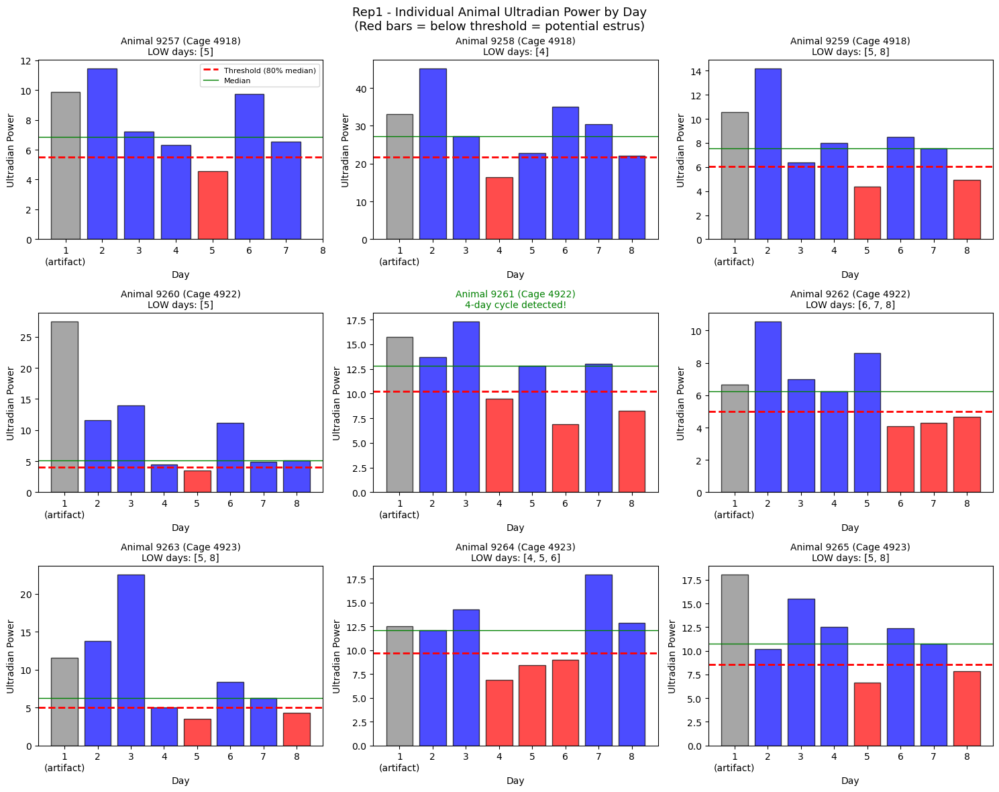


--- METHOD 4: Dip-and-Recovery Pattern ---
True cycling shows: HIGH → LOW → HIGH (recovery)
Habituation shows: HIGH → LOW → LOW (no recovery)

Animal     Cage     Pattern                                            Interpretation
----------------------------------------------------------------------------------------------------
9257       4918     Min=Day5(4.5) → Recovery(8.1)                      ~ MODERATE: Recovery but no 2nd dip visible
9258       4918     Min=Day4(16.3) → Recovery(28.9) → 2nd dip Day8     ✓ STRONG: Cycling likely
9259       4918     Min=Day5(4.4) → Recovery(8.0)                      ~ MODERATE: Recovery but no 2nd dip visible
9260       4922     Min=Day5(3.5) → Recovery(8.0)                      ~ MODERATE: Recovery but no 2nd dip visible
9261       4922     Min=Day6(6.9) → Recovery(10.6)                     ~ MODERATE: Recovery but no 2nd dip visible
9262       4922     Min=Day6(4.1) → No recovery                        ✗ WEAK: Looks like habituation
9263       

/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_8


--- METHOD 1: Days below individual median (excl. Day 1) ---
A day is 'LOW' if ultradian power < 80% of animal's median

Animal     Cage     Day2   Day3   Day4   Day5   Day6   Day7   Day8   LOW days        4-day pattern?
--------------------------------------------------------------------------------------------------------------
9266       4928     ---    ---    ---    ---    ---    ---    LOW    [8]             ✗ No 4-day pair
9267       4928     ---    ---    ---    ---    LOW    LOW    LOW    [6, 7, 8]       ✗ No 4-day pair
9268       4928     ---    ---    ---    ---    ---    LOW    LOW    [7, 8]          ✗ No 4-day pair
9269       4929     ---    ---    ---    LOW    ---    ---    LOW    [5, 8]          ✗ No 4-day pair
9270       4929     ---    ---    ---    ---    ---    ---    ---    []              ✗ 
9271       4929     ---    ---    ---    ---    LOW    LOW    ---    [6, 7]          ✗ No 4-day pair
9272       4934     ---    ---    ---    LOW    ---    LOW    N/A    [5, 7

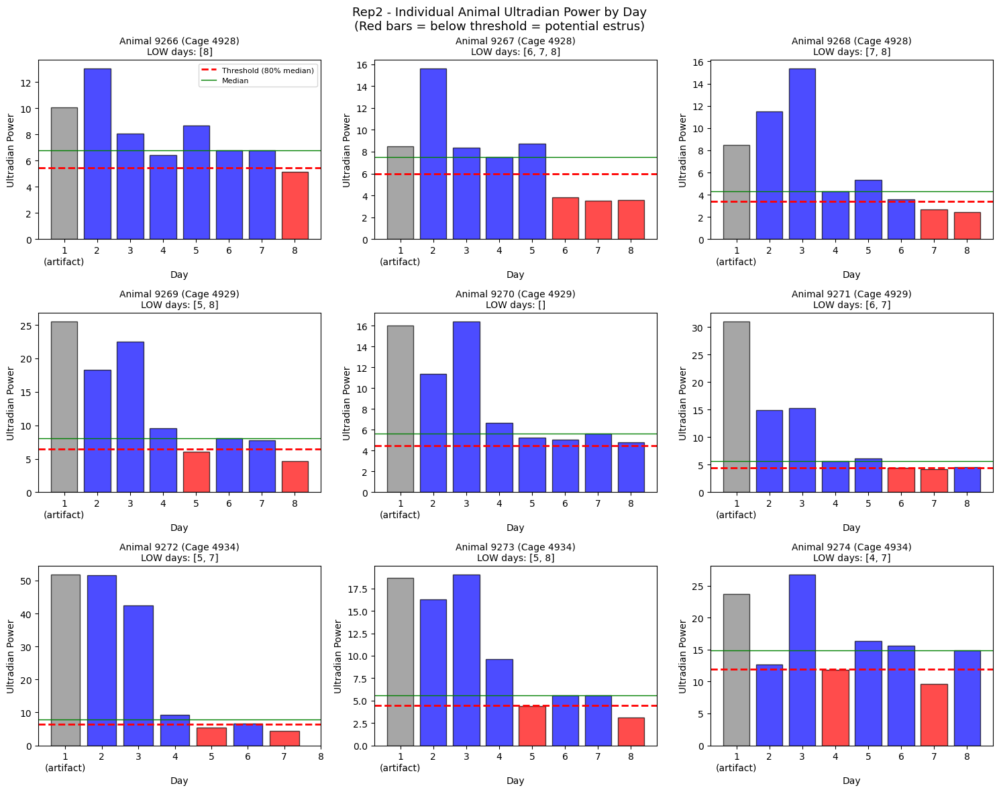


--- METHOD 4: Dip-and-Recovery Pattern ---
True cycling shows: HIGH → LOW → HIGH (recovery)
Habituation shows: HIGH → LOW → LOW (no recovery)

Animal     Cage     Pattern                                            Interpretation
----------------------------------------------------------------------------------------------------
9266       4928     Min=Day8(5.1) → No recovery                        ✗ WEAK: Looks like habituation
9267       4928     Min=Day7(3.5) → No recovery                        ✗ WEAK: Looks like habituation
9268       4928     Min=Day8(2.5) → No recovery                        ✗ WEAK: Looks like habituation
9269       4929     Min=Day8(4.6) → No recovery                        ✗ WEAK: Looks like habituation
9270       4929     Min=Day8(4.8) → No recovery                        ✗ WEAK: Looks like habituation
9271       4929     Min=Day7(4.2) → No recovery                        ✗ WEAK: Looks like habituation
9272       4934     Min=Day7(4.5) → No recovery          

In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

# =============================================================================
# PROPER 4-DAY CYCLE DETECTION
# =============================================================================
print("="*80)
print("PROPER ESTROUS CYCLE DETECTION")
print("="*80)
print("""
Logic:
- Estrus = LOW ultradian power (below threshold)
- 4-day cycle = LOW days should be ~4 days apart
- In 8 days, we expect 2 estrus events (e.g., Day 1 & 5, or Day 2 & 6, etc.)

Method:
1. For each animal, calculate median ultradian power
2. Mark days as "LOW" if below threshold (e.g., 80% of median)
3. Check if LOW days are spaced 4 days apart
4. Test multiple thresholds to find robust patterns
""")

# =============================================================================
# ANALYZE BOTH REPLICATES
# =============================================================================
for rep, cfg in VEHICLE_CAGES.items():
    print(f"\n{'='*80}")
    print(f"{rep} - INDIVIDUAL ANIMAL CYCLE DETECTION")
    print(f"{'='*80}")
    
    # Get data
    original_start = pd.to_datetime(cfg['analysis_start'])
    shifted_start = original_start + pd.Timedelta(hours=12)
    
    rep_data = df_dist[df_dist['replicate'] == rep].copy()
    if len(rep_data) == 0:
        continue
    
    rep_data['minutes_from_start'] = (rep_data['time'] - shifted_start).dt.total_seconds() / 60
    rep_data = rep_data[rep_data['minutes_from_start'] >= 0].copy()
    max_minutes = 8 * minutes_per_day
    rep_data = rep_data[rep_data['minutes_from_start'] < max_minutes].copy()
    
    animals = sorted([a for a in rep_data['animal_id'].unique() if a != 0])
    
    # Store results for all animals
    all_animal_data = []
    
    for animal_id in animals:
        animal_data = rep_data[rep_data['animal_id'] == animal_id].copy()
        cage_id = animal_data['cage_id'].iloc[0]
        
        # Create time series
        animal_data['minute_bin'] = animal_data['minutes_from_start'].round().astype(int)
        minute_avg = animal_data.groupby('minute_bin')['value'].mean()
        
        max_min = min(int(minute_avg.index.max()), max_minutes - 1)
        full_series = pd.Series(index=range(max_min + 1), dtype=float)
        full_series.update(minute_avg)
        animal_ts = full_series.values
        
        if len(animal_ts) < 7 * minutes_per_day:
            continue
        
        # Compute wavelet
        power, periods = compute_wavelet_transform(animal_ts, periods_minutes)
        ultradian = extract_band_power(power, periods, (1, 3))
        
        # Day-by-day power (excluding Day 1 due to artifact)
        day_powers = []
        for day in range(1, 9):
            day_start = (day - 1) * minutes_per_day
            day_end = day * minutes_per_day
            if day_end <= len(ultradian):
                day_powers.append(np.nanmean(ultradian[day_start:day_end]))
            else:
                day_powers.append(np.nan)
        
        all_animal_data.append({
            'animal_id': animal_id,
            'cage_id': cage_id,
            'day_powers': day_powers,
            'ultradian': ultradian
        })
    
    # =============================================================================
    # METHOD 1: Below-median detection
    # =============================================================================
    print(f"\n--- METHOD 1: Days below individual median (excl. Day 1) ---")
    print(f"A day is 'LOW' if ultradian power < 80% of animal's median")
    print()
    
    threshold_pct = 0.80  # Below 80% of median = LOW
    
    print(f"{'Animal':<10} {'Cage':<8} {'Day2':<6} {'Day3':<6} {'Day4':<6} {'Day5':<6} {'Day6':<6} {'Day7':<6} {'Day8':<6} {'LOW days':<15} {'4-day pattern?'}")
    print("-"*110)
    
    cycle_detected = []
    
    for data in all_animal_data:
        animal_id = data['animal_id']
        cage_id = data['cage_id']
        day_powers = data['day_powers']
        
        # Calculate median (excluding Day 1)
        valid_powers = [p for p in day_powers[1:] if not np.isnan(p)]  # Days 2-8
        if not valid_powers:
            continue
        median_power = np.median(valid_powers)
        threshold = median_power * threshold_pct
        
        # Mark LOW days (excluding Day 1)
        low_days = []
        day_labels = []
        for day in range(2, 9):  # Days 2-8
            idx = day - 1
            if idx < len(day_powers) and not np.isnan(day_powers[idx]):
                is_low = day_powers[idx] < threshold
                low_days.append(day if is_low else None)
                day_labels.append("LOW" if is_low else "---")
            else:
                day_labels.append("N/A")
        
        low_days_clean = [d for d in low_days if d is not None]
        
        # Check for 4-day spacing
        has_4day_pattern = False
        pattern_desc = ""
        
        for d in low_days_clean:
            if d + 4 in low_days_clean:
                has_4day_pattern = True
                pattern_desc = f"Day {d} & {d+4}"
                break
            if d - 4 in low_days_clean:
                has_4day_pattern = True
                pattern_desc = f"Day {d-4} & {d}"
                break
        
        if not has_4day_pattern and len(low_days_clean) >= 1:
            pattern_desc = "No 4-day pair"
        
        cycle_detected.append(has_4day_pattern)
        
        # Print row
        print(f"{animal_id:<10} {cage_id:<8}", end=" ")
        for lbl in day_labels:
            print(f"{lbl:<6}", end=" ")
        print(f"{str(low_days_clean):<15} {'✓ ' + pattern_desc if has_4day_pattern else '✗ ' + pattern_desc}")
    
    n_with_cycle = sum(cycle_detected)
    print("-"*110)
    print(f"Animals with 4-day pattern: {n_with_cycle}/{len(cycle_detected)} ({100*n_with_cycle/len(cycle_detected):.0f}%)")
    
    # =============================================================================
    # METHOD 2: Test multiple thresholds
    # =============================================================================
    print(f"\n--- METHOD 2: Threshold sensitivity analysis ---")
    print(f"Testing different thresholds to find robust patterns")
    print()
    
    thresholds_to_test = [0.70, 0.75, 0.80, 0.85, 0.90]
    
    print(f"{'Threshold':<12}", end="")
    for data in all_animal_data:
        print(f"{data['animal_id']:<10}", end="")
    print("Total w/cycle")
    print("-"*120)
    
    for thresh in thresholds_to_test:
        print(f"{thresh*100:.0f}% median  ", end="")
        
        n_cycles = 0
        for data in all_animal_data:
            day_powers = data['day_powers']
            valid_powers = [p for p in day_powers[1:] if not np.isnan(p)]
            if not valid_powers:
                print(f"{'N/A':<10}", end="")
                continue
            
            median_power = np.median(valid_powers)
            threshold = median_power * thresh
            
            low_days = [day for day in range(2, 9) 
                       if day-1 < len(day_powers) 
                       and not np.isnan(day_powers[day-1]) 
                       and day_powers[day-1] < threshold]
            
            # Check 4-day pattern
            has_pattern = any(d+4 in low_days or d-4 in low_days for d in low_days)
            
            print(f"{'✓' if has_pattern else '✗':<10}", end="")
            if has_pattern:
                n_cycles += 1
        
        print(f"{n_cycles}/{len(all_animal_data)}")
    
    # =============================================================================
    # METHOD 3: Visualize individual animals
    # =============================================================================
    print(f"\n--- METHOD 3: Individual animal day-by-day patterns ---")
    
    fig, axes = plt.subplots(3, 3, figsize=(15, 12))
    axes = axes.flatten()
    
    for idx, data in enumerate(all_animal_data[:9]):
        ax = axes[idx]
        animal_id = data['animal_id']
        cage_id = data['cage_id']
        day_powers = data['day_powers']
        
        days = list(range(1, len(day_powers) + 1))
        
        # Calculate median (excl Day 1)
        valid_powers = [p for p in day_powers[1:] if not np.isnan(p)]
        median_power = np.median(valid_powers) if valid_powers else 0
        threshold = median_power * 0.80
        
        # Bar colors
        colors = []
        for i, p in enumerate(day_powers):
            if i == 0:  # Day 1
                colors.append('gray')  # Artifact
            elif np.isnan(p):
                colors.append('white')
            elif p < threshold:
                colors.append('red')  # LOW = potential estrus
            else:
                colors.append('blue')
        
        bars = ax.bar(days, day_powers, color=colors, edgecolor='black', alpha=0.7)
        
        # Add threshold line
        ax.axhline(y=threshold, color='red', linestyle='--', linewidth=2, label=f'Threshold (80% median)')
        ax.axhline(y=median_power, color='green', linestyle='-', linewidth=1, label=f'Median')
        
        # Mark potential estrus days
        low_days = [d for d in range(2, 9) 
                   if d-1 < len(day_powers) 
                   and not np.isnan(day_powers[d-1]) 
                   and day_powers[d-1] < threshold]
        
        # Check for 4-day pattern
        has_pattern = any(d+4 in low_days or d-4 in low_days for d in low_days)
        pattern_str = "4-day cycle detected!" if has_pattern else f"LOW days: {low_days}"
        
        ax.set_title(f'Animal {animal_id} (Cage {cage_id})\n{pattern_str}', 
                    fontsize=10, color='green' if has_pattern else 'black')
        ax.set_xlabel('Day')
        ax.set_ylabel('Ultradian Power')
        ax.set_xticks(days)
        ax.set_xticklabels(['1\n(artifact)'] + [str(d) for d in range(2, 9)])
        
        if idx == 0:
            ax.legend(loc='upper right', fontsize=8)
    
    plt.suptitle(f'{rep} - Individual Animal Ultradian Power by Day\n(Red bars = below threshold = potential estrus)', fontsize=13)
    plt.tight_layout()
    plt.savefig(f'morph2rep_{rep}_individual_cycles.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # =============================================================================
    # METHOD 4: Check for RECOVERY pattern (dip then rise)
    # =============================================================================
    print(f"\n--- METHOD 4: Dip-and-Recovery Pattern ---")
    print(f"True cycling shows: HIGH → LOW → HIGH (recovery)")
    print(f"Habituation shows: HIGH → LOW → LOW (no recovery)")
    print()
    
    print(f"{'Animal':<10} {'Cage':<8} {'Pattern':<50} {'Interpretation'}")
    print("-"*100)
    
    for data in all_animal_data:
        animal_id = data['animal_id']
        cage_id = data['cage_id']
        day_powers = data['day_powers'][1:]  # Exclude Day 1
        
        if len(day_powers) < 6:
            continue
        
        # Find the minimum day (potential estrus)
        min_idx = np.nanargmin(day_powers)
        min_day = min_idx + 2  # Adjust for Day 2 start
        min_val = day_powers[min_idx]
        
        # Check if there's recovery AFTER the minimum
        if min_idx < len(day_powers) - 2:
            post_min_vals = day_powers[min_idx+1:min_idx+3]
            post_min_mean = np.nanmean(post_min_vals)
            recovery = post_min_mean > min_val * 1.2  # 20% increase = recovery
        else:
            recovery = False
            post_min_mean = np.nan
        
        # Check if there's a SECOND dip ~4 days later
        second_dip_idx = min_idx + 4 if min_idx + 4 < len(day_powers) else None
        if second_dip_idx is not None:
            second_dip_val = day_powers[second_dip_idx]
            median_power = np.nanmedian(day_powers)
            second_dip = second_dip_val < median_power * 0.85
        else:
            second_dip = False
        
        # Interpret
        pattern = f"Min=Day{min_day}({min_val:.1f})"
        if recovery:
            pattern += f" → Recovery({post_min_mean:.1f})"
        else:
            pattern += f" → No recovery"
        
        if second_dip:
            pattern += f" → 2nd dip Day{min_day+4}"
        
        if recovery and second_dip:
            interpretation = "✓ STRONG: Cycling likely"
        elif recovery:
            interpretation = "~ MODERATE: Recovery but no 2nd dip visible"
        elif second_dip:
            interpretation = "~ MODERATE: 2nd dip but no recovery"
        else:
            interpretation = "✗ WEAK: Looks like habituation"
        
        print(f"{animal_id:<10} {cage_id:<8} {pattern:<50} {interpretation}")

# =============================================================================
# SUMMARY STATISTICS
# =============================================================================
print("\n" + "="*80)
print("SUMMARY: EVIDENCE FOR ESTROUS CYCLING")
print("="*80)
print("""
For each replicate, report:
1. How many animals show LOW days below 80% median threshold?
2. How many of those have 4-day spacing between LOW days?
3. How many show recovery after the dip?
4. Overall assessment: cycling vs habituation
""")

FULL-LENGTH ESTROUS CYCLE DETECTION

With full data:
- Rep1: 16 days → expect 4 estrus events (e.g., Day 1, 5, 9, 13)
- Rep2: 14 days → expect 3-4 estrus events (e.g., Day 2, 6, 10, 14)

This is a MUCH better test for 4-day cycling!


Rep1 - FULL LENGTH ANALYSIS (12 days)
Animals: 9
Data range: 11.8 days
  Animal 9257: 11.8 days, computing wavelet... done (11 complete days)
  Animal 9258: 11.8 days, computing wavelet... done (11 complete days)


/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_8

  Animal 9259: 11.8 days, computing wavelet... done (11 complete days)
  Animal 9260: 11.8 days, computing wavelet... done (11 complete days)
  Animal 9261: 11.8 days, computing wavelet... 

/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_8

done (11 complete days)
  Animal 9262: 11.8 days, computing wavelet... done (11 complete days)
  Animal 9263: 11.8 days, computing wavelet... done (11 complete days)


/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_8

  Animal 9264: 11.8 days, computing wavelet... done (11 complete days)
  Animal 9265: 11.8 days, computing wavelet... done (11 complete days)

--- DAY-BY-DAY ULTRADIAN POWER ---
Animal     Cage    D2     D3     D4     D5     D6     D7     D8     D9     D10    D11    
-----------------------------------------------------------------------------------------
9257       4918    11.4   7.2    6.3    4.5    9.7    6.6    9.3    3.0    4.4    3.6    
9258       4918    45.1   27.2   16.3   22.9   35.0   30.4   22.2   28.2   8.9    20.9   
9259       4918    14.2   6.4    8.0    4.4    8.5    7.6    4.9    3.3    6.6    3.0    
9260       4922    11.6   14.0   4.5    3.5    11.1   4.9    5.1    3.0    3.2    7.7    
9261       4922    13.7   17.3   9.5    12.8   6.9    13.0   8.3    5.7    8.2    7.2    
9262       4922    10.6   7.0    6.2    8.6    4.1    4.3    4.9    3.1    6.1    4.7    
9263       4923    13.8   22.5   5.0    3.5    8.3    6.2    4.3    2.6    4.2    4.5    
9264       4

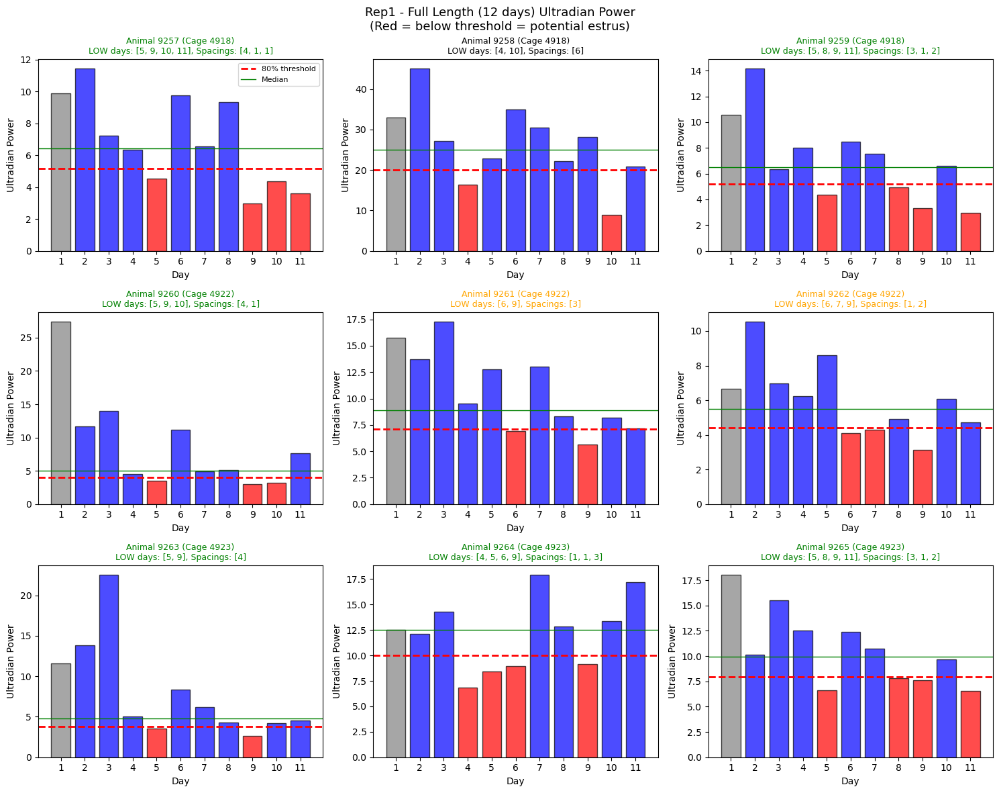


--- PHASE CONSISTENCY CHECK ---
If mice are cycling, LOW days should cluster at similar phases (e.g., all on Day 2,6,10...)

LOW days converted to 4-day phase (0-3):
  Phase 0 (Days 1,5,9,13): 14
  Phase 1 (Days 2,6,10,14): 6
  Phase 2 (Days 3,7,11,15): 4
  Phase 3 (Days 4,8,12,16): 4

Chi-square test for phase clustering: χ²=9.71, p=0.0212
  → Significant clustering! Dominant phase: 0

Rep2 - FULL LENGTH ANALYSIS (10 days)
Animals: 9
Data range: 10.0 days
  Animal 9266: 10.0 days, computing wavelet... done (10 complete days)
  Animal 9267: 10.0 days, computing wavelet... 

/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)


done (10 complete days)
  Animal 9268: 10.0 days, computing wavelet... done (10 complete days)
  Animal 9269: 9.2 days, computing wavelet... done (9 complete days)


/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_8

  Animal 9270: 9.2 days, computing wavelet... done (9 complete days)
  Animal 9271: 9.2 days, computing wavelet... done (9 complete days)


/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)


  Animal 9272: 10.0 days, computing wavelet... done (10 complete days)
  Animal 9273: 10.0 days, computing wavelet... 

/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)
/tmp/ipykernel_899/1963746039.py:39: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = pd.Series(data).interpolate().fillna(method='bfill').fillna(method='ffill').fillna(0).values
/tmp/ipykernel_899/1963746039.py:51: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coeffs = cwt(data, morlet2, scales, w=w)


done (10 complete days)
  Animal 9274: 10.0 days, computing wavelet... done (10 complete days)

--- DAY-BY-DAY ULTRADIAN POWER ---
Animal     Cage    D2     D3     D4     D5     D6     D7     D8     D9     D10    
----------------------------------------------------------------------------------
9266       4928    13.0   8.1    6.4    8.7    6.8    6.8    5.1    14.0   5.4    
9267       4928    15.6   8.3    7.5    8.8    3.8    3.5    3.6    7.8    7.0    
9268       4928    11.5   15.4   4.3    5.3    3.6    2.7    2.4    4.9    3.9    
9269       4929    18.3   22.5   9.5    6.0    8.1    7.8    4.7    4.1    ---    
9270       4929    11.4   16.4   6.7    5.3    5.0    5.6    4.7    12.4   ---    
9271       4929    14.9   15.2   5.6    6.2    4.4    4.2    4.5    4.7    ---    
9272       4934    51.6   42.5   9.2    5.5    6.6    4.5    4.1    8.5    10.1   
9273       4934    16.3   19.0   9.6    4.4    5.6    5.6    3.4    9.6    11.1   
9274       4934    12.7   26.7   11.8  

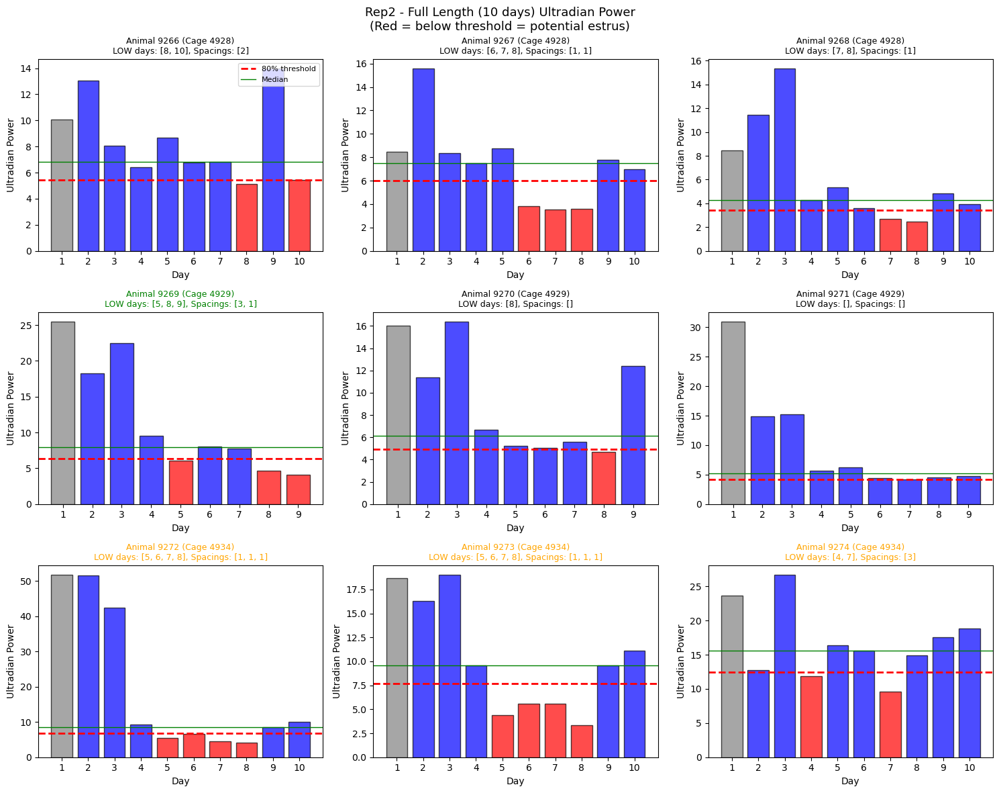


--- PHASE CONSISTENCY CHECK ---
If mice are cycling, LOW days should cluster at similar phases (e.g., all on Day 2,6,10...)

LOW days converted to 4-day phase (0-3):
  Phase 0 (Days 1,5,9,13): 4
  Phase 1 (Days 2,6,10,14): 4
  Phase 2 (Days 3,7,11,15): 5
  Phase 3 (Days 4,8,12,16): 8

Chi-square test for phase clustering: χ²=2.05, p=0.5626
  → No significant clustering (random distribution)

FINAL SUMMARY


In [64]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

# =============================================================================
# FULL-LENGTH ESTROUS CYCLE DETECTION (16 days Rep1, 14 days Rep2)
# =============================================================================
print("="*80)
print("FULL-LENGTH ESTROUS CYCLE DETECTION")
print("="*80)
print("""
With full data:
- Rep1: 16 days → expect 4 estrus events (e.g., Day 1, 5, 9, 13)
- Rep2: 14 days → expect 3-4 estrus events (e.g., Day 2, 6, 10, 14)

This is a MUCH better test for 4-day cycling!
""")

# Update config to use full data range
VEHICLE_CAGES_FULL = {
    "Rep1": {
        "cages": [4918, 4922, 4923],
        "analysis_start": "2025-01-10 06:00:00",
        "analysis_end": "2025-01-22 06:00:00",  # 12 days baseline + treatment
        "n_days": 12,
    },
    "Rep2": {
        "cages": [4928, 4929, 4934],
        "analysis_start": "2025-01-25 06:00:00",
        "analysis_end": "2025-02-04 06:00:00",  # 10 days
        "n_days": 10,
    },
}

for rep, cfg in VEHICLE_CAGES_FULL.items():
    print(f"\n{'='*80}")
    print(f"{rep} - FULL LENGTH ANALYSIS ({cfg['n_days']} days)")
    print(f"{'='*80}")
    
    # Get data with shifted start (6PM = lights off)
    original_start = pd.to_datetime(cfg['analysis_start'])
    shifted_start = original_start + pd.Timedelta(hours=12)
    
    rep_data = df_dist[df_dist['replicate'] == rep].copy()
    if len(rep_data) == 0:
        print(f"No data for {rep}")
        continue
    
    rep_data['minutes_from_start'] = (rep_data['time'] - shifted_start).dt.total_seconds() / 60
    rep_data = rep_data[rep_data['minutes_from_start'] >= 0].copy()
    
    # Use FULL data range
    max_minutes = cfg['n_days'] * minutes_per_day
    rep_data = rep_data[rep_data['minutes_from_start'] < max_minutes].copy()
    
    animals = sorted([a for a in rep_data['animal_id'].unique() if a != 0])
    
    print(f"Animals: {len(animals)}")
    print(f"Data range: {rep_data['minutes_from_start'].max() / 1440:.1f} days")
    
    # =============================================================================
    # COMPUTE WAVELET FOR FULL TIME SERIES
    # =============================================================================
    all_animal_data = []
    
    for animal_id in animals:
        animal_data = rep_data[rep_data['animal_id'] == animal_id].copy()
        cage_id = animal_data['cage_id'].iloc[0]
        
        # Create time series
        animal_data['minute_bin'] = animal_data['minutes_from_start'].round().astype(int)
        minute_avg = animal_data.groupby('minute_bin')['value'].mean()
        
        max_min = min(int(minute_avg.index.max()), max_minutes - 1)
        full_series = pd.Series(index=range(max_min + 1), dtype=float)
        full_series.update(minute_avg)
        animal_ts = full_series.values
        
        n_days_actual = len(animal_ts) / minutes_per_day
        
        if n_days_actual < 6:
            print(f"  Animal {animal_id}: insufficient data ({n_days_actual:.1f} days), skipping")
            continue
        
        print(f"  Animal {animal_id}: {n_days_actual:.1f} days, computing wavelet...", end=" ")
        
        # Compute wavelet
        power, periods = compute_wavelet_transform(animal_ts, periods_minutes)
        ultradian = extract_band_power(power, periods, (1, 3))
        
        # Day-by-day power
        n_complete_days = int(len(ultradian) / minutes_per_day)
        day_powers = []
        for day in range(1, n_complete_days + 1):
            day_start = (day - 1) * minutes_per_day
            day_end = day * minutes_per_day
            if day_end <= len(ultradian):
                day_powers.append(np.nanmean(ultradian[day_start:day_end]))
            else:
                day_powers.append(np.nan)
        
        all_animal_data.append({
            'animal_id': animal_id,
            'cage_id': cage_id,
            'day_powers': day_powers,
            'n_days': n_complete_days,
            'ultradian': ultradian
        })
        
        print(f"done ({n_complete_days} complete days)")
    
    if not all_animal_data:
        continue
    
    # =============================================================================
    # DAY-BY-DAY TABLE
    # =============================================================================
    print(f"\n--- DAY-BY-DAY ULTRADIAN POWER ---")
    
    max_days = max(d['n_days'] for d in all_animal_data)
    
    # Header
    header = f"{'Animal':<10} {'Cage':<8}"
    for d in range(2, max_days + 1):  # Start from Day 2 (excl Day 1 artifact)
        header += f"{'D'+str(d):<7}"
    print(header)
    print("-" * len(header))
    
    for data in all_animal_data:
        row = f"{data['animal_id']:<10} {data['cage_id']:<8}"
        for d in range(2, max_days + 1):
            idx = d - 1
            if idx < len(data['day_powers']):
                val = data['day_powers'][idx]
                row += f"{val:<7.1f}" if not np.isnan(val) else f"{'N/A':<7}"
            else:
                row += f"{'---':<7}"
        print(row)
    
    # =============================================================================
    # THRESHOLD-BASED LOW DAY DETECTION
    # =============================================================================
    print(f"\n--- LOW DAYS DETECTION (< 80% of median, excl Day 1) ---")
    
    threshold_pct = 0.80
    
    print(f"{'Animal':<10} {'Cage':<8} {'LOW days':<30} {'Spacings':<25} {'4-day cycles?'}")
    print("-"*100)
    
    cycle_results = []
    
    for data in all_animal_data:
        animal_id = data['animal_id']
        cage_id = data['cage_id']
        day_powers = data['day_powers']
        
        # Median excluding Day 1
        valid_powers = [p for i, p in enumerate(day_powers) if i > 0 and not np.isnan(p)]
        if not valid_powers:
            continue
        
        median_power = np.median(valid_powers)
        threshold = median_power * threshold_pct
        
        # Find LOW days (excluding Day 1)
        low_days = []
        for day in range(2, len(day_powers) + 1):
            idx = day - 1
            if not np.isnan(day_powers[idx]) and day_powers[idx] < threshold:
                low_days.append(day)
        
        # Calculate spacings between consecutive LOW days
        spacings = []
        for i in range(1, len(low_days)):
            spacings.append(low_days[i] - low_days[i-1])
        
        # Check for 4-day pattern (spacing of 4 ± 1)
        n_4day_spacings = sum(1 for s in spacings if 3 <= s <= 5)
        
        # Also check if any pair of LOW days is exactly 4 apart
        has_exact_4 = any(d2 - d1 == 4 for d1 in low_days for d2 in low_days if d2 > d1)
        has_approx_4 = any(3 <= d2 - d1 <= 5 for d1 in low_days for d2 in low_days if d2 > d1)
        
        # Expected number of estrus events
        n_days = len(day_powers)
        expected_estrus = n_days // 4
        
        # Assess cycling
        if len(low_days) >= expected_estrus and has_exact_4:
            assessment = f"✓ STRONG ({n_4day_spacings} cycles)"
        elif len(low_days) >= 2 and has_approx_4:
            assessment = f"~ MODERATE"
        elif len(low_days) >= 2:
            assessment = f"? IRREGULAR spacing"
        else:
            assessment = f"✗ Insufficient LOW days"
        
        cycle_results.append({
            'animal_id': animal_id,
            'low_days': low_days,
            'spacings': spacings,
            'has_4day': has_exact_4,
            'n_cycles': n_4day_spacings,
            'assessment': assessment
        })
        
        print(f"{animal_id:<10} {cage_id:<8} {str(low_days):<30} {str(spacings):<25} {assessment}")
    
    # =============================================================================
    # SUMMARY
    # =============================================================================
    n_strong = sum(1 for r in cycle_results if '✓' in r['assessment'])
    n_moderate = sum(1 for r in cycle_results if '~' in r['assessment'])
    n_irregular = sum(1 for r in cycle_results if '?' in r['assessment'])
    n_none = sum(1 for r in cycle_results if '✗' in r['assessment'])
    
    print("-"*100)
    print(f"SUMMARY:")
    print(f"  Strong cycling evidence (4-day spacing):   {n_strong}/{len(cycle_results)}")
    print(f"  Moderate evidence (3-5 day spacing):       {n_moderate}/{len(cycle_results)}")
    print(f"  Irregular spacing:                         {n_irregular}/{len(cycle_results)}")
    print(f"  Insufficient/No pattern:                   {n_none}/{len(cycle_results)}")
    
    # =============================================================================
    # VISUALIZE INDIVIDUAL ANIMALS
    # =============================================================================
    n_animals = len(all_animal_data)
    n_cols = 3
    n_rows = (n_animals + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4*n_rows))
    axes = axes.flatten() if n_rows > 1 else [axes] if n_cols == 1 else axes.flatten()
    
    for idx, data in enumerate(all_animal_data):
        ax = axes[idx]
        animal_id = data['animal_id']
        cage_id = data['cage_id']
        day_powers = data['day_powers']
        
        days = list(range(1, len(day_powers) + 1))
        
        # Threshold
        valid_powers = [p for i, p in enumerate(day_powers) if i > 0 and not np.isnan(p)]
        median_power = np.median(valid_powers) if valid_powers else 0
        threshold = median_power * 0.80
        
        # Colors
        colors = []
        for i, p in enumerate(day_powers):
            if i == 0:
                colors.append('gray')  # Day 1 artifact
            elif np.isnan(p):
                colors.append('white')
            elif p < threshold:
                colors.append('red')  # LOW = potential estrus
            else:
                colors.append('blue')
        
        ax.bar(days, day_powers, color=colors, edgecolor='black', alpha=0.7)
        ax.axhline(y=threshold, color='red', linestyle='--', linewidth=2, label='80% threshold')
        ax.axhline(y=median_power, color='green', linestyle='-', linewidth=1, label='Median')
        
        # Find LOW days for this animal
        result = next((r for r in cycle_results if r['animal_id'] == animal_id), None)
        if result:
            title_extra = f"\nLOW days: {result['low_days']}, Spacings: {result['spacings']}"
            title_color = 'green' if '✓' in result['assessment'] else 'orange' if '~' in result['assessment'] else 'black'
        else:
            title_extra = ""
            title_color = 'black'
        
        ax.set_title(f"Animal {animal_id} (Cage {cage_id}){title_extra}", fontsize=9, color=title_color)
        ax.set_xlabel('Day')
        ax.set_ylabel('Ultradian Power')
        ax.set_xticks(days)
        
        if idx == 0:
            ax.legend(loc='upper right', fontsize=8)
    
    # Hide unused subplots
    for idx in range(len(all_animal_data), len(axes)):
        axes[idx].axis('off')
    
    plt.suptitle(f'{rep} - Full Length ({cfg["n_days"]} days) Ultradian Power\n(Red = below threshold = potential estrus)', fontsize=13)
    plt.tight_layout()
    plt.savefig(f'morph2rep_{rep}_full_cycles.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # =============================================================================
    # CHECK FOR CONSISTENT PHASE ACROSS ANIMALS
    # =============================================================================
    print(f"\n--- PHASE CONSISTENCY CHECK ---")
    print("If mice are cycling, LOW days should cluster at similar phases (e.g., all on Day 2,6,10...)")
    print()
    
    all_low_days = []
    for r in cycle_results:
        all_low_days.extend(r['low_days'])
    
    # Convert to phase within 4-day cycle (0, 1, 2, or 3)
    phases = [(d - 1) % 4 for d in all_low_days]  # Day 1,5,9,13 → phase 0; Day 2,6,10 → phase 1; etc.
    
    phase_counts = Counter(phases)
    print(f"LOW days converted to 4-day phase (0-3):")
    print(f"  Phase 0 (Days 1,5,9,13): {phase_counts.get(0, 0)}")
    print(f"  Phase 1 (Days 2,6,10,14): {phase_counts.get(1, 0)}")
    print(f"  Phase 2 (Days 3,7,11,15): {phase_counts.get(2, 0)}")
    print(f"  Phase 3 (Days 4,8,12,16): {phase_counts.get(3, 0)}")
    
    # Chi-square test for uniform distribution
    from scipy.stats import chisquare
    observed = [phase_counts.get(i, 0) for i in range(4)]
    expected = [len(all_low_days) / 4] * 4
    
    if sum(observed) >= 4:
        stat, p = chisquare(observed, expected)
        print(f"\nChi-square test for phase clustering: χ²={stat:.2f}, p={p:.4f}")
        if p < 0.05:
            dominant_phase = max(phase_counts, key=phase_counts.get)
            print(f"  → Significant clustering! Dominant phase: {dominant_phase}")
        else:
            print(f"  → No significant clustering (random distribution)")

print("\n" + "="*80)
print("FINAL SUMMARY")
print("="*80)